In [1]:
# import libraries
import os

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import scipy.stats as stats
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.diagnostic import linear_rainbow, het_breuschpagan
from statsmodels.stats.stattools import jarque_bera
from statsmodels.stats.outliers_influence import variance_inflation_factor

from sklearn.preprocessing import LabelEncoder, OneHotEncoder

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
path_to_processed = os.path.join('..', '..', 'data', 'processed')
df = pd.read_pickle(os.path.join(path_to_processed, 'df_1.pkl'))
df_mapped = pd.read_pickle(os.path.join(path_to_processed, 'df_2.pkl'))

For the purpose of this project, I will just focus on one specific type of property **"Household, single family units"** since they take up a portion among all the residential types of properties in the dataset. 

In [3]:
df_1 = df_mapped[df_mapped.PropertyType == 'Household, single family units'].copy()

In [4]:
df_1.head()

,PIN,SalePrice,ExciseTaxNbr,DocumentDate,RecordingNbr,PropertyType,PropertyClass,BldgNbr,NbrLivingUnits,Address,...,SewerSystem,StreetSurface,RestrictiveSzShape,InadequateParking,PcntUnusable,LotDepthFactor,TrafficNoise,NbrBldgSites,Contamination,WaterProblems
0,2130430120,560000,3027422,2019-12-20,20191226000848,"Household, single family units",Res-Improved property,1,1,27033 NE DOROTHY ST 98019,...,PUBLIC,PAVED,0,0,0,0,0,0,0,N
1,9406520630,435000,3002257,2019-07-22,20190730001339,"Household, single family units",Res-Improved property,1,1,22848 SE 264TH CT 98038,...,PUBLIC,PAVED,0,0,0,0,0,0,0,N
8,3470500040,648500,2982060,2019-04-04,,"Household, single family units",Res-Improved property,1,1,26034 231ST PL SE,...,PUBLIC,PAVED,0,0,0,0,0,0,0,N
11,0302000645,380000,2976405,2019-03-04,20190306000786,"Household, single family units",Res-Improved property,1,1,30810 55TH AVE S 98001,...,PRIVATE,PAVED,0,ADEQUATE,0,0,0,5,0,N
14,0826079096,930000,2997972,2019-06-28,20190705000858,"Household, single family units",Res-Improved property,1,1,30606 NE 183RD ST 98019,...,PRIVATE,GRAVEL,0,ADEQUATE,0,0,0,0,0,N


In [5]:
df_1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18320 entries, 0 to 821
Data columns (total 60 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   PIN                 18320 non-null  object        
 1   SalePrice           18320 non-null  int64         
 2   ExciseTaxNbr        18320 non-null  object        
 3   DocumentDate        18320 non-null  datetime64[ns]
 4   RecordingNbr        18320 non-null  object        
 5   PropertyType        18320 non-null  object        
 6   PropertyClass       18320 non-null  object        
 7   BldgNbr             18320 non-null  object        
 8   NbrLivingUnits      18320 non-null  int64         
 9   Address             18320 non-null  object        
 10  Stories             18320 non-null  float64       
 11  BldgGrade           18320 non-null  object        
 12  SqFt1stFloor        18320 non-null  int64         
 13  SqFtHalfFloor       18320 non-null  int64       

This current version of the dataset that I will be using for first round of model fitting contains 18,320 data points and 60 columns.

## Baseline Model

The goal for now is to get a baseline model up and running.

### Data Understanding

I will start with a histogram with kde of `SalePrice` to see how the distribution of our target variable looks like.

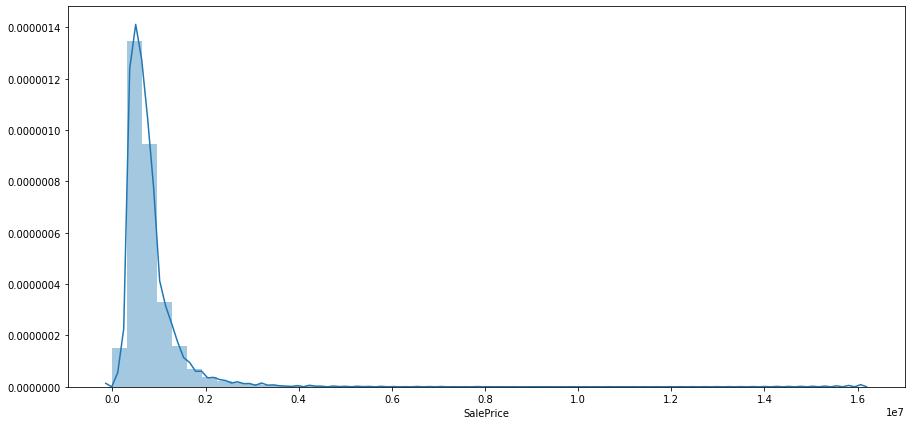

In [6]:
fig, ax = plt.subplots(figsize=(15,7))
sns.distplot(df_1.SalePrice);

`SalePrice` is right skewed --> will definitely need to remove outliers in `SalePrice` later on.

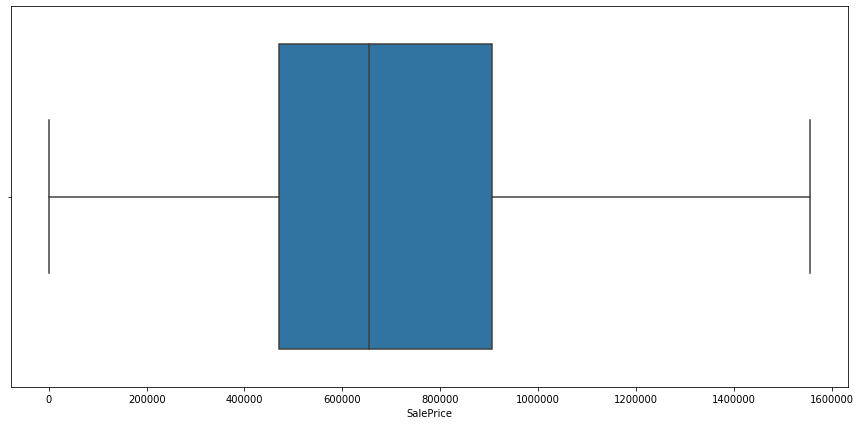

In [7]:
# boxplot with 'showfliers=False' to see how it might look like without the large valued outliers
fig, ax = plt.subplots(figsize=(15,7))
sns.boxplot(df_1.SalePrice, showfliers=False);

In [8]:
df_1.describe()

,SalePrice,NbrLivingUnits,Stories,SqFt1stFloor,SqFtHalfFloor,SqFt2ndFloor,SqFtUpperFloor,SqFtUnfinFull,SqFtUnfinHalf,SqFtTotLiving,...,BathFullCount,YrBuilt,YrRenovated,PcntComplete,PcntNetCondition,AddnlCost,SqFtLot,PcntUnusable,LotDepthFactor,NbrBldgSites
count,1.832000e+04,18320.000000,18320.000000,18320.000000,18320.000000,18320.000000,18320.000000,18320.000000,18320.000000,18320.000000,...,18320.000000,18320.000000,18320.000000,18320.000000,18320.000000,18320.000000,18320.000000,18320.000000,18320.000000,18320.000000
mean,7.935137e+05,1.009116,1.515366,1271.200055,45.382369,513.277784,13.016321,0.624454,0.509389,2145.032096,...,1.578493,1974.594814,98.141921,0.278275,0.001365,713.285862,15254.035153,0.003275,0.053930,0.006004
std,5.876729e+05,0.106935,0.533778,498.862584,166.818538,660.336520,88.501267,21.941439,16.267978,967.268953,...,0.699876,30.430402,432.055811,4.784221,0.107314,2564.182713,38562.405672,0.316219,2.119946,0.107409
min,1.000000e+01,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,...,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,375.000000,0.000000,0.000000,0.000000
25%,4.700000e+05,1.000000,1.000000,960.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1450.000000,...,1.000000,1954.000000,0.000000,0.000000,0.000000,0.000000,5040.000000,0.000000,0.000000,0.000000
50%,6.550000e+05,1.000000,1.500000,1210.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1970.000000,...,1.000000,1978.000000,0.000000,0.000000,0.000000,0.000000,7593.000000,0.000000,0.000000,0.000000
75%,9.050000e+05,1.000000,2.000000,1490.000000,0.000000,1020.000000,0.000000,0.000000,0.000000,2630.000000,...,2.000000,2001.000000,0.000000,0.000000,0.000000,0.000000,10768.000000,0.000000,0.000000,0.000000
max,1.605000e+07,3.000000,3.500000,6070.000000,2160.000000,5110.000000,1800.000000,1350.000000,920.000000,10910.000000,...,7.000000,2020.000000,2020.000000,100.000000,10.000000,60000.000000,897336.000000,34.000000,105.000000,5.000000


In [9]:
corr1 = df_1.corr()
corr1.SalePrice.sort_values(ascending=False)

SalePrice             1.000000
SqFtTotLiving         0.621684
SqFt1stFloor          0.401388
SqFt2ndFloor          0.382351
BathFullCount         0.320876
SqFtFinBasement       0.288444
SqFtOpenPorch         0.274658
Bedrooms              0.273552
SqFtTotBasement       0.268104
Stories               0.250264
Bath3qtrCount         0.233517
BathHalfCount         0.221975
SqFtDeck              0.206602
SqFtGarageAttached    0.171604
YrRenovated           0.116915
AddnlCost             0.102764
YrBuilt               0.088981
SqFtUpperFloor        0.077235
BrickStone            0.077179
SqFtLot               0.074171
SqFtHalfFloor         0.066321
LotDepthFactor        0.055977
SqFtGarageBasement    0.051505
PcntComplete          0.049037
NbrBldgSites          0.010657
NbrLivingUnits        0.010211
SqFtEnclosedPorch     0.008784
PcntUnusable          0.007799
SqFtUnfinFull         0.004044
SqFtUnfinHalf         0.002736
PcntNetCondition     -0.006144
Name: SalePrice, dtype: float64

In [10]:
def corr_heatmap(corr):
    mask = np.triu(np.ones_like(corr, dtype=np.bool))
    fig1, ax1 = plt.subplots(figsize=(20,15))
    sns.heatmap(corr, mask=mask, ax=ax1, cmap='viridis');

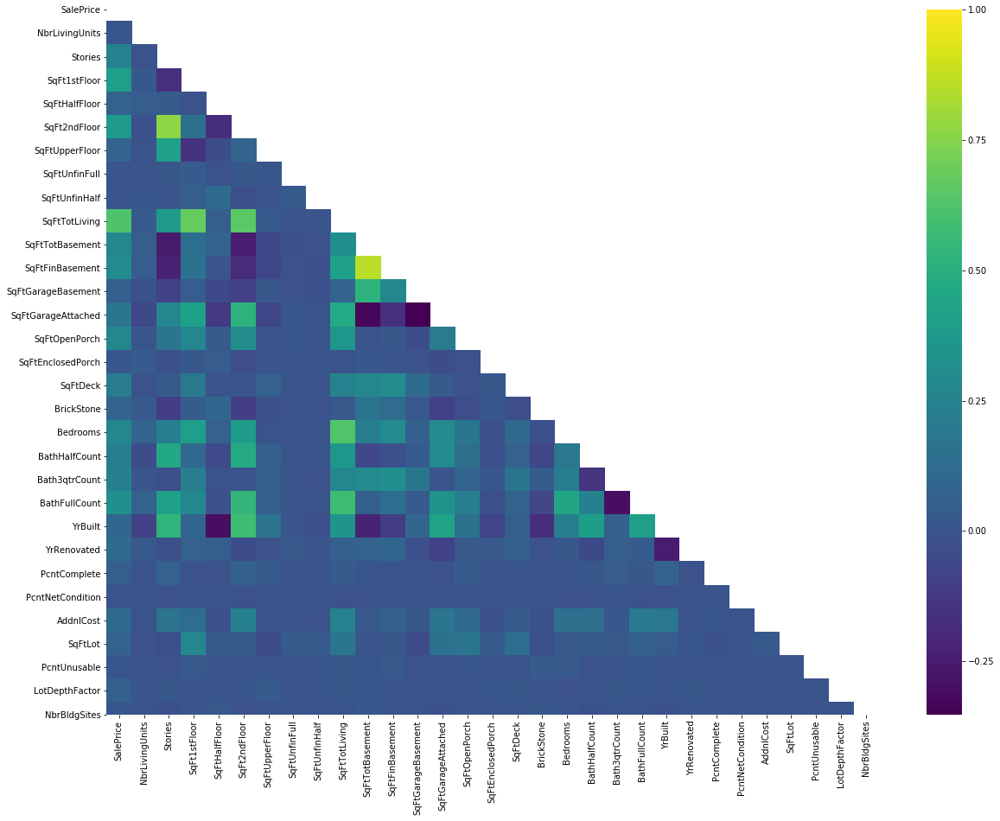

In [11]:
corr_heatmap(corr1)

Looking at the heatmap above, there is multicollinearity between different numeric features. I will need to engineer these features to either remove some of them, or somehow combine them into one. 

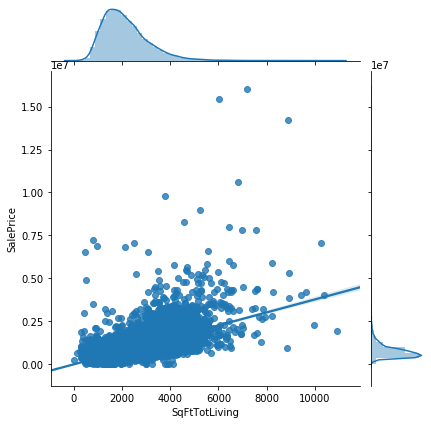

In [12]:
sns.jointplot(data=df_1, x='SqFtTotLiving', y='SalePrice', kind="reg");

- As of now, `SqFtTotLiving` seems to have the highest positive correlation with `SalePrice` at 0.621684, which is not bad. 
- A quick visual check of Linearity between `SqFtTotLiving` and `SalePrice` using seaborn's `.jointplot()` shows that:
    - both are normally distributed
    - both are heavily right skewed (meaning there are minorities of very large values)
    - the relationship between the two are pretty linear for the most part, with some outliers seems to be pulling the line upwards a little bit. 
    
--> definitely need to apply log and/or other types of transformation on these variables later along with removing some of the outliers to reduce skewness. 

But first, I will proceed to do the first simple model with just 1 predictor `SqFtTotLiving` without any cleaning or transformations to see how our results look.

### First Simple Model

In [13]:
sm_1_df = df_1[['SalePrice', 'SqFtTotLiving']].copy()

In [14]:
sm_1_df.isna().sum()

SalePrice        0
SqFtTotLiving    0
dtype: int64

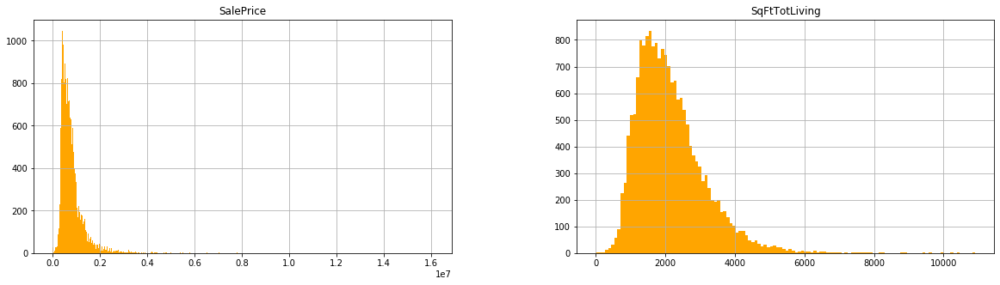

In [15]:
sm_1_df.hist(figsize=(20,5), color='orange', bins='auto');

In [16]:
def get_predictors(df, outcome):
    """
    Return a list of predictors based on the specified outcome column of a dataset
    """
    return [c for c in df.columns if c != outcome]

In [17]:
# a function that create the formula based on target and predictors passed in 
def create_formula(outcome, predictors):
    """
    Return a string formula for statsmodels OLS
    """
    f = outcome + ' ~ ' + ' + '.join(predictors)
    return f

In [18]:
outcome = 'SalePrice'
predictors = get_predictors(sm_1_df, outcome)
formula = create_formula(outcome, predictors)
sm_1 = ols(formula=formula, data=sm_1_df).fit()
sm_1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.386
Model:                            OLS   Adj. R-squared:                  0.386
Method:                 Least Squares   F-statistic:                 1.154e+04
Date:                Wed, 03 Mar 2021   Prob (F-statistic):               0.00
Time:                        18:56:29   Log-Likelihood:            -2.6488e+05
No. Observations:               18320   AIC:                         5.298e+05
Df Residuals:                   18318   BIC:                         5.298e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept     -1.669e+04   8273.441     -2.017      0.044   -3.29e+04    -468.867
SqFtTotLiving   377.7096      3.516    107.423      0.000     370.818     384.601
==============================================================================
Omnibus:                    23794.512   Durbin-Watson:                   2.001
Prob(Omnibus):                  0.000   Jarque-Bera (JB):         13050553.171
Skew:                           6.856   Prob(JB):                         0.00
Kurtosis:                     133.034   Cond. No.                     5.72e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.72e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

### Model Evaluation

This first simple model is currently able to explain about 38.6% the variance of `SalePrice`, which is not a bad start, given that this model only has 1 feature. p-value for the Intercept is 0.044, which is quite close to our significance level of 0.05, but technically still considered "statistically significant." Coefficient for `SqFtTotLiving` has a p-value of 0.000 (< 0.05) so it is also statistically significant.

- This first simple model is currently predicting a sale price of USD -16,690 when total living space is 0 sqft, which is kind of strange.
- And with an increase of 1 sqft in total living space, the sale price is expected to increase by USD 377.7096, which seems to be on the higher side of average price per sqft in the US (compared to various sources on the internet).

As I will most likely have to repeat the checking of the Linear Regression assumptions a number of times moving forwards, I am creating a function that combines the 3 tests: 
- Rainbow for Linearity 
- Jarque-Bera for Normality 
- Breusch-Pagan test as well as Residuals Plot for Homoskedasticity

In [19]:
# get vif (variance inflation factor) to check for Multicollinearity
def get_vif(df, predictors):
    """
    Return a variance inflation factor dataframe for all the 
    predictors used in a model
    """
    rows = df[predictors].values
    vif_df = pd.DataFrame()
    vif_df["feature"] = predictors
    vif_df["VIF"] = [variance_inflation_factor(rows, i) for i in range(len(predictors))]
    return vif_df

In [20]:
def check_lr_assumptions(model, df, outcome, predictors):  
    print('\t\t\t\t\tStatistic \t\t\tP-value')
    # Linearity (using Rainbow Test)
    rainbow_statistic, rainbow_p_value = linear_rainbow(model)
    print(f'(Linearity) Rainbow Test \t\t{rainbow_statistic} \t\t{rainbow_p_value}')
    
    # Normality (using Jarque-Bera)
    residuals = model.resid
    jb = jarque_bera(residuals, axis=0)
    jb_statistic, jb_p_value = jb[:2]
    print(f'(Normality) Jarque-Bera Test \t\t{jb_statistic} \t\t{jb_p_value}')
    print()
    # Homoskedasticity (using Breusch-Pagan test)
    y = df[outcome]
    y_hat = model.predict()
    print('\t\t\t\t\tLagrange Multiplier p-value \tF-statistic p-value')
    lm, lm_p_value, fvalue, f_p_value = het_breuschpagan(y-y_hat, df[predictors])
    print(f'(Homoskedasticity) Breusch-Pagan test \t{lm_p_value} \t\t\t\t{f_p_value}')
    
    # print out vif dataframe if there are more than 1 predictors being used
    if len(predictors) >= 2:
        vif_df = get_vif(df, predictors)
        print()
        print('Independence:')
        print(vif_df)
    
    # Plot residuals to check for homoskedasticity
    fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(20,7))
    ax1.set(xlabel='Predicted Sale Price',
            ylabel='Residuals (Predicted - Actual Sale Price)')
    ax1.hlines(y=0, xmin=y_hat.min(), xmax=y_hat.max(), color='red', lw=0.5)
    ax1.scatter(x=y_hat, y=y_hat-y, color='blue', alpha=0.2);
    
    # Plot residuals using qq to check for normality
    fig = sm.qqplot(residuals, line='45', fit=True, ax=ax2)
    fig.show();

					Statistic 			P-value
(Linearity) Rainbow Test 		0.872904569730703 		0.9999999999602976
(Normality) Jarque-Bera Test 		13050553.170671355 		0.0

					Lagrange Multiplier p-value 	F-statistic p-value
(Homoskedasticity) Breusch-Pagan test 	nan 				3.9310105992289626e-82


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


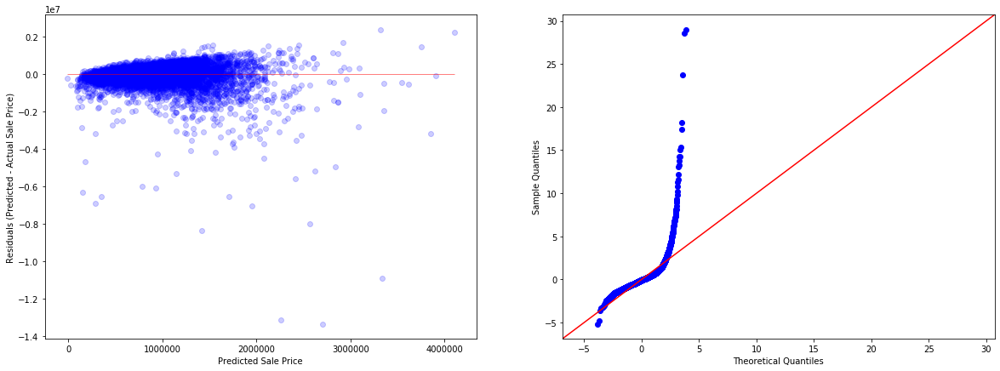

In [21]:
check_lr_assumptions(sm_1, sm_1_df, outcome, predictors)

So far, our model has met the Linearity Assumption (since the Rainbow test p-value is 1.0, which is greater than our significance level of 0.05). Yet it's violating Normality as well as Homoskedasticity Assumptions (the p-values for both Jarque-Bera and Breusch-Pagan tests are smaller than 0.05).

This model is using only 1 feature, therefore I don't need to check for Multicollinearity yet. 

Since model fitting is going to be an iterative process, I will create a dataframe called `model_results` which keeps track of all the different models I've trained and some of their statistical results for easy performance comparison later on. 

In [22]:
# initiate model_results dataframe
model_results = pd.DataFrame({'Model': [], 'Formula': [], 'R-Squared': [], 
                              'Rainbow statistic': [], 'Rainbow p-value': [], 'Linearity Assumption': [],
                              'Jarque-Bera statistic': [], 'Jarque-Bera p-value': [], 'Normality Assumption': [],
                              'Lagrange Multiplier p-value': [], 'F-statistic p-value': [], 'Homoskedasticity Assumption': [],
                              'Multicollinearity': [], 'Independence Assumption': [],
                              'Note': []})

In [23]:
model_results

,Model,Formula,R-Squared,Rainbow statistic,Rainbow p-value,Linearity Assumption,Jarque-Bera statistic,Jarque-Bera p-value,Normality Assumption,Lagrange Multiplier p-value,F-statistic p-value,Homoskedasticity Assumption,Multicollinearity,Independence Assumption,Note


In [24]:
def append_results(model_name, formula, model, df, outcome, predictors, alpha=0.05, note=None):
    r2 = model.rsquared
    
    # rainbow (for linearity)
    rainbow_statistic, rainbow_p_value = linear_rainbow(model)
    linear_eval = 'Violated' if rainbow_p_value < alpha else 'Satisfied'
    
    # jarque-bera (for normality)
    residuals = model.resid
    jb = jarque_bera(residuals, axis=0)
    jb_statistic, jb_p_value = jb[:2]
    normal_eval = 'Violated' if jb_p_value < alpha else 'Satisfied'
    
    # breusch-pagan (for hetero)
    y = df[outcome]
    yhat = model.predict()
    lm, lm_p_value, fvalue, f_p_value = het_breuschpagan(y-yhat, df[predictors])
    homoskedasticity_eval = 'Violated' if f_p_value < alpha else 'Satisfied'
    
    # check for multicollinearity
    # if there's only 1 predictor, Independence Assumption is not applicable
    if len(predictors) == 1:
        multicollinearity = 'N/A'
        independence_eval = 'N/A'
    # if there're more than 1 predictors
    else:
        vif_df = get_vif(df, predictors)
        # select all the predictors with a VIF values greater or equal to 5
        # ("rule of thumb" for VIF is 5 is too high)
        multicollinearity = ', '.join(vif_df[vif_df.VIF >= 5].feature.values)
        independence_eval = 'Violated' if multicollinearity != '' else 'Satisfied'
    
    # append results to dataframe
    model_results.loc[len(model_results)] = [model_name, formula, r2, 
                                             rainbow_statistic, rainbow_p_value, linear_eval,
                                             jb_statistic, jb_p_value, normal_eval, 
                                             lm_p_value, f_p_value, homoskedasticity_eval,
                                             multicollinearity, independence_eval,
                                             note]
    return model_results

In [25]:
# Append the results for `sm_1` to our result dataframe
append_results('sm_1', formula, sm_1, sm_1_df, outcome, predictors, note='with outliers, no transform')

,Model,Formula,R-Squared,Rainbow statistic,Rainbow p-value,Linearity Assumption,Jarque-Bera statistic,Jarque-Bera p-value,Normality Assumption,Lagrange Multiplier p-value,F-statistic p-value,Homoskedasticity Assumption,Multicollinearity,Independence Assumption,Note
0,sm_1,SalePrice ~ SqFtTotLiving,0.386491,0.872905,1.0,Satisfied,1.305055e+07,0.0,Violated,NaN,3.931011e-82,Violated,N/A,N/A,"with outliers, no transform"


## Model 2

### Data Transformation

#### Log Transformation

In [26]:
# Create a function for log transformation that also prefixes 'log_' to column names
# (so that it'll be easier to identify what's been done on each variable looking at the plots afterwards)
def log_transform(cols, dt):
    output = dt.copy()
    for c in dt.columns:
        if c in cols:
            output[f'log_{c}'] = np.log(dt[c])
            output.drop(c, axis=1, inplace=True)
    return output

Since `SqFtTotLiving` and `SalePrice` are both right skewed right now, I will try to apply `log_transform()` on both of them to see if they'd become more symmetrical:

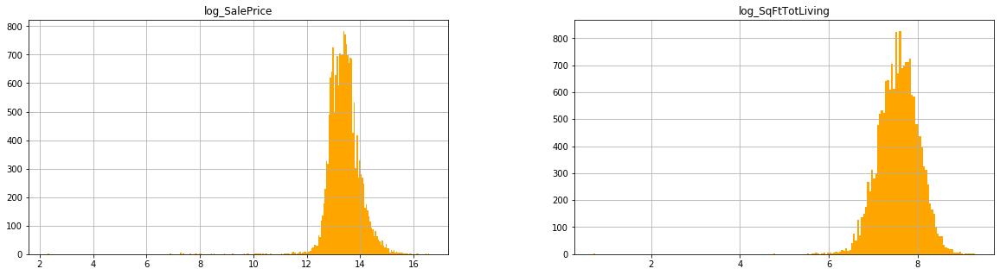

In [27]:
sm_1_log_df = log_transform(sm_1_df.columns, sm_1_df)
sm_1_log_df.hist(figsize=(20,5), color='orange', bins='auto');

`log_SalePrice` looks slightly better, but `log_SqFtTotLiving` doesn't. Also, they're now both skewed left instead of right --> probably need to remove outliers before tranformation.

#### Removing Outliers Using z-score

In [28]:
# Create a function that removes outliers using z-score
def remove_outliers_z(dt, col, threshold=3):
    """
    Remove outliers of a dataframe 'dt' using z-score for specified column 'col'
    By default, z-score thresholds are +/- 3 for a normal distribution 
    """
    z_scores = stats.zscore(dt[col])
    abs_z_scores = np.abs(z_scores)
    output = dt[abs_z_scores < threshold]
    return output

In [29]:
sm_2_df = remove_outliers_z(sm_1_df, 'SalePrice')

In [30]:
sm_1_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18320 entries, 0 to 821
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype
---  ------         --------------  -----
 0   SalePrice      18320 non-null  int64
 1   SqFtTotLiving  18320 non-null  int64
dtypes: int64(2)
memory usage: 429.4 KB


In [31]:
sm_2_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18015 entries, 0 to 821
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype
---  ------         --------------  -----
 0   SalePrice      18015 non-null  int64
 1   SqFtTotLiving  18015 non-null  int64
dtypes: int64(2)
memory usage: 422.2 KB


So 305 data points have been idenfitied as outliers using z-score method and removed going from `sm_1_df` to `sm_2_df`.

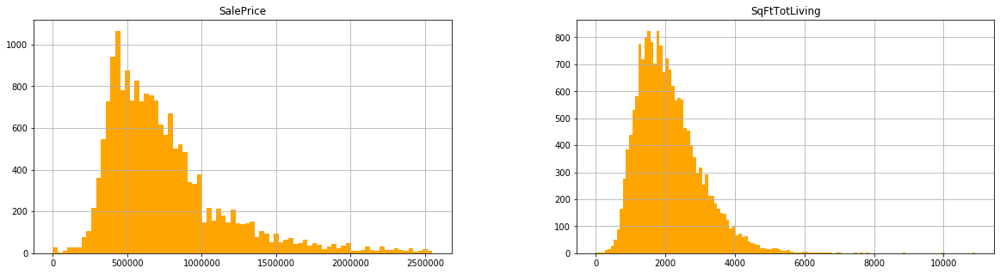

In [32]:
sm_2_df.hist(figsize=(20,5), color='orange', bins='auto');

This doesn't look bad at all! 

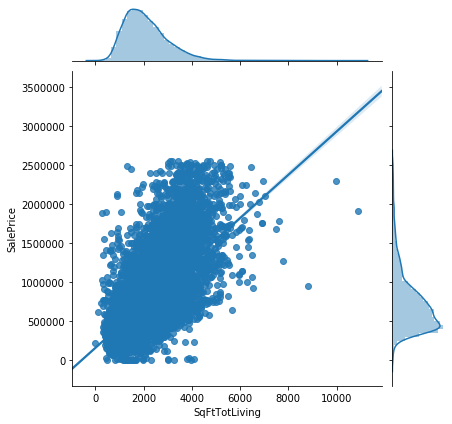

In [33]:
sns.jointplot(data=sm_2_df, x='SqFtTotLiving', y='SalePrice', kind="reg");

This definitely looks better. Let's see if log transformation is going to improve this a little more.

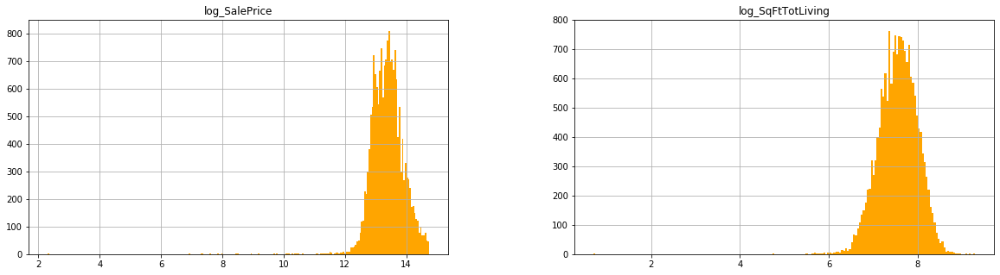

In [34]:
sm_2_log_df = log_transform(sm_2_df.columns, sm_2_df)
sm_2_log_df.hist(figsize=(20,5), color='orange', bins='auto');

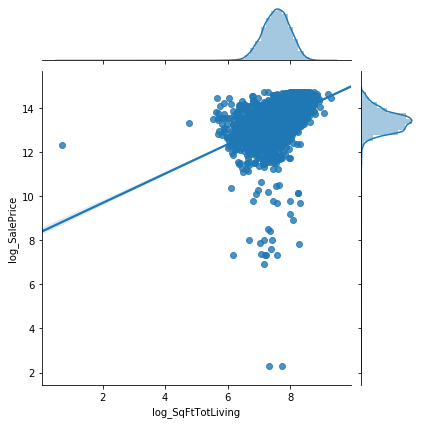

In [35]:
sns.jointplot(data=sm_2_log_df, x='log_SqFtTotLiving', y='log_SalePrice', kind="reg");

Honestly speaking, the distribution of these 2 variables and their relationship AFTER outliers removal with z-score and BEFORE log transformation look better. But let's fit 2 models on both `sm_2_df` and `sm_2_log_df` to compare the results.

In [36]:
# `sm_2_df`
outcome = 'SalePrice'
predictors = get_predictors(sm_2_df, outcome)
formula = create_formula(outcome, predictors)
sm_2 = ols(formula=formula, data=sm_2_df).fit()
sm_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.400
Model:                            OLS   Adj. R-squared:                  0.400
Method:                 Least Squares   F-statistic:                 1.201e+04
Date:                Wed, 03 Mar 2021   Prob (F-statistic):               0.00
Time:                        18:56:39   Log-Likelihood:            -2.5301e+05
No. Observations:               18015   AIC:                         5.060e+05
Df Residuals:                   18013   BIC:                         5.060e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept      1.616e+05   5776.194     27.977      0.000     1.5e+05    1.73e+05
SqFtTotLiving   276.8171      2.526    109.569      0.000     271.865     281.769
==============================================================================
Omnibus:                     3422.527   Durbin-Watson:                   1.965
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             8752.700
Skew:                           1.044   Prob(JB):                         0.00
Kurtosis:                       5.703   Cond. No.                     5.83e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.83e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

					Statistic 			P-value
(Linearity) Rainbow Test 		1.027983780053882 		0.09517112867569948
(Normality) Jarque-Bera Test 		8752.69975840505 		0.0

					Lagrange Multiplier p-value 	F-statistic p-value
(Homoskedasticity) Breusch-Pagan test 	nan 				0.0


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


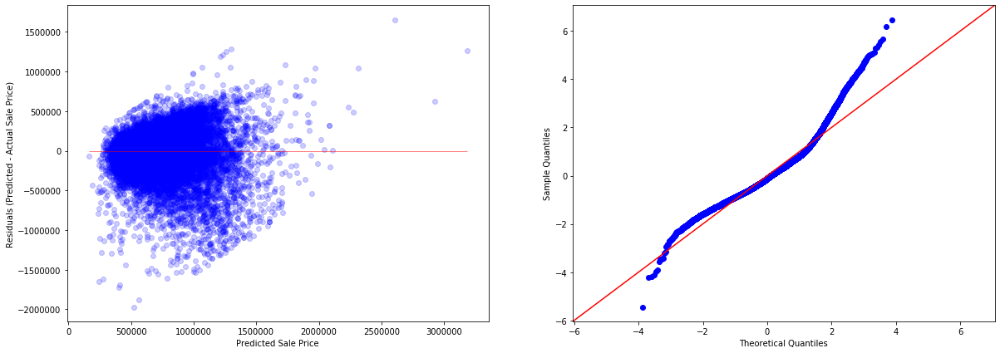

In [37]:
check_lr_assumptions(sm_2, sm_2_df, outcome, predictors)

In [38]:
append_results('sm_2', formula, sm_2, sm_2_df, outcome, predictors, note='remove SalePrice outliers with z-score')

,Model,Formula,R-Squared,Rainbow statistic,Rainbow p-value,Linearity Assumption,Jarque-Bera statistic,Jarque-Bera p-value,Normality Assumption,Lagrange Multiplier p-value,F-statistic p-value,Homoskedasticity Assumption,Multicollinearity,Independence Assumption,Note
0,sm_1,SalePrice ~ SqFtTotLiving,0.386491,0.872905,1.000000,Satisfied,1.305055e+07,0.0,Violated,NaN,3.931011e-82,Violated,N/A,N/A,"with outliers, no transform"
1,sm_2,SalePrice ~ SqFtTotLiving,0.399934,1.027984,0.095171,Satisfied,8.752700e+03,0.0,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers with z-score


In [39]:
# `sm_2_log_df`
outcome = 'log_SalePrice'
predictors = get_predictors(sm_2_log_df, outcome)
formula = create_formula(outcome, predictors)
sm_2_log = ols(formula=formula, data=sm_2_log_df).fit()
sm_2_log.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          log_SalePrice   R-squared:                       0.292
Model:                            OLS   Adj. R-squared:                  0.292
Method:                 Least Squares   F-statistic:                     7424.
Date:                Wed, 03 Mar 2021   Prob (F-statistic):               0.00
Time:                        18:56:40   Log-Likelihood:                -11005.
No. Observations:               18015   AIC:                         2.201e+04
Df Residuals:                   18013   BIC:                         2.203e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept             8.3679      0.058    143.216      0.000       8.253       8.482
log_SqFtTotLiving     0.6647      0.008     86.164      0.000       0.650       0.680
==============================================================================
Omnibus:                    15872.450   Durbin-Watson:                   1.951
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          3094761.866
Skew:                          -3.557   Prob(JB):                         0.00
Kurtosis:                      66.815   Cond. No.                         136.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

					Statistic 			P-value
(Linearity) Rainbow Test 		1.3525012653319393 		1.0847908076956822e-46
(Normality) Jarque-Bera Test 		3094761.8658904624 		0.0

					Lagrange Multiplier p-value 	F-statistic p-value
(Homoskedasticity) Breusch-Pagan test 	nan 				1.1634390738752893e-59


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


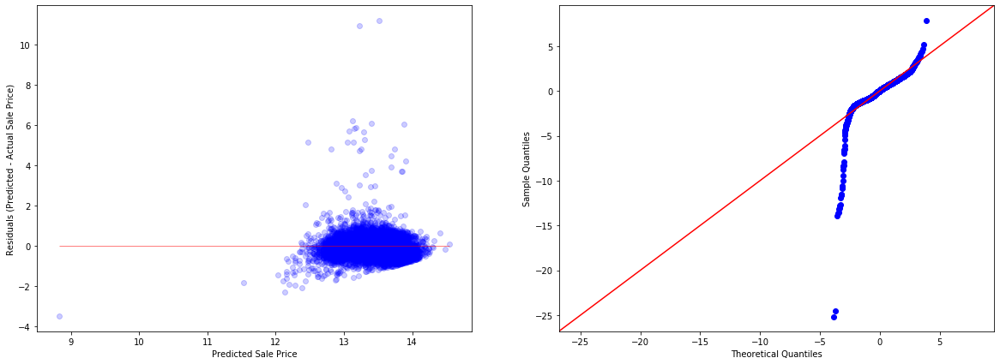

In [40]:
check_lr_assumptions(sm_2_log, sm_2_log_df, outcome, predictors)

In [41]:
append_results('sm_2_log', formula, sm_2_log, sm_2_log_df, outcome, predictors, 
               note='remove SalePrice outliers w/ z-scores then log transformed')

,Model,Formula,R-Squared,Rainbow statistic,Rainbow p-value,Linearity Assumption,Jarque-Bera statistic,Jarque-Bera p-value,Normality Assumption,Lagrange Multiplier p-value,F-statistic p-value,Homoskedasticity Assumption,Multicollinearity,Independence Assumption,Note
0,sm_1,SalePrice ~ SqFtTotLiving,0.386491,0.872905,1.000000e+00,Satisfied,1.305055e+07,0.0,Violated,NaN,3.931011e-82,Violated,N/A,N/A,"with outliers, no transform"
1,sm_2,SalePrice ~ SqFtTotLiving,0.399934,1.027984,9.517113e-02,Satisfied,8.752700e+03,0.0,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers with z-score
2,sm_2_log,log_SalePrice ~ log_SqFtTotLiving,0.291863,1.352501,1.084791e-46,Violated,3.094762e+06,0.0,Violated,NaN,1.163439e-59,Violated,N/A,N/A,remove SalePrice outliers w/ z-scores then log...


In [42]:
model_results.sort_values(by='R-Squared', ascending=False)

,Model,Formula,R-Squared,Rainbow statistic,Rainbow p-value,Linearity Assumption,Jarque-Bera statistic,Jarque-Bera p-value,Normality Assumption,Lagrange Multiplier p-value,F-statistic p-value,Homoskedasticity Assumption,Multicollinearity,Independence Assumption,Note
1,sm_2,SalePrice ~ SqFtTotLiving,0.399934,1.027984,9.517113e-02,Satisfied,8.752700e+03,0.0,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers with z-score
0,sm_1,SalePrice ~ SqFtTotLiving,0.386491,0.872905,1.000000e+00,Satisfied,1.305055e+07,0.0,Violated,NaN,3.931011e-82,Violated,N/A,N/A,"with outliers, no transform"
2,sm_2_log,log_SalePrice ~ log_SqFtTotLiving,0.291863,1.352501,1.084791e-46,Violated,3.094762e+06,0.0,Violated,NaN,1.163439e-59,Violated,N/A,N/A,remove SalePrice outliers w/ z-scores then log...


Using log transformation didn't seem to help reduce skewness for `SqFtTotLiving` and `SalePrice`, which makes me curious whether getting the square root, or inversing would help.

### Squareroot Transformation

In [43]:
def sq_rt(cols, dt):
    output = dt.copy()
    for c in dt.columns:  
        if c in cols:
            output.drop(c, axis=1, inplace=True)
            output[f'sqrt_{c}'] = (dt[c])**.5
    return output

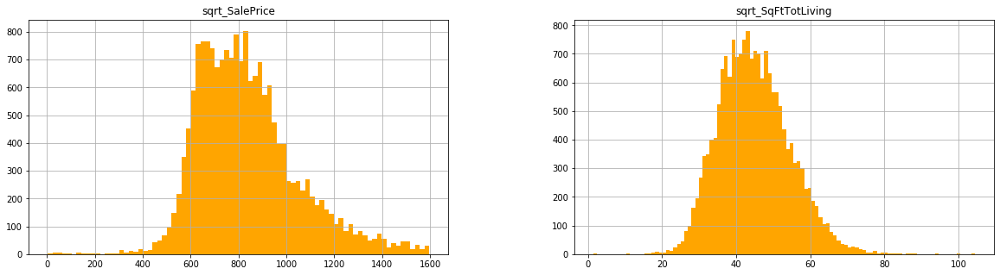

In [44]:
# Applying sq_rt() on `sm_2_df` (which has the outliers removed using z-score)
sm_2_sqrt_df = sq_rt(sm_2_df.columns, sm_2_df)
sm_2_sqrt_df.hist(figsize=(20,5), color='orange', bins='auto');

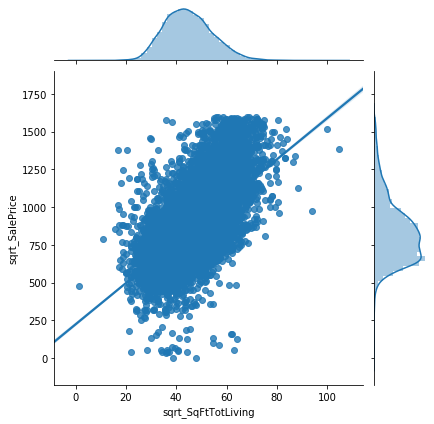

In [45]:
sns.jointplot(data=sm_2_sqrt_df, x='sqrt_SqFtTotLiving', y='sqrt_SalePrice', kind="reg");

The distributions for both is definitely looking more symmetrical here, and joint plot looks linear. Let's try to fit a model to see how it goes.

In [46]:
# `sm_2_sqrt_df`
outcome = 'sqrt_SalePrice'
predictors = get_predictors(sm_2_sqrt_df, outcome)
formula = create_formula(outcome, predictors)
sm_2_sqrt = ols(formula=formula, data=sm_2_sqrt_df).fit()
sm_2_sqrt.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:         sqrt_SalePrice   R-squared:                       0.379
Model:                            OLS   Adj. R-squared:                  0.379
Method:                 Least Squares   F-statistic:                 1.100e+04
Date:                Wed, 03 Mar 2021   Prob (F-statistic):               0.00
Time:                        18:56:45   Log-Likelihood:            -1.1762e+05
No. Observations:               18015   AIC:                         2.352e+05
Df Residuals:                   18013   BIC:                         2.352e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept            223.5235      5.971     37.434      0.000     211.819     235.228
sqrt_SqFtTotLiving    13.6592      0.130    104.903      0.000      13.404      13.914
==============================================================================
Omnibus:                      841.580   Durbin-Watson:                   1.957
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1509.920
Skew:                           0.372   Prob(JB):                         0.00
Kurtosis:                       4.207   Cond. No.                         222.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

					Statistic 			P-value
(Linearity) Rainbow Test 		1.0533381096407097 		0.006839963859572352
(Normality) Jarque-Bera Test 		1509.9202005354991 		0.0

					Lagrange Multiplier p-value 	F-statistic p-value
(Homoskedasticity) Breusch-Pagan test 	nan 				0.0


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


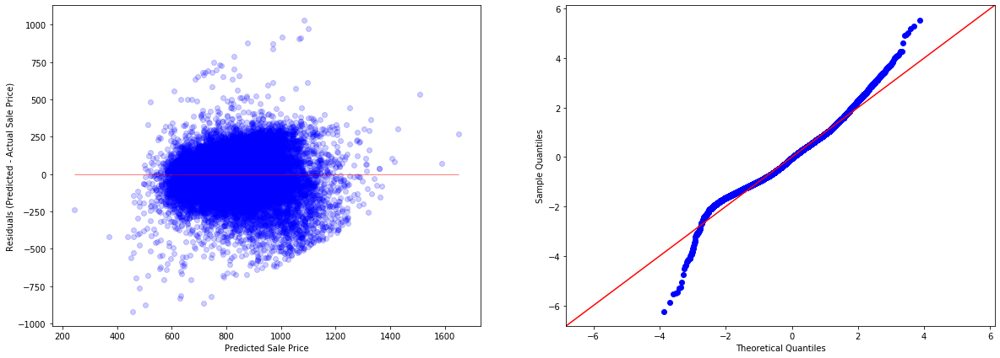

In [47]:
check_lr_assumptions(sm_2_sqrt, sm_2_sqrt_df, outcome, predictors)

In [48]:
append_results('sm_2_sqrt', formula, sm_2_sqrt, sm_2_sqrt_df, outcome, predictors, 
               note='remove SalePrice outliers w/ z-score & sqrt transformed')

,Model,Formula,R-Squared,Rainbow statistic,Rainbow p-value,Linearity Assumption,Jarque-Bera statistic,Jarque-Bera p-value,Normality Assumption,Lagrange Multiplier p-value,F-statistic p-value,Homoskedasticity Assumption,Multicollinearity,Independence Assumption,Note
0,sm_1,SalePrice ~ SqFtTotLiving,0.386491,0.872905,1.000000e+00,Satisfied,1.305055e+07,0.0,Violated,NaN,3.931011e-82,Violated,N/A,N/A,"with outliers, no transform"
1,sm_2,SalePrice ~ SqFtTotLiving,0.399934,1.027984,9.517113e-02,Satisfied,8.752700e+03,0.0,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers with z-score
2,sm_2_log,log_SalePrice ~ log_SqFtTotLiving,0.291863,1.352501,1.084791e-46,Violated,3.094762e+06,0.0,Violated,NaN,1.163439e-59,Violated,N/A,N/A,remove SalePrice outliers w/ z-scores then log...
3,sm_2_sqrt,sqrt_SalePrice ~ sqrt_SqFtTotLiving,0.379239,1.053338,6.839964e-03,Violated,1.509920e+03,0.0,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt tr...


Model `sm_2_sqrt` has lower R-Squared value than `sm_2`, and it also violates all 3 assumptions (Linearity, Normality, and Homoskedasticity).

Looking at the distribution plot for `SqFtTotLiving` after getting the square root, it seems like it does benefit from this transformation. Maybe applying it on just `SqFtTotLiving` instead of both variables would yield better result.

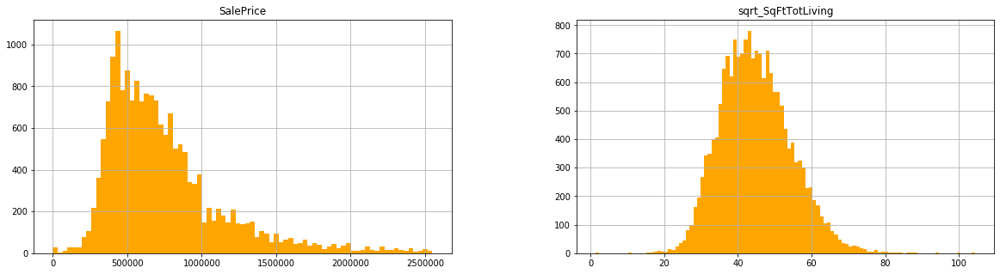

In [49]:
# Applying sq_rt() on just 'SqFtTotLiving'
sm_2_sqrt_2_df = sq_rt('SqFtTotLiving', sm_2_df)
sm_2_sqrt_2_df.hist(figsize=(20,5), color='orange', bins='auto');

In [50]:
# `sm_2_sqrt_2_df`
outcome = 'SalePrice'
predictors = get_predictors(sm_2_sqrt_2_df, outcome)
formula = create_formula(outcome, predictors)
sm_2_sqrt_2 = ols(formula=formula, data=sm_2_sqrt_2_df).fit()
sm_2_sqrt_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.376
Model:                            OLS   Adj. R-squared:                  0.376
Method:                 Least Squares   F-statistic:                 1.084e+04
Date:                Wed, 03 Mar 2021   Prob (F-statistic):               0.00
Time:                        18:56:46   Log-Likelihood:            -2.5336e+05
No. Observations:               18015   AIC:                         5.067e+05
Df Residuals:                   18013   BIC:                         5.067e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept          -3.953e+05   1.12e+04    -35.346      0.000   -4.17e+05   -3.73e+05
sqrt_SqFtTotLiving  2.539e+04    243.884    104.093      0.000    2.49e+04    2.59e+04
==============================================================================
Omnibus:                     3596.101   Durbin-Watson:                   1.963
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             8842.146
Skew:                           1.108   Prob(JB):                         0.00
Kurtosis:                       5.621   Cond. No.                         222.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

					Statistic 			P-value
(Linearity) Rainbow Test 		1.033779274956588 		0.05747715837208583
(Normality) Jarque-Bera Test 		8842.146076379391 		0.0

					Lagrange Multiplier p-value 	F-statistic p-value
(Homoskedasticity) Breusch-Pagan test 	nan 				0.0


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


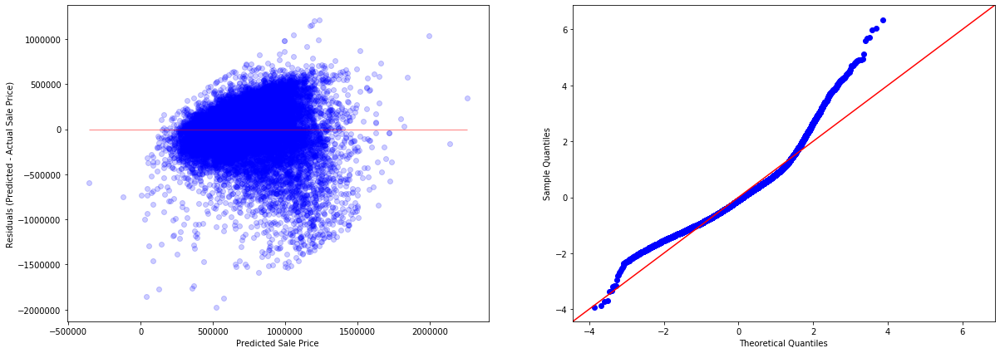

In [51]:
check_lr_assumptions(sm_2_sqrt_2, sm_2_sqrt_2_df, outcome, predictors)

In [52]:
append_results('sm_2_sqrt_2', formula, sm_2_sqrt_2, sm_2_sqrt_2_df, outcome, predictors, 
               note='remove SalePrice outliers w/ z-score & sqrt on SqFtTotLiving')

,Model,Formula,R-Squared,Rainbow statistic,Rainbow p-value,Linearity Assumption,Jarque-Bera statistic,Jarque-Bera p-value,Normality Assumption,Lagrange Multiplier p-value,F-statistic p-value,Homoskedasticity Assumption,Multicollinearity,Independence Assumption,Note
0,sm_1,SalePrice ~ SqFtTotLiving,0.386491,0.872905,1.000000e+00,Satisfied,1.305055e+07,0.0,Violated,NaN,3.931011e-82,Violated,N/A,N/A,"with outliers, no transform"
1,sm_2,SalePrice ~ SqFtTotLiving,0.399934,1.027984,9.517113e-02,Satisfied,8.752700e+03,0.0,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers with z-score
2,sm_2_log,log_SalePrice ~ log_SqFtTotLiving,0.291863,1.352501,1.084791e-46,Violated,3.094762e+06,0.0,Violated,NaN,1.163439e-59,Violated,N/A,N/A,remove SalePrice outliers w/ z-scores then log...
3,sm_2_sqrt,sqrt_SalePrice ~ sqrt_SqFtTotLiving,0.379239,1.053338,6.839964e-03,Violated,1.509920e+03,0.0,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt tr...
4,sm_2_sqrt_2,SalePrice ~ sqrt_SqFtTotLiving,0.375599,1.033779,5.747716e-02,Satisfied,8.842146e+03,0.0,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt on...


So far I haven't had much luck with any transformations on `SalePrice` or `SqFtTotLiving`, although the result for getting the squareroot of `SqFtTotLiving` only are not too horrible, it's still not performing as well as the Baseline model (`sm_1`). 

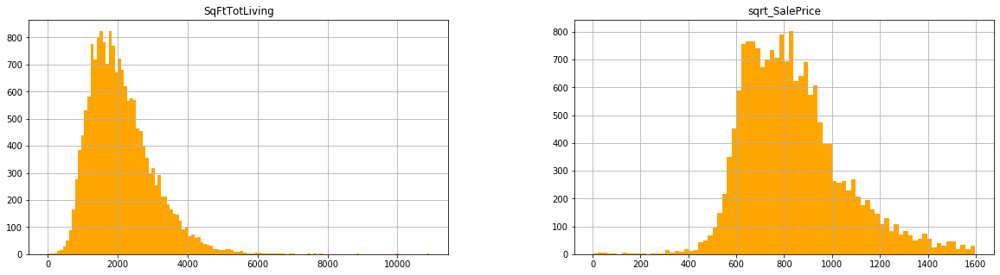

In [53]:
# Applying sq_rt() on just 'SalePrice'
sm_2_sqrt_3_df = sq_rt('SalePrice', sm_2_df)
sm_2_sqrt_3_df.hist(figsize=(20,5), color='orange', bins='auto');

In [54]:
# `sm_2_sqrt_3_df`
outcome = 'sqrt_SalePrice'
predictors = get_predictors(sm_2_sqrt_3_df, outcome)
formula = create_formula(outcome, predictors)
sm_2_sqrt_3 = ols(formula=formula, data=sm_2_sqrt_3_df).fit()
sm_2_sqrt_3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:         sqrt_SalePrice   R-squared:                       0.393
Model:                            OLS   Adj. R-squared:                  0.393
Method:                 Least Squares   F-statistic:                 1.168e+04
Date:                Wed, 03 Mar 2021   Prob (F-statistic):               0.00
Time:                        18:56:48   Log-Likelihood:            -1.1741e+05
No. Observations:               18015   AIC:                         2.348e+05
Df Residuals:                   18013   BIC:                         2.348e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept       527.2141      3.110    169.545      0.000     521.119     533.309
SqFtTotLiving     0.1470      0.001    108.094      0.000       0.144       0.150
==============================================================================
Omnibus:                      793.475   Durbin-Watson:                   1.959
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1577.432
Skew:                           0.322   Prob(JB):                         0.00
Kurtosis:                       4.298   Cond. No.                     5.83e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.83e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

					Statistic 			P-value
(Linearity) Rainbow Test 		1.0509430335142527 		0.009197659667153244
(Normality) Jarque-Bera Test 		1577.4320890858248 		0.0

					Lagrange Multiplier p-value 	F-statistic p-value
(Homoskedasticity) Breusch-Pagan test 	nan 				0.0


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


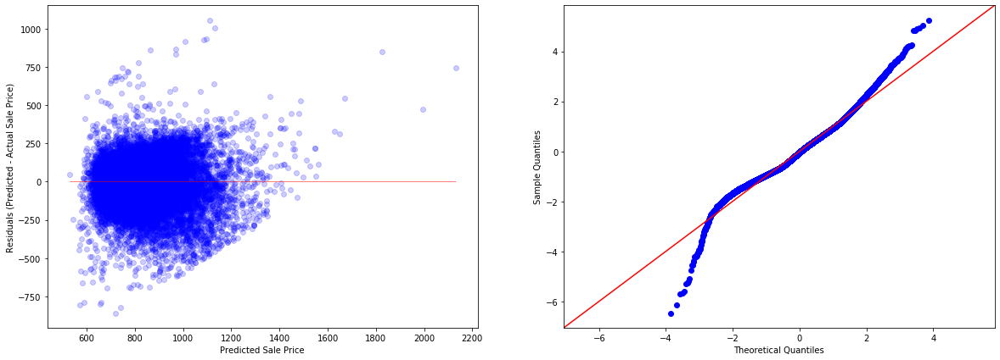

In [55]:
check_lr_assumptions(sm_2_sqrt_3, sm_2_sqrt_3_df, outcome, predictors)

In [56]:
append_results('sm_2_sqrt_3', formula, sm_2_sqrt_3, sm_2_sqrt_3_df, outcome, predictors, 
               note='remove SalePrice outliers w/ z-score & sqrt on SalePrice only')

,Model,Formula,R-Squared,Rainbow statistic,Rainbow p-value,Linearity Assumption,Jarque-Bera statistic,Jarque-Bera p-value,Normality Assumption,Lagrange Multiplier p-value,F-statistic p-value,Homoskedasticity Assumption,Multicollinearity,Independence Assumption,Note
0,sm_1,SalePrice ~ SqFtTotLiving,0.386491,0.872905,1.000000e+00,Satisfied,1.305055e+07,0.0,Violated,NaN,3.931011e-82,Violated,N/A,N/A,"with outliers, no transform"
1,sm_2,SalePrice ~ SqFtTotLiving,0.399934,1.027984,9.517113e-02,Satisfied,8.752700e+03,0.0,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers with z-score
2,sm_2_log,log_SalePrice ~ log_SqFtTotLiving,0.291863,1.352501,1.084791e-46,Violated,3.094762e+06,0.0,Violated,NaN,1.163439e-59,Violated,N/A,N/A,remove SalePrice outliers w/ z-scores then log...
3,sm_2_sqrt,sqrt_SalePrice ~ sqrt_SqFtTotLiving,0.379239,1.053338,6.839964e-03,Violated,1.509920e+03,0.0,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt tr...
4,sm_2_sqrt_2,SalePrice ~ sqrt_SqFtTotLiving,0.375599,1.033779,5.747716e-02,Satisfied,8.842146e+03,0.0,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt on...
5,sm_2_sqrt_3,sqrt_SalePrice ~ SqFtTotLiving,0.393446,1.050943,9.197660e-03,Violated,1.577432e+03,0.0,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt on...


Next I want to try removing outliers using IQR to see how that'd look.

#### Removing Outliers Using IQR

In [57]:
def remove_outliers_iqr(dt, col):
    """
    Remove outliers of a dataframe 'dt' based on IQR specified column 'col'
    Input for method argument is either 'iqr' or 'z-score'
    
    """
    q1 = dt[col].quantile(0.25)
    q3 = dt[col].quantile(0.75)
    iqr = q3 - q1
    output = dt[(dt[col] > q1 - 1.5 * iqr) & (dt[col] < q3 + 1.5 * iqr)]
    return output

In [58]:
sm_3_df = remove_outliers_iqr(sm_1_df, 'SalePrice')
sm_3_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 17130 entries, 0 to 821
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype
---  ------         --------------  -----
 0   SalePrice      17130 non-null  int64
 1   SqFtTotLiving  17130 non-null  int64
dtypes: int64(2)
memory usage: 401.5 KB


In [59]:
sm_1_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18320 entries, 0 to 821
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype
---  ------         --------------  -----
 0   SalePrice      18320 non-null  int64
 1   SqFtTotLiving  18320 non-null  int64
dtypes: int64(2)
memory usage: 429.4 KB


So far, the IQR method has removed more outliers in our dataset (1190) compared to the z-score method (305).

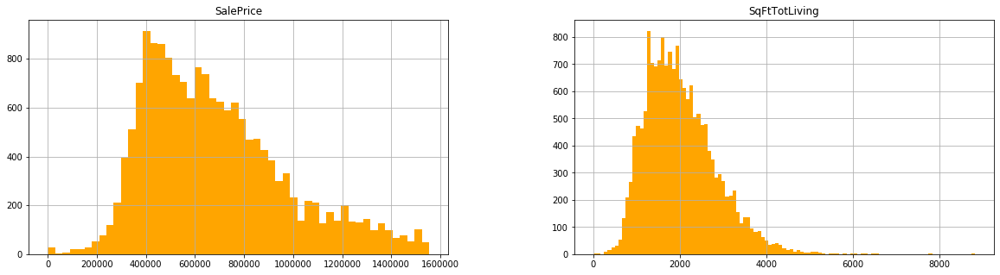

In [60]:
sm_3_df.hist(figsize=(20,5), color='orange', bins='auto');

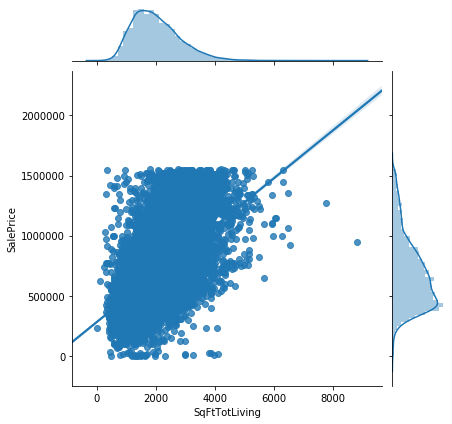

In [61]:
sns.jointplot(data=sm_3_df, x='SqFtTotLiving', y='SalePrice', kind="reg");

So, removing outliers using IQR seems to help zoom in the most dense interval of our data...

In [62]:
# `sm_3_df`
outcome = 'SalePrice'
predictors = get_predictors(sm_3_df, outcome)
formula = create_formula(outcome, predictors)
sm_3 = ols(formula=formula, data=sm_3_df).fit()
sm_3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.308
Model:                            OLS   Adj. R-squared:                  0.308
Method:                 Least Squares   F-statistic:                     7633.
Date:                Wed, 03 Mar 2021   Prob (F-statistic):               0.00
Time:                        18:56:52   Log-Likelihood:            -2.3657e+05
No. Observations:               17130   AIC:                         4.731e+05
Df Residuals:                   17128   BIC:                         4.732e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept      2.809e+05   4959.120     56.641      0.000    2.71e+05    2.91e+05
SqFtTotLiving   199.1119      2.279     87.368      0.000     194.645     203.579
==============================================================================
Omnibus:                      878.641   Durbin-Watson:                   1.972
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1038.380
Skew:                           0.558   Prob(JB):                    3.30e-226
Kurtosis:                       3.460   Cond. No.                     5.87e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.87e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

					Statistic 			P-value
(Linearity) Rainbow Test 		0.9913287467909297 		0.6565131044378807
(Normality) Jarque-Bera Test 		1038.3802912106876 		3.3005377551761248e-226

					Lagrange Multiplier p-value 	F-statistic p-value
(Homoskedasticity) Breusch-Pagan test 	nan 				0.0


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


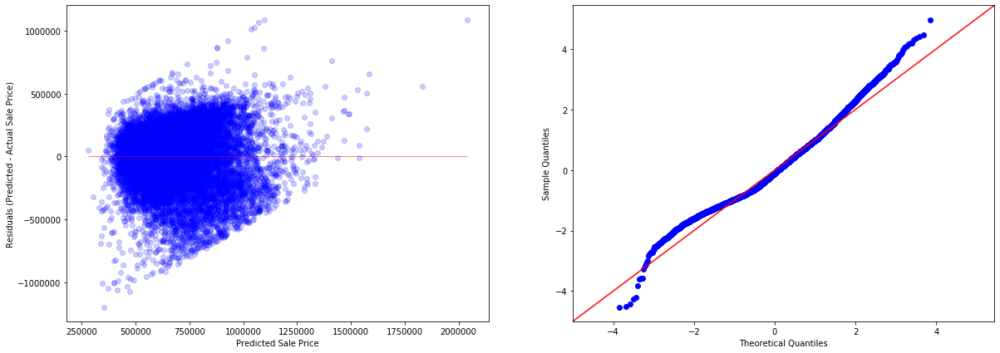

In [63]:
check_lr_assumptions(sm_3, sm_3_df, outcome, predictors)

In [64]:
append_results('sm_3', formula, sm_3, sm_3_df, outcome, predictors, 
               note='remove SalePrice outliers w/ IQR')

,Model,Formula,R-Squared,Rainbow statistic,Rainbow p-value,Linearity Assumption,Jarque-Bera statistic,Jarque-Bera p-value,Normality Assumption,Lagrange Multiplier p-value,F-statistic p-value,Homoskedasticity Assumption,Multicollinearity,Independence Assumption,Note
0,sm_1,SalePrice ~ SqFtTotLiving,0.386491,0.872905,1.000000e+00,Satisfied,1.305055e+07,0.000000e+00,Violated,NaN,3.931011e-82,Violated,N/A,N/A,"with outliers, no transform"
1,sm_2,SalePrice ~ SqFtTotLiving,0.399934,1.027984,9.517113e-02,Satisfied,8.752700e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers with z-score
2,sm_2_log,log_SalePrice ~ log_SqFtTotLiving,0.291863,1.352501,1.084791e-46,Violated,3.094762e+06,0.000000e+00,Violated,NaN,1.163439e-59,Violated,N/A,N/A,remove SalePrice outliers w/ z-scores then log...
3,sm_2_sqrt,sqrt_SalePrice ~ sqrt_SqFtTotLiving,0.379239,1.053338,6.839964e-03,Violated,1.509920e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt tr...
4,sm_2_sqrt_2,SalePrice ~ sqrt_SqFtTotLiving,0.375599,1.033779,5.747716e-02,Satisfied,8.842146e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt on...
5,sm_2_sqrt_3,sqrt_SalePrice ~ SqFtTotLiving,0.393446,1.050943,9.197660e-03,Violated,1.577432e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt on...
6,sm_3,SalePrice ~ SqFtTotLiving,0.308273,0.991329,6.565131e-01,Satisfied,1.038380e+03,3.300538e-226,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ IQR


Well, removing outliers with IQR has lower R-Squared compared to my baseline model `sm_1`. It still meets the Linearity Assumption, although `sm_3`'s Rainbow Test p-value is 0.6565131, which is smaller than `sm_2`'s.

In [65]:
model_results.sort_values(by='R-Squared', ascending=False)

,Model,Formula,R-Squared,Rainbow statistic,Rainbow p-value,Linearity Assumption,Jarque-Bera statistic,Jarque-Bera p-value,Normality Assumption,Lagrange Multiplier p-value,F-statistic p-value,Homoskedasticity Assumption,Multicollinearity,Independence Assumption,Note
1,sm_2,SalePrice ~ SqFtTotLiving,0.399934,1.027984,9.517113e-02,Satisfied,8.752700e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers with z-score
5,sm_2_sqrt_3,sqrt_SalePrice ~ SqFtTotLiving,0.393446,1.050943,9.197660e-03,Violated,1.577432e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt on...
0,sm_1,SalePrice ~ SqFtTotLiving,0.386491,0.872905,1.000000e+00,Satisfied,1.305055e+07,0.000000e+00,Violated,NaN,3.931011e-82,Violated,N/A,N/A,"with outliers, no transform"
3,sm_2_sqrt,sqrt_SalePrice ~ sqrt_SqFtTotLiving,0.379239,1.053338,6.839964e-03,Violated,1.509920e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt tr...
4,sm_2_sqrt_2,SalePrice ~ sqrt_SqFtTotLiving,0.375599,1.033779,5.747716e-02,Satisfied,8.842146e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt on...
6,sm_3,SalePrice ~ SqFtTotLiving,0.308273,0.991329,6.565131e-01,Satisfied,1.038380e+03,3.300538e-226,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ IQR
2,sm_2_log,log_SalePrice ~ log_SqFtTotLiving,0.291863,1.352501,1.084791e-46,Violated,3.094762e+06,0.000000e+00,Violated,NaN,1.163439e-59,Violated,N/A,N/A,remove SalePrice outliers w/ z-scores then log...


Based on these results, **`sm_2`** is *currently the best performing model* with an R-squared of 0.399934, which means it is able to explain about 40% the variance of our target variable `SalePrice`.

Both Intercept and `SqFtTotLiving` coefficients are statistically significant (p-values around 0.000 < 0.05).

- The `sm_2` model is currently predicting a sale price of USD 161600.0 when total living space is 0 sqft, which seems rather weird?
- And with an increase of 1 sqft in living space, the sale price is expected to increase by USD 276.8171, which is a lot lower than the first simple model's coefficient for `SqFtTotLiving`.

### Adding another Feature

For our second numeric feature, ideally I'll need something with high correlation with `SalePrice`, yet low correlation with `SqFtTotLiving` to avoid multicollinearity problems.

But first, I'll apply z-score outliers removal function on our master `df_1` dataset based on `SalePrice` since it seems to be the best course of action as of now. 

In [66]:
df_2 = remove_outliers_z(df_1, 'SalePrice')

And then I'll check the correlation between variables in this new dataset `df3` again to see if there's any differences compared to `df2`.

In [67]:
corr2 = df_2.corr()
corr2.SalePrice.sort_values(ascending=False)

SalePrice             1.000000
SqFtTotLiving         0.632403
SqFt2ndFloor          0.400375
SqFt1stFloor          0.369726
BathFullCount         0.346514
Bedrooms              0.312480
Stories               0.301886
SqFtFinBasement       0.252031
SqFtOpenPorch         0.240444
SqFtTotBasement       0.238227
SqFtDeck              0.212561
BathHalfCount         0.203739
Bath3qtrCount         0.198179
SqFtGarageAttached    0.172199
AddnlCost             0.118062
YrBuilt               0.104456
YrRenovated           0.102114
SqFtUpperFloor        0.101246
SqFtHalfFloor         0.091862
SqFtLot               0.084739
BrickStone            0.079636
SqFtGarageBasement    0.062253
LotDepthFactor        0.048950
PcntComplete          0.041430
NbrBldgSites          0.020334
SqFtEnclosedPorch     0.015375
NbrLivingUnits        0.014461
PcntUnusable          0.013095
SqFtUnfinHalf         0.008132
PcntNetCondition     -0.007648
SqFtUnfinFull        -0.011627
Name: SalePrice, dtype: float64

In [68]:
corr2.SqFtTotLiving.sort_values(ascending=False)

SqFtTotLiving         1.000000
SqFt1stFloor          0.648326
SqFt2ndFloor          0.641385
SalePrice             0.632403
Bedrooms              0.631567
BathFullCount         0.565443
SqFtGarageAttached    0.464129
SqFtFinBasement       0.386580
Stories               0.380802
YrBuilt               0.359810
BathHalfCount         0.336861
SqFtOpenPorch         0.326387
SqFtTotBasement       0.271464
AddnlCost             0.253004
Bath3qtrCount         0.232125
SqFtDeck              0.225764
SqFtLot               0.177859
SqFtGarageBasement    0.071390
SqFtHalfFloor         0.039799
YrRenovated           0.033703
NbrLivingUnits        0.025486
PcntComplete          0.020955
SqFtUpperFloor        0.019272
PcntUnusable          0.015083
BrickStone            0.010717
LotDepthFactor        0.004630
SqFtUnfinHalf         0.000045
NbrBldgSites         -0.001237
SqFtUnfinFull        -0.002966
SqFtEnclosedPorch    -0.006728
PcntNetCondition     -0.009880
Name: SqFtTotLiving, dtype: float64

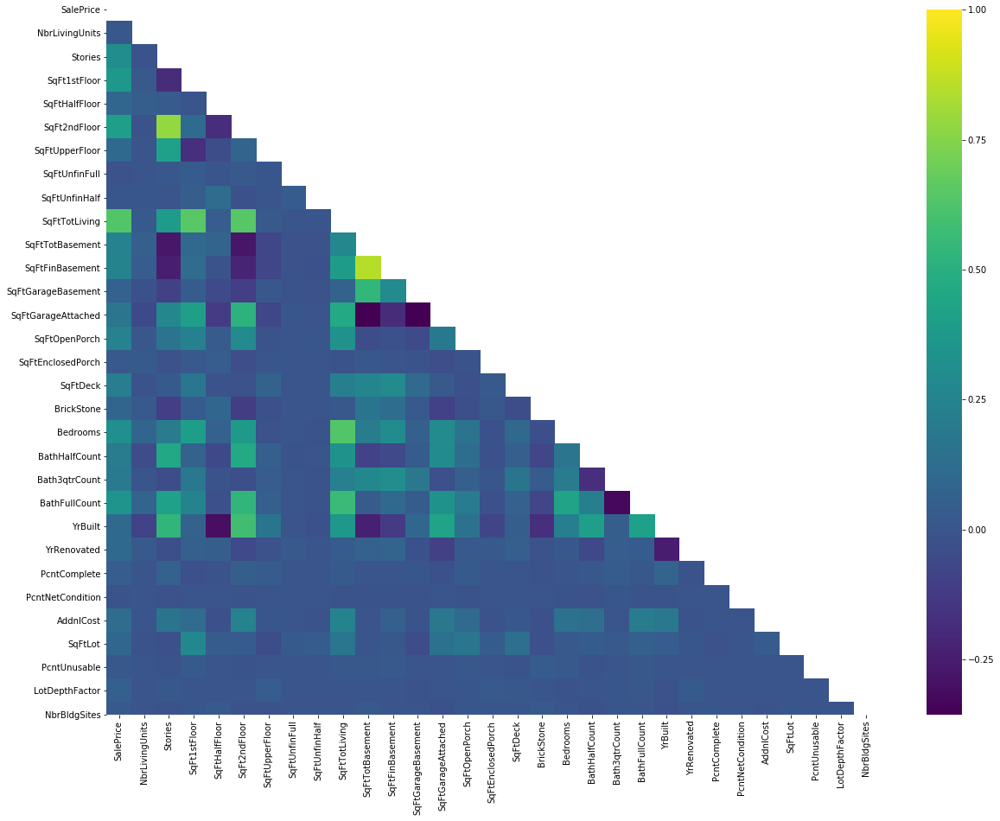

In [69]:
corr_heatmap(corr2)

If we're using a correlation threshold of +/- 0.7 to assess the relationship between 2 variables, none of the other variables would be considered "highly correlated" with `SqFtTotLiving` as of now, with `SqFt1stFloor` being at 0.670466 which is honestly speaking very close to the threshold. 

Comparing between the 2 correlation tables using `SalePrice` and `SqFtTotLiving`, I think I will go with `SqFtOpenPorch` being my second feature because it has a correlation of 0.279959 with `SalePrice`, which is on the higher side of the list, and a correlation of 0.397021 with `SqFtTotLiving`, which is still less than 0.5 (these thresholds I'm using are arbitrary --> worth experimenting with later)

In [70]:
model_2_df = df_2[['SalePrice', 'SqFtTotLiving', 'SqFtOpenPorch']].copy()

In [71]:
model_2_df.isna().sum()

SalePrice        0
SqFtTotLiving    0
SqFtOpenPorch    0
dtype: int64

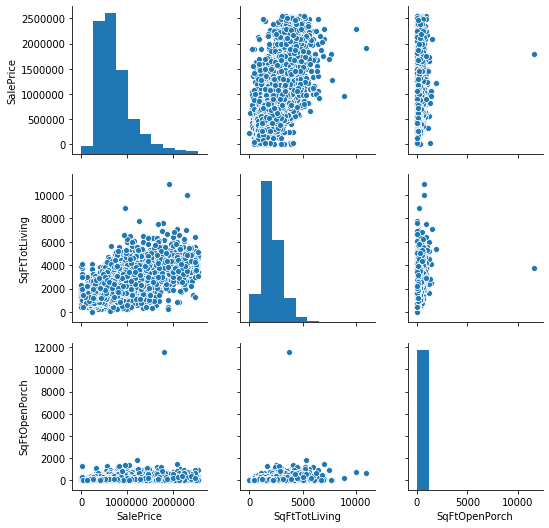

In [72]:
sns.pairplot(model_2_df);

So, the relationship between `SqFtOpenPorch` and `SalePrice` seems linear, but the line seems almost parallel to y-axis (meaning the function might be very close to something like $x = a$).

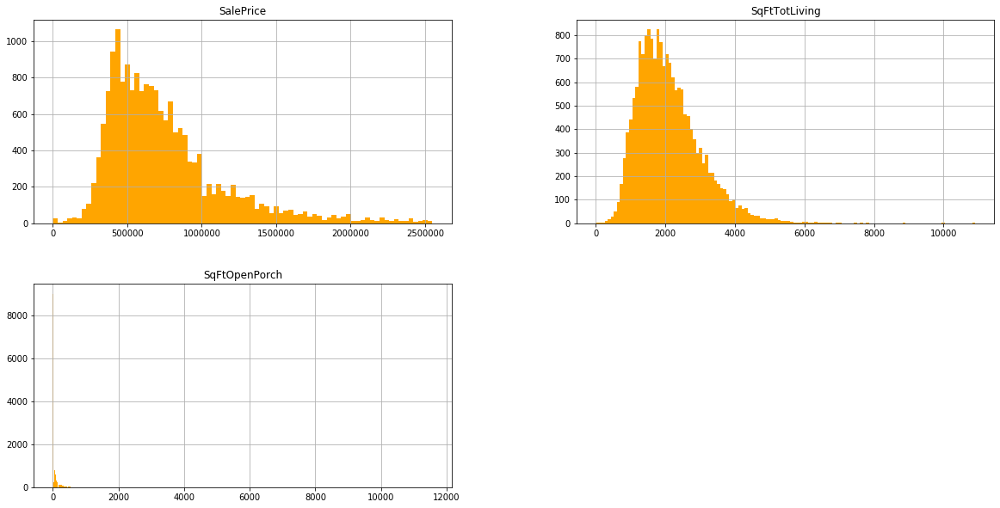

In [73]:
model_2_df.hist(figsize=(20,10), color='orange', bins='auto');

In [74]:
model_2_df.describe()

,SalePrice,SqFtTotLiving,SqFtOpenPorch
count,1.801500e+04,18015.000000,18015.000000
mean,7.437521e+05,2103.026533,69.888981
std,3.926256e+05,896.973439,143.314004
min,1.000000e+01,2.000000,0.000000
25%,4.650000e+05,1444.500000,0.000000
50%,6.500000e+05,1950.000000,0.000000
75%,8.900000e+05,2590.000000,100.000000
max,2.550000e+06,10910.000000,11570.000000


In [75]:
model_2_df.SqFtOpenPorch.value_counts()

0       9030
40       924
50       785
60       764
80       605
        ... 
760        1
1080       1
153        1
217        1
335        1
Name: SqFtOpenPorch, Length: 295, dtype: int64

`SqFtOpenPorch` is heavily right skewed, it might benefit from some sort of transformations. However, since it seems like a good number of `SqFtOpenPorch` is 0, there will be problems with log transformation and inversing. Let's see if getting the square root will reduce skewness.

In [76]:
model_2_sqrt_df = sq_rt(['SqFtOpenPorch'], model_2_df)

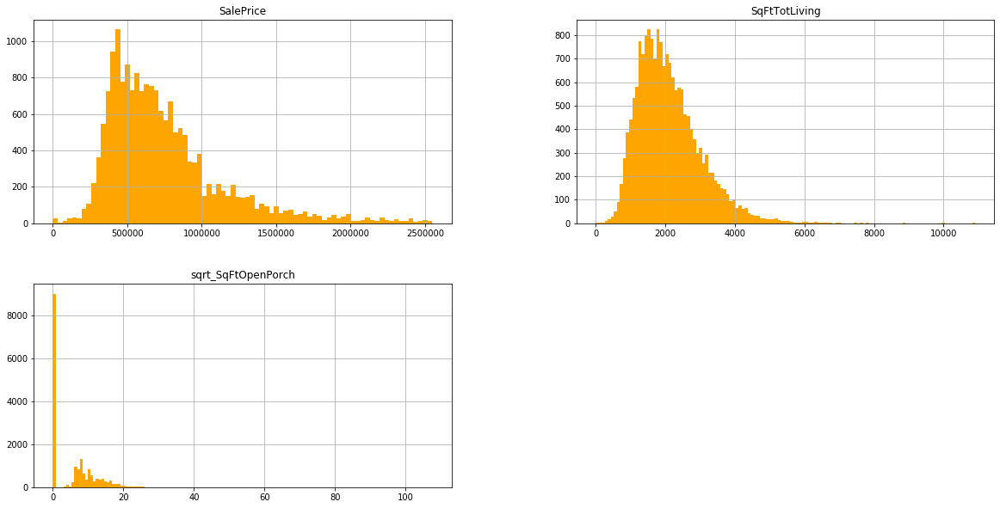

In [77]:
model_2_sqrt_df.hist(figsize=(20,10), color='orange', bins='auto');

Hmm... this still doesn't look too good :D, but let's just see how fitting a model to this dataset turns out. 

In [78]:
# `model_2_sqrt_df`
outcome = 'SalePrice'
predictors = get_predictors(model_2_sqrt_df, 'SalePrice')
formula = create_formula(outcome, predictors)
model_2_sqrt = ols(formula=formula, data=model_2_sqrt_df).fit()
model_2_sqrt.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.401
Model:                            OLS   Adj. R-squared:                  0.401
Method:                 Least Squares   F-statistic:                     6031.
Date:                Wed, 03 Mar 2021   Prob (F-statistic):               0.00
Time:                        18:57:04   Log-Likelihood:            -2.5299e+05
No. Observations:               18015   AIC:                         5.060e+05
Df Residuals:                   18012   BIC:                         5.060e+05
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept            1.63e+05   5775.696     28.218      0.000    1.52e+05    1.74e+05
SqFtTotLiving        270.2646      2.761     97.872      0.000     264.852     275.677
sqrt_SqFtOpenPorch  2281.3525    389.925      5.851      0.000    1517.062    3045.643
==============================================================================
Omnibus:                     3402.857   Durbin-Watson:                   1.963
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             8651.622
Skew:                           1.040   Prob(JB):                         0.00
Kurtosis:                       5.683   Cond. No.                     5.83e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.83e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

					Statistic 			P-value
(Linearity) Rainbow Test 		1.0264291203170952 		0.10790979723837416
(Normality) Jarque-Bera Test 		8651.621717143093 		0.0

					Lagrange Multiplier p-value 	F-statistic p-value
(Homoskedasticity) Breusch-Pagan test 	0.0 				0.0

Independence:
              feature       VIF
0       SqFtTotLiving  2.069662
1  sqrt_SqFtOpenPorch  2.069662


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


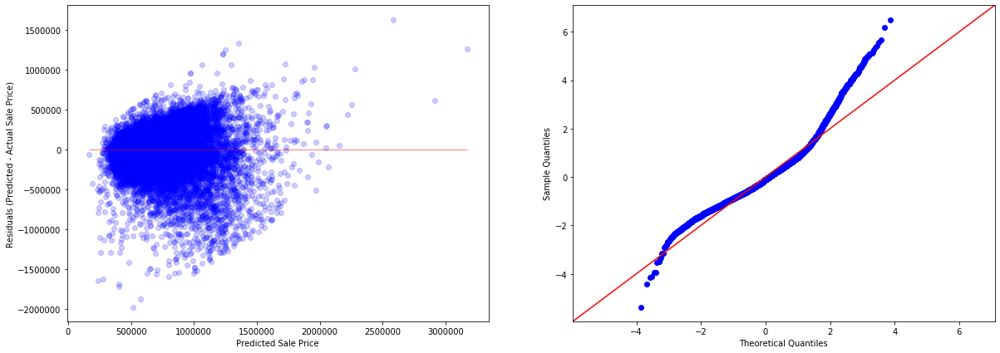

In [79]:
check_lr_assumptions(model_2_sqrt, model_2_sqrt_df, outcome, predictors)

In [80]:
append_results('model_2_sqrt', formula, model_2_sqrt, model_2_sqrt_df, outcome, predictors,
               note='remove outliers w/ z-score & get sqrt of open porch')

,Model,Formula,R-Squared,Rainbow statistic,Rainbow p-value,Linearity Assumption,Jarque-Bera statistic,Jarque-Bera p-value,Normality Assumption,Lagrange Multiplier p-value,F-statistic p-value,Homoskedasticity Assumption,Multicollinearity,Independence Assumption,Note
0,sm_1,SalePrice ~ SqFtTotLiving,0.386491,0.872905,1.000000e+00,Satisfied,1.305055e+07,0.000000e+00,Violated,NaN,3.931011e-82,Violated,N/A,N/A,"with outliers, no transform"
1,sm_2,SalePrice ~ SqFtTotLiving,0.399934,1.027984,9.517113e-02,Satisfied,8.752700e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers with z-score
2,sm_2_log,log_SalePrice ~ log_SqFtTotLiving,0.291863,1.352501,1.084791e-46,Violated,3.094762e+06,0.000000e+00,Violated,NaN,1.163439e-59,Violated,N/A,N/A,remove SalePrice outliers w/ z-scores then log...
3,sm_2_sqrt,sqrt_SalePrice ~ sqrt_SqFtTotLiving,0.379239,1.053338,6.839964e-03,Violated,1.509920e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt tr...
4,sm_2_sqrt_2,SalePrice ~ sqrt_SqFtTotLiving,0.375599,1.033779,5.747716e-02,Satisfied,8.842146e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt on...
5,sm_2_sqrt_3,sqrt_SalePrice ~ SqFtTotLiving,0.393446,1.050943,9.197660e-03,Violated,1.577432e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt on...
6,sm_3,SalePrice ~ SqFtTotLiving,0.308273,0.991329,6.565131e-01,Satisfied,1.038380e+03,3.300538e-226,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ IQR
7,model_2_sqrt,SalePrice ~ SqFtTotLiving + sqrt_SqFtOpenPorch,0.401072,1.026429,1.079098e-01,Satisfied,8.651622e+03,0.000000e+00,Violated,0.0,0.000000e+00,Violated,,Satisfied,remove outliers w/ z-score & get sqrt of open ...


In [81]:
model_results.sort_values(by='R-Squared', ascending=False)

,Model,Formula,R-Squared,Rainbow statistic,Rainbow p-value,Linearity Assumption,Jarque-Bera statistic,Jarque-Bera p-value,Normality Assumption,Lagrange Multiplier p-value,F-statistic p-value,Homoskedasticity Assumption,Multicollinearity,Independence Assumption,Note
7,model_2_sqrt,SalePrice ~ SqFtTotLiving + sqrt_SqFtOpenPorch,0.401072,1.026429,1.079098e-01,Satisfied,8.651622e+03,0.000000e+00,Violated,0.0,0.000000e+00,Violated,,Satisfied,remove outliers w/ z-score & get sqrt of open ...
1,sm_2,SalePrice ~ SqFtTotLiving,0.399934,1.027984,9.517113e-02,Satisfied,8.752700e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers with z-score
5,sm_2_sqrt_3,sqrt_SalePrice ~ SqFtTotLiving,0.393446,1.050943,9.197660e-03,Violated,1.577432e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt on...
0,sm_1,SalePrice ~ SqFtTotLiving,0.386491,0.872905,1.000000e+00,Satisfied,1.305055e+07,0.000000e+00,Violated,NaN,3.931011e-82,Violated,N/A,N/A,"with outliers, no transform"
3,sm_2_sqrt,sqrt_SalePrice ~ sqrt_SqFtTotLiving,0.379239,1.053338,6.839964e-03,Violated,1.509920e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt tr...
4,sm_2_sqrt_2,SalePrice ~ sqrt_SqFtTotLiving,0.375599,1.033779,5.747716e-02,Satisfied,8.842146e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt on...
6,sm_3,SalePrice ~ SqFtTotLiving,0.308273,0.991329,6.565131e-01,Satisfied,1.038380e+03,3.300538e-226,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ IQR
2,sm_2_log,log_SalePrice ~ log_SqFtTotLiving,0.291863,1.352501,1.084791e-46,Violated,3.094762e+06,0.000000e+00,Violated,NaN,1.163439e-59,Violated,N/A,N/A,remove SalePrice outliers w/ z-scores then log...


Including the square root of `SqFtOpenPorch` has improved the R-squared by a little tiny bit. This model satisfies the Linearity as well as Independence Assumption; but it still violates the other 2 (Normality & Homoskedasticity). The coefficients for Intercept and both predictors are statistically significant. 

Based on these results, `model_2_sqrt` is currently the best performing model with an R-squared of **0.401072**, which means it is able to explain about 40.1% the variance of our target variable SalePrice.

- The `model_2_sqrt` model is currently predicting a sale price of USD 163000.0 when both total living space and `sqrt_SqFtOpenPorch` are 0, and also slightly higher than the predicted price for 0 sqft by the previous best performing model `sm_2`.
- And with an increase of 1 sqft in living space (while keeping `sqrt_SqFtOpenPorch` constant), the sale price is expected to increase by USD 270.2646, which is also lower than the `fsm_2` model.
- An increase of 1 "foot"(?) in `sqrt_SqFtOpenPorch` (while keeping `SqFtTotLiving` constant) would increase sale price by USD 2281.3525.

Now I'm curious how getting the square root of all 3 variables would turn out. Let's see.

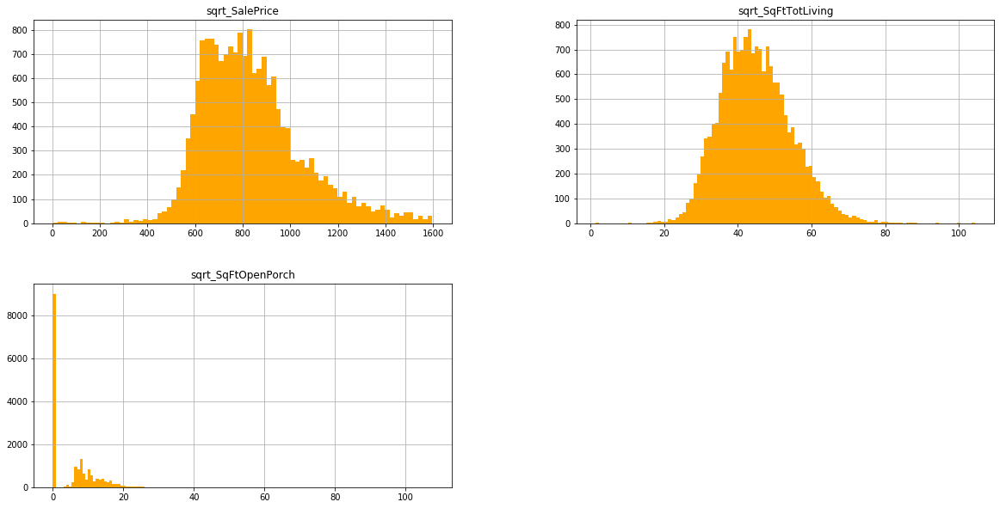

In [82]:
model_2_sqrt_all_df = sq_rt(model_2_df.columns, model_2_df)
model_2_sqrt_all_df.hist(figsize=(20,10), color='orange', bins='auto');

In [83]:
# `model_2_sqrt_all_df`
outcome = 'sqrt_SalePrice'
predictors = get_predictors(model_2_sqrt_all_df, outcome)
formula = create_formula(outcome, predictors)
model_2_sqrt_all = ols(formula=formula, data=model_2_sqrt_all_df).fit()
model_2_sqrt_all.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:         sqrt_SalePrice   R-squared:                       0.381
Model:                            OLS   Adj. R-squared:                  0.381
Method:                 Least Squares   F-statistic:                     5537.
Date:                Wed, 03 Mar 2021   Prob (F-statistic):               0.00
Time:                        18:57:06   Log-Likelihood:            -1.1759e+05
No. Observations:               18015   AIC:                         2.352e+05
Df Residuals:                   18012   BIC:                         2.352e+05
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept            232.5626      6.121     37.995      0.000     220.565     244.560
sqrt_SqFtTotLiving    13.2895      0.142     93.779      0.000      13.012      13.567
sqrt_SqFtOpenPorch     1.3892      0.211      6.570      0.000       0.975       1.804
==============================================================================
Omnibus:                      827.878   Durbin-Watson:                   1.955
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1487.554
Skew:                           0.367   Prob(JB):                         0.00
Kurtosis:                       4.202   Cond. No.                         230.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

					Statistic 			P-value
(Linearity) Rainbow Test 		1.0512506658764529 		0.008860869239222
(Normality) Jarque-Bera Test 		1487.5542919666048 		0.0

					Lagrange Multiplier p-value 	F-statistic p-value
(Homoskedasticity) Breusch-Pagan test 	0.0 				0.0

Independence:
              feature       VIF
0  sqrt_SqFtTotLiving  1.952552
1  sqrt_SqFtOpenPorch  1.952552


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


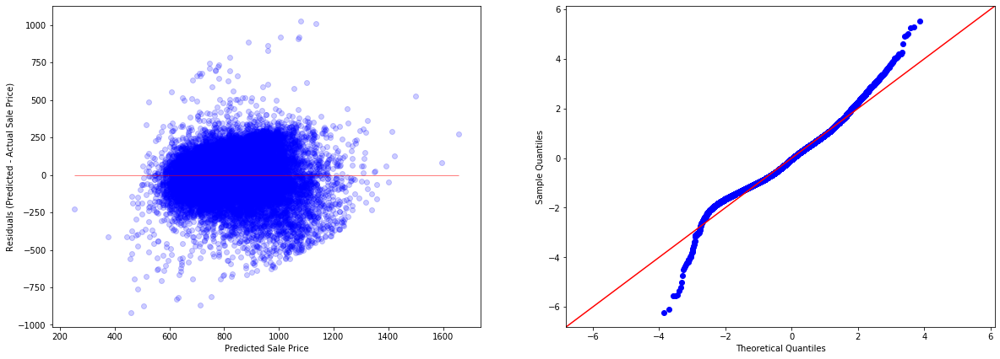

In [84]:
check_lr_assumptions(model_2_sqrt_all, model_2_sqrt_all_df, outcome, predictors)

In [85]:
append_results('model_2_sqrt_all', formula, model_2_sqrt_all, model_2_sqrt_all_df, outcome, predictors,
               note='remove saleprice outliers w/ z-score & get sqrt of all vars')

,Model,Formula,R-Squared,Rainbow statistic,Rainbow p-value,Linearity Assumption,Jarque-Bera statistic,Jarque-Bera p-value,Normality Assumption,Lagrange Multiplier p-value,F-statistic p-value,Homoskedasticity Assumption,Multicollinearity,Independence Assumption,Note
0,sm_1,SalePrice ~ SqFtTotLiving,0.386491,0.872905,1.000000e+00,Satisfied,1.305055e+07,0.000000e+00,Violated,NaN,3.931011e-82,Violated,N/A,N/A,"with outliers, no transform"
1,sm_2,SalePrice ~ SqFtTotLiving,0.399934,1.027984,9.517113e-02,Satisfied,8.752700e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers with z-score
2,sm_2_log,log_SalePrice ~ log_SqFtTotLiving,0.291863,1.352501,1.084791e-46,Violated,3.094762e+06,0.000000e+00,Violated,NaN,1.163439e-59,Violated,N/A,N/A,remove SalePrice outliers w/ z-scores then log...
3,sm_2_sqrt,sqrt_SalePrice ~ sqrt_SqFtTotLiving,0.379239,1.053338,6.839964e-03,Violated,1.509920e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt tr...
4,sm_2_sqrt_2,SalePrice ~ sqrt_SqFtTotLiving,0.375599,1.033779,5.747716e-02,Satisfied,8.842146e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt on...
5,sm_2_sqrt_3,sqrt_SalePrice ~ SqFtTotLiving,0.393446,1.050943,9.197660e-03,Violated,1.577432e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt on...
6,sm_3,SalePrice ~ SqFtTotLiving,0.308273,0.991329,6.565131e-01,Satisfied,1.038380e+03,3.300538e-226,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ IQR
7,model_2_sqrt,SalePrice ~ SqFtTotLiving + sqrt_SqFtOpenPorch,0.401072,1.026429,1.079098e-01,Satisfied,8.651622e+03,0.000000e+00,Violated,0.0,0.000000e+00,Violated,,Satisfied,remove outliers w/ z-score & get sqrt of open ...
8,model_2_sqrt_all,sqrt_SalePrice ~ sqrt_SqFtTotLiving + sqrt_SqF...,0.380722,1.051251,8.860869e-03,Violated,1.487554e+03,0.000000e+00,Violated,0.0,0.000000e+00,Violated,,Satisfied,remove saleprice outliers w/ z-score & get sqr...


So far, `model_2_sqrt` is still the best performing one, so I'll stick with that.

However, since `SqFtOpenPorch` has a lot of 0 valued datapoints. I wonder if treating it as a categorical feature would make more sense. I can create another column that keeps track of whether a house has an open porch or not using (1/0) to see how it goes.

In [86]:
# create a function that convert x to binary 0/1
# output would be similar to LabelEncoder
def convert_to_binary(x):
    return 1 if x > 0 else 0

In [87]:
model_2_df['has_OpenPorch'] = model_2_df.SqFtOpenPorch.apply(convert_to_binary)

In [88]:
model_2_cat_df = model_2_df.drop('SqFtOpenPorch', axis=1)

In [89]:
model_2_cat_df.head()

,SalePrice,SqFtTotLiving,has_OpenPorch
0,560000,1930,1
1,435000,1975,1
8,648500,3300,0
11,380000,1750,1
14,930000,2580,1


In [90]:
# `model_2_cat_df`
outcome = 'SalePrice'
predictors = get_predictors(model_2_cat_df, outcome)
formula = create_formula(outcome, predictors)
model_2_cat = ols(formula=formula, data=model_2_cat_df).fit()
model_2_cat.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.400
Model:                            OLS   Adj. R-squared:                  0.400
Method:                 Least Squares   F-statistic:                     6012.
Date:                Wed, 03 Mar 2021   Prob (F-statistic):               0.00
Time:                        18:57:07   Log-Likelihood:            -2.5300e+05
No. Observations:               18015   AIC:                         5.060e+05
Df Residuals:                   18012   BIC:                         5.060e+05
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept      1.597e+05   5801.591     27.531      0.000    1.48e+05    1.71e+05
SqFtTotLiving   273.8986      2.672    102.525      0.000     268.662     279.135
has_OpenPorch  1.607e+04   4792.446      3.353      0.001    6673.033    2.55e+04
==============================================================================
Omnibus:                     3422.505   Durbin-Watson:                   1.964
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             8742.264
Skew:                           1.044   Prob(JB):                         0.00
Kurtosis:                       5.699   Cond. No.                     5.91e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.91e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

					Statistic 			P-value
(Linearity) Rainbow Test 		1.0274033202424164 		0.09979305283870762
(Normality) Jarque-Bera Test 		8742.26376887242 		0.0

					Lagrange Multiplier p-value 	F-statistic p-value
(Homoskedasticity) Breusch-Pagan test 	0.0 				0.0

Independence:
         feature       VIF
0  SqFtTotLiving  2.211267
1  has_OpenPorch  2.211267


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


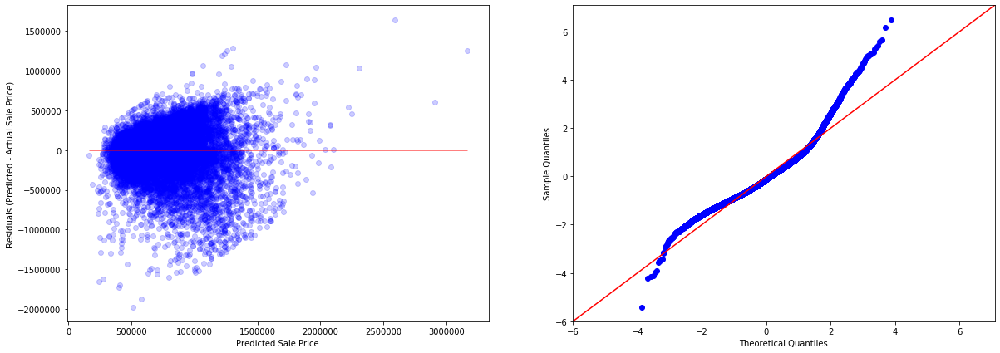

In [91]:
check_lr_assumptions(model_2_cat, model_2_cat_df, outcome, predictors)

In [92]:
append_results('model_2_cat', formula, model_2_cat, model_2_cat_df, outcome, predictors,
               note='remove saleprice outliers w/ z-score & convert open porch to binary')

,Model,Formula,R-Squared,Rainbow statistic,Rainbow p-value,Linearity Assumption,Jarque-Bera statistic,Jarque-Bera p-value,Normality Assumption,Lagrange Multiplier p-value,F-statistic p-value,Homoskedasticity Assumption,Multicollinearity,Independence Assumption,Note
0,sm_1,SalePrice ~ SqFtTotLiving,0.386491,0.872905,1.000000e+00,Satisfied,1.305055e+07,0.000000e+00,Violated,NaN,3.931011e-82,Violated,N/A,N/A,"with outliers, no transform"
1,sm_2,SalePrice ~ SqFtTotLiving,0.399934,1.027984,9.517113e-02,Satisfied,8.752700e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers with z-score
2,sm_2_log,log_SalePrice ~ log_SqFtTotLiving,0.291863,1.352501,1.084791e-46,Violated,3.094762e+06,0.000000e+00,Violated,NaN,1.163439e-59,Violated,N/A,N/A,remove SalePrice outliers w/ z-scores then log...
3,sm_2_sqrt,sqrt_SalePrice ~ sqrt_SqFtTotLiving,0.379239,1.053338,6.839964e-03,Violated,1.509920e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt tr...
4,sm_2_sqrt_2,SalePrice ~ sqrt_SqFtTotLiving,0.375599,1.033779,5.747716e-02,Satisfied,8.842146e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt on...
5,sm_2_sqrt_3,sqrt_SalePrice ~ SqFtTotLiving,0.393446,1.050943,9.197660e-03,Violated,1.577432e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt on...
6,sm_3,SalePrice ~ SqFtTotLiving,0.308273,0.991329,6.565131e-01,Satisfied,1.038380e+03,3.300538e-226,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ IQR
7,model_2_sqrt,SalePrice ~ SqFtTotLiving + sqrt_SqFtOpenPorch,0.401072,1.026429,1.079098e-01,Satisfied,8.651622e+03,0.000000e+00,Violated,0.0,0.000000e+00,Violated,,Satisfied,remove outliers w/ z-score & get sqrt of open ...
8,model_2_sqrt_all,sqrt_SalePrice ~ sqrt_SqFtTotLiving + sqrt_SqF...,0.380722,1.051251,8.860869e-03,Violated,1.487554e+03,0.000000e+00,Violated,0.0,0.000000e+00,Violated,,Satisfied,remove saleprice outliers w/ z-score & get sqr...
9,model_2_cat,SalePrice ~ SqFtTotLiving + has_OpenPorch,0.400308,1.027403,9.979305e-02,Satisfied,8.742264e+03,0.000000e+00,Violated,0.0,0.000000e+00,Violated,,Satisfied,remove saleprice outliers w/ z-score & convert...


Among all the versions of `model_2`, getting the square root of `SqFtOpenPorch` is still the best performing one with an R-squared of 0.401072. Although converting that same feature to categorical is also coming in close second with an R-squared of 0.400308. Yet `model_2_cat` has lower p-value for Rainbow test (but still satisfies the Linearity assumption).

## Multiple Regresion

Randomly selecting features to add into our model is not going to be helpful when I have 60 columns as of now. Ideally, I would like to do scatter plot for all numeric predictors vs. `SalePrice` to see if there are any polynomial relationship that correlation might not reflect. 

In addition, there's also the possibility of interaction between different features that I need to consider.

Removing outliers using z-score seems to have produced good results so far, so I will proceed forward with the `df_2` dataset for now to see where it takes me.

In [93]:
def get_numeric_features(df):
    numeric_features = []
    for c in df.columns:
        if (df[c].dtype == 'int64' or df[c].dtype == 'float64') and c != 'SalePrice':
            numeric_features.append(c)
    return numeric_features

In [94]:
def scatterplot_feats_outcome(df, features, outcome):
    """
    # Visualizing the relationship between all numeric_features with target variable 'outcome' 
    using scatter plots in the dataframe 'df'
    """
    nrows = len(features) // 3
    nrows += 1 if (len(features) % 3 != 0) else 0
    fig, axes = plt.subplots(nrows=nrows, ncols=3, figsize=(21,nrows*5))
    for idx, f in enumerate(features):
        ax = axes[idx // 3][idx % 3]
        sns.scatterplot(data=df, x=outcome, y=f, ax=ax, color='blue', alpha=0.4)
    fig.tight_layout()
    fig.show();

I am going to convert `YrBuilt` and `YrRenovated` to duration varibles (just because in my head it makes more sense).

In [95]:
# Adding 2 more duration columns to the dataset
df_3 = df_2.copy()
df_3['Yrs_BeforeSold'] = 2019 - df_3.YrBuilt
df_3['Yrs_SinceRenovated'] = 2019 - df_3.YrRenovated

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  del sys.path[0]


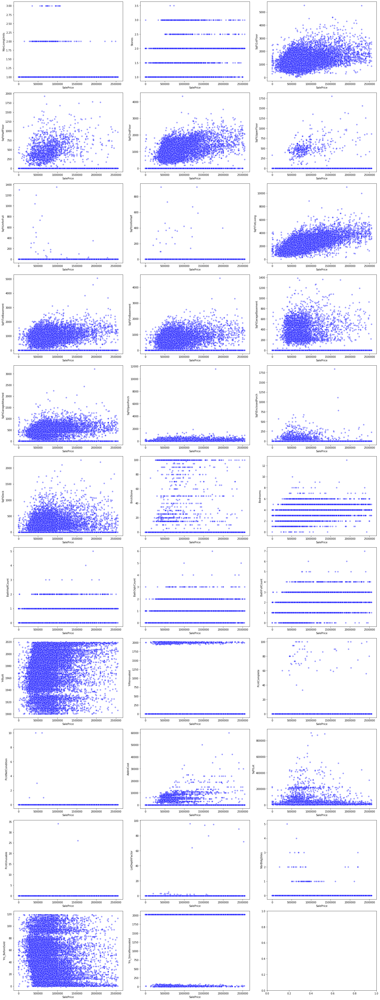

In [96]:
# getting numeric features and scatterplot them vs. 'SalePrice'
numeric_features_3 = get_numeric_features(df_3)
scatterplot_feats_outcome(df_3, numeric_features_3, 'SalePrice')

Some of these numerical valued features would need to be treated as categorical later.

Also, maybe instead of keeping track of the amount of time between a house being renovated and its sales being documented, I should consider adding another column that only stores whether a house has been renovated or not, called `been_Renovated`.

In [97]:
df_3['been_Renovated'] = df_3.YrRenovated.apply(convert_to_binary)

In [98]:
df_3.been_Renovated.value_counts()

0    17167
1      848
Name: been_Renovated, dtype: int64

Also, some other columns also have a large amount of 0 values, such as `SqFtHalfFloor`, `SqFt2ndFloor`, `SqFtTotBasement`, `SqFtFinBasement`, `SqFtGarageBasement`, `SqFtGarageAttached`, `SqFtEnclosedPorch` as well as `SqFtOpenPorch` and `SqFtDeck`. Since these area-related features are most likely correlated and can be a problem with multicollinearity, I'm thinking about converting them to binary as well. 

For example:
- `SqFtHalfFloor` would then be tranformed into `has_HalfFloor` with values of 0/1 only. 

In [99]:
to_bin_cols = ['SqFtHalfFloor', 'SqFt2ndFloor', 'SqFtTotBasement', 'SqFtFinBasement', 'SqFtGarageBasement',
               'SqFtGarageAttached', 'SqFtEnclosedPorch', 'SqFtDeck', 'SqFtOpenPorch']
for c in to_bin_cols:
    print(c)
    print(df_3[c].value_counts())

SqFtHalfFloor
0       16425
400        57
340        50
480        39
600        37
        ...  
1720        1
1240        1
1200        1
552         1
1390        1
Name: SqFtHalfFloor, Length: 161, dtype: int64
SqFt2ndFloor
0       10069
900        95
1020       76
960        74
1360       74
        ...  
1542        1
1494        1
1446        1
1414        1
1775        1
Name: SqFt2ndFloor, Length: 578, dtype: int64
SqFtTotBasement
0       9422
1010     160
1060     138
1100     131
1200     121
        ... 
855        1
3830       1
456        1
3097       1
1711       1
Name: SqFtTotBasement, Length: 358, dtype: int64
SqFtFinBasement
0       10823
500       196
600       149
400       145
800       145
        ...  
396         1
486         1
694         1
1014        1
975         1
Name: SqFtFinBasement, Length: 318, dtype: int64
SqFtGarageBasement
0       14063
200       256
240       197
220       164
290       145
        ...  
183         1
1350        1
1270        1


As observed, all these features has the top count values being 0.

In [100]:
# create new columns 
for c in to_bin_cols:
    df_3[f'has_{c[4:]}'] = df_3[c].apply(convert_to_binary)

In [101]:
df_3.columns

Index(['PIN', 'SalePrice', 'ExciseTaxNbr', 'DocumentDate', 'RecordingNbr',
       'PropertyType', 'PropertyClass', 'BldgNbr', 'NbrLivingUnits', 'Address',
       'Stories', 'BldgGrade', 'SqFt1stFloor', 'SqFtHalfFloor', 'SqFt2ndFloor',
       'SqFtUpperFloor', 'SqFtUnfinFull', 'SqFtUnfinHalf', 'SqFtTotLiving',
       'SqFtTotBasement', 'SqFtFinBasement', 'FinBasementGrade',
       'SqFtGarageBasement', 'SqFtGarageAttached', 'DaylightBasement',
       'SqFtOpenPorch', 'SqFtEnclosedPorch', 'SqFtDeck', 'HeatSystem',
       'HeatSource', 'BrickStone', 'ViewUtilization', 'Bedrooms',
       'BathHalfCount', 'Bath3qtrCount', 'BathFullCount', 'FpSingleStory',
       'FpMultiStory', 'FpFreestanding', 'FpAdditional', 'YrBuilt',
       'YrRenovated', 'PcntComplete', 'Obsolescence', 'PcntNetCondition',
       'Condition', 'AddnlCost', 'DistrictName', 'SqFtLot', 'WaterSystem',
       'SewerSystem', 'StreetSurface', 'RestrictiveSzShape',
       'InadequateParking', 'PcntUnusable', 'LotDepthFactor', '

The followings are the the continuous columns that I want to include in my preliminary multiple regression model. Since I'm using the binary versions for some of the numeric features, I am going to exclude them from my continuous list. Maybe later I should consider treating the discrete ones, like `BathHalfCount`, `Bath3qtrCount`, `BathFullCount` and even `Bedrooms` as categoricals instead. Then that'll be a lot of columns...

In [102]:
continuous = ['SalePrice', 'SqFt1stFloor', 'SqFtTotLiving',
              'Bedrooms', 'BathHalfCount', 'Bath3qtrCount', 
              'BathFullCount', 'Yrs_BeforeSold']
df_3_cont = df_3[continuous]

# reset index for df_3_cont for concatenating with df_3_cat later
df_3_cont.index = range(len(df_3_cont))

### Converting Categorical Features using OneHotEncoder()

First I have identified the categorical columns that I think might be more relevant to the purpose of this project, and then apply `OneHotEncoder()` on them.

In [103]:
categoricals = ['Stories', 'BldgGrade', 'FinBasementGrade', 'DaylightBasement', 'HeatSystem', 
                'HeatSource', 'ViewUtilization', 'FpSingleStory', 'FpMultiStory', 'FpFreestanding',
                'FpAdditional', 'Condition', 'WaterSystem', 'SewerSystem', 'TrafficNoise', 'Contamination',
                'WaterProblems', 'been_Renovated', 'DistrictName']

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  del sys.path[0]


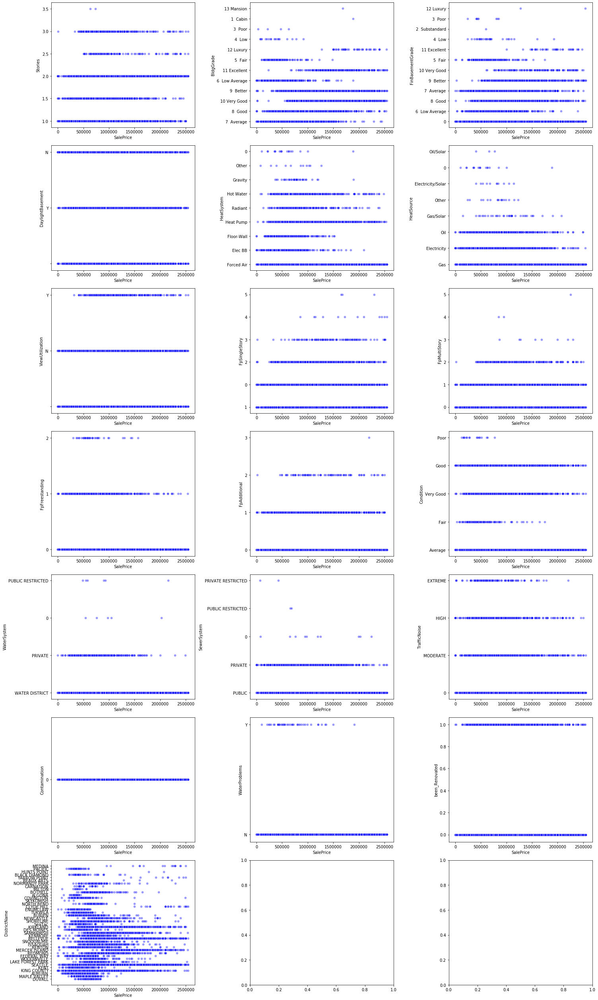

In [104]:
scatterplot_feats_outcome(df_3, categoricals, 'SalePrice')

Definitely don't need `Contamination` in this dataset, so I am going to exclude it later.

Also, `ViewUtilization` and `DaylightBasement` are kind of weird. I would assume the empty `' '` value indicates 'No', so I am going to convert those to `'N'` instead for both features (not sure if this interpretation is correct though).

In [105]:
for c in ['ViewUtilization', 'DaylightBasement']:
    df_3[c] = df_3[c].apply(lambda x: x if x in ['N', 'Y'] else 'N')

In [106]:
# Update the list of categorical features
categoricals = ['Stories', 'BldgGrade', 'FinBasementGrade', 'DaylightBasement', 'HeatSystem', 
                'HeatSource', 'ViewUtilization', 'FpSingleStory', 'FpMultiStory', 'FpFreestanding',
                'FpAdditional', 'Condition', 'WaterSystem', 'SewerSystem', 'TrafficNoise',
                'WaterProblems', 'been_Renovated', 'has_HalfFloor', 'has_2ndFloor',
                'has_TotBasement', 'has_FinBasement', 'has_GarageBasement', 'has_OpenPorch',
                'has_GarageAttached', 'has_EnclosedPorch', 'has_Deck', 'DistrictName']

In [107]:
# Apply OneHotEncoder() on categorical predictors
ohe = OneHotEncoder(drop='first')
ohe.fit(df_3[categoricals])
ohe_trans = ohe.transform(df_3[categoricals])

# Passing 'categoricals' into .get_feature_names() will include original feature names 
# in our OHE columns later
column_names = ohe.get_feature_names(categoricals)

df_3_cat = pd.DataFrame(ohe_trans.todense(), columns=column_names)

In [108]:
# concatenate 'df_3_cont' and 'df_3_cat' to create a final version of df_3
df_3_final = pd.concat([df_3_cont, df_3_cat], axis=1)

In [109]:
# Remove all white spaces in column names to make sure we don't have problem with
# creating formula later on

# Turned out some characters like '.', '/', '-' also seem to cause problem with statsmodels R formula
# --> remove them from all the column names
df_3_final.columns = [x.replace(" ", '')
                       .replace('.', '')
                       .replace("-", "_")
                       .replace("/", "_") for x in df_3_final.columns]

In [110]:
df_3_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18015 entries, 0 to 18014
Columns: 131 entries, SalePrice to DistrictName_YARROWPOINT
dtypes: float64(123), int64(8)
memory usage: 18.0 MB


This dataset is now including 131 columns including the outcome variable. I'm just going to fit a model using all 130 predictors to see how the results look.

In [111]:
# Fitting a model including all 130 predictors
outcome = 'SalePrice'
predictors = get_predictors(df_3_final, outcome)
formula = create_formula(outcome, predictors)
model_3_full = ols(formula=formula, data=df_3_final).fit()
model_3_full.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.753
Model:                            OLS   Adj. R-squared:                  0.752
Method:                 Least Squares   F-statistic:                     423.7
Date:                Wed, 03 Mar 2021   Prob (F-statistic):               0.00
Time:                        18:57:30   Log-Likelihood:            -2.4499e+05
No. Observations:               18015   AIC:                         4.902e+05
Df Residuals:                   17885   BIC:                         4.913e+05
Df Model:                         129                                         
Covariance Type:            nonrobust                                         
=================================================================================================
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept                      1.318e+06   2.19e+05      6.024      0.000    8.89e+05    1.75e+06
SqFt1stFloor                    -34.4607      7.180     -4.800      0.000     -48.534     -20.387
SqFtTotLiving                   185.7211      4.928     37.690      0.000     176.062     195.380
Bedrooms                      -2.425e+04   2266.206    -10.700      0.000   -2.87e+04   -1.98e+04
BathHalfCount                  2.761e+04   3714.595      7.432      0.000    2.03e+04    3.49e+04
Bath3qtrCount                  5.021e+04   3489.933     14.388      0.000    4.34e+04    5.71e+04
BathFullCount                  4.632e+04   3752.655     12.342      0.000     3.9e+04    5.37e+04
Yrs_BeforeSold                  998.6873     98.345     10.155      0.000     805.922    1191.453
Stories_15                     5.329e+05   7.44e+04      7.160      0.000    3.87e+05    6.79e+05
Stories_20                     2.882e+05   1.97e+05      1.466      0.143   -9.71e+04    6.73e+05
Stories_25                     9.189e+05   2.11e+05      4.352      0.000    5.05e+05    1.33e+06
Stories_30                      2.86e+05   1.97e+05      1.452      0.146      -1e+05    6.72e+05
Stories_35                     8.648e+05   2.52e+05      3.431      0.001    3.71e+05    1.36e+06
BldgGrade_10VeryGood          -7.106e+05   2.04e+05     -3.482      0.000   -1.11e+06   -3.11e+05
BldgGrade_11Excellent         -5.703e+05   2.05e+05     -2.788      0.005   -9.71e+05   -1.69e+05
BldgGrade_12Luxury            -4.963e+05   2.07e+05     -2.397      0.017   -9.02e+05   -9.05e+04
BldgGrade_13Mansion           -1.069e+06   2.84e+05     -3.768      0.000   -1.63e+06   -5.13e+05
BldgGrade_3Poor               -1.084e+06   2.23e+05     -4.863      0.000   -1.52e+06   -6.47e+05
BldgGrade_4Low                -1.153e+06   2.06e+05     -5.601      0.000   -1.56e+06    -7.5e+05
BldgGrade_5Fair               -1.143e+06   2.04e+05     -5.605      0.000   -1.54e+06   -7.43e+05
BldgGrade_6LowAverage         -1.165e+06   2.04e+05     -5.716      0.000   -1.56e+06   -7.65e+05
BldgGrade_7Average             -1.11e+06   2.04e+05     -5.447      0.000   -1.51e+06   -7.11e+05
BldgGrade_8Good               -1.033e+06   2.04e+05     -5.066      0.000   -1.43e+06   -6.33e+05
BldgGrade_9Better             -8.846e+05   2.04e+05     -4.338      0.000   -1.28e+06   -4.85e+05
FinBasementGrade_10VeryGood     3.01e+04   2.78e+04      1.085      0.278   -2.43e+04    8.45e+04
FinBasementGrade_11Excellent   5.675e+04   3.76e+04      1.508      0.132    -1.7e+04    1.31e+05
FinBasementGrade_12Luxury     -3.095e+05   1.32e+05     -2.341      0.019   -5.69e+05   -5.03e+04
FinBasementGrade_2Substandard  8.186e+04   1.81e+05      0.452      0.651   -2.73e+05    4.37e+05
FinBasementGrade_3Poor          4.19e+04   6.

					Statistic 			P-value
(Linearity) Rainbow Test 		1.1087538663712702 		5.300934406005537e-07
(Normality) Jarque-Bera Test 		38709.86214510306 		0.0

					Lagrange Multiplier p-value 	F-statistic p-value
(Homoskedasticity) Breusch-Pagan test 	0.0 				0.0


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/stats/outliers_influence.py:185: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)



Independence:
                      feature        VIF
0                SqFt1stFloor  43.727270
1               SqFtTotLiving  59.734593
2                    Bedrooms  30.160918
3               BathHalfCount   3.250749
4               Bath3qtrCount   3.761713
..                        ...        ...
125   DistrictName_SNOQUALMIE   5.779316
126       DistrictName_SeaTac   4.541604
127      DistrictName_TUKWILA   3.785528
128  DistrictName_WOODINVILLE   3.880173
129  DistrictName_YARROWPOINT   1.225612

[130 rows x 2 columns]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


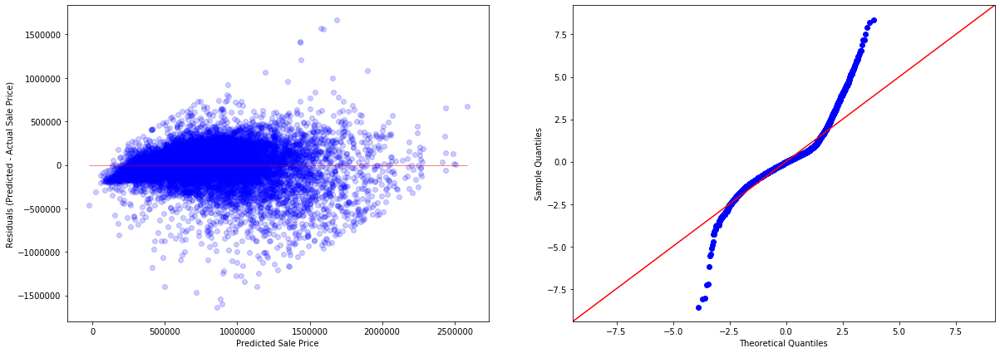

In [112]:
check_lr_assumptions(model_3_full, df_3_final, outcome, predictors)

In [113]:
append_results('model_3_full', formula, model_3_full, df_3_final, outcome, predictors, 
               note=f'includes all {len(df_3_final.columns)-1} features')

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/stats/outliers_influence.py:185: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


,Model,Formula,R-Squared,Rainbow statistic,Rainbow p-value,Linearity Assumption,Jarque-Bera statistic,Jarque-Bera p-value,Normality Assumption,Lagrange Multiplier p-value,F-statistic p-value,Homoskedasticity Assumption,Multicollinearity,Independence Assumption,Note
0,sm_1,SalePrice ~ SqFtTotLiving,0.386491,0.872905,1.000000e+00,Satisfied,1.305055e+07,0.000000e+00,Violated,NaN,3.931011e-82,Violated,N/A,N/A,"with outliers, no transform"
1,sm_2,SalePrice ~ SqFtTotLiving,0.399934,1.027984,9.517113e-02,Satisfied,8.752700e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers with z-score
2,sm_2_log,log_SalePrice ~ log_SqFtTotLiving,0.291863,1.352501,1.084791e-46,Violated,3.094762e+06,0.000000e+00,Violated,NaN,1.163439e-59,Violated,N/A,N/A,remove SalePrice outliers w/ z-scores then log...
3,sm_2_sqrt,sqrt_SalePrice ~ sqrt_SqFtTotLiving,0.379239,1.053338,6.839964e-03,Violated,1.509920e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt tr...
4,sm_2_sqrt_2,SalePrice ~ sqrt_SqFtTotLiving,0.375599,1.033779,5.747716e-02,Satisfied,8.842146e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt on...
5,sm_2_sqrt_3,sqrt_SalePrice ~ SqFtTotLiving,0.393446,1.050943,9.197660e-03,Violated,1.577432e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt on...
6,sm_3,SalePrice ~ SqFtTotLiving,0.308273,0.991329,6.565131e-01,Satisfied,1.038380e+03,3.300538e-226,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ IQR
7,model_2_sqrt,SalePrice ~ SqFtTotLiving + sqrt_SqFtOpenPorch,0.401072,1.026429,1.079098e-01,Satisfied,8.651622e+03,0.000000e+00,Violated,0.0,0.000000e+00,Violated,,Satisfied,remove outliers w/ z-score & get sqrt of open ...
8,model_2_sqrt_all,sqrt_SalePrice ~ sqrt_SqFtTotLiving + sqrt_SqF...,0.380722,1.051251,8.860869e-03,Violated,1.487554e+03,0.000000e+00,Violated,0.0,0.000000e+00,Violated,,Satisfied,remove saleprice outliers w/ z-score & get sqr...
9,model_2_cat,SalePrice ~ SqFtTotLiving + has_OpenPorch,0.400308,1.027403,9.979305e-02,Satisfied,8.742264e+03,0.000000e+00,Violated,0.0,0.000000e+00,Violated,,Satisfied,remove saleprice outliers w/ z-score & convert...


This multiple regression model `model_3_full` has a much higher R-Squared value of 0.753468, which means it's able to explain about 75.3% of the variance in `SalePrice`. HOWEVER, not all predictor coefficients are statistically significant. Also, this model violates all 4 assumptions.

I will thus attempt to use stepwise selection to this dataset to see if that'd help narrow down the most prominent features for my model.

### Stepwise Selection

In [114]:
def stepwise_selection(X, y, 
                       initial_list=[], 
                       threshold_in=0.01, 
                       threshold_out = 0.05, 
                       verbose=True):
    """ 
    Perform a forward-backward feature selection 
    based on p-value from statsmodels.api.OLS
    Arguments:
        X - pandas.DataFrame with candidate features
        y - list-like with the target
        initial_list - list of features to start with (column names of X)
        threshold_in - include a feature if its p-value < threshold_in
        threshold_out - exclude a feature if its p-value > threshold_out
        verbose - whether to print the sequence of inclusions and exclusions
    Returns: list of selected features 
    Always set threshold_in < threshold_out to avoid infinite looping.
    See https://en.wikipedia.org/wiki/Stepwise_regression for the details
    """
    included = list(initial_list)
    while True:
        changed=False
        # forward step
        excluded = list(set(X.columns)-set(included))
        new_pval = pd.Series(index=excluded)
        for new_column in excluded:
            model = sm.OLS(y, sm.add_constant(pd.DataFrame(X[included+[new_column]]))).fit()
            new_pval[new_column] = model.pvalues[new_column]
        best_pval = new_pval.min()
        if best_pval < threshold_in:
            best_feature = new_pval.idxmin()
            included.append(best_feature)
            changed=True
            if verbose:
                print('Add  {:30} with p-value {:.6}'.format(best_feature, best_pval))

        # backward step
        model = sm.OLS(y, sm.add_constant(pd.DataFrame(X[included]))).fit()
        # use all coefs except intercept
        pvalues = model.pvalues.iloc[1:]
        worst_pval = pvalues.max() # null if pvalues is empty
        if worst_pval > threshold_out:
            changed=True
            worst_feature = pvalues.idxmax()    # should be .idxmax(), not .argmax()
            included.remove(worst_feature)
            if verbose:
                print('Drop {:30} with p-value {:.6}'.format(worst_feature, worst_pval))
        if not changed:
            break
    return included

In [115]:
X3 = df_3_final.drop('SalePrice', axis=1)
y3 = df_3_final.SalePrice

In [116]:
predictors = stepwise_selection(X3, y3)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.


Add  Bedrooms                       with p-value 0.0
Add  BldgGrade_9Better              with p-value 0.0
Add  BldgGrade_11Excellent          with p-value 0.0
Add  BldgGrade_10VeryGood           with p-value 0.0
Add  DistrictName_SEATTLE           with p-value 0.0
Add  SqFtTotLiving                  with p-value 0.0
Add  DistrictName_BELLEVUE          with p-value 0.0
Add  DistrictName_MERCERISLAND      with p-value 1.71218e-242
Add  DistrictName_KIRKLAND          with p-value 2.36383e-270
Add  DistrictName_REDMOND           with p-value 1.20899e-148
Add  DistrictName_CLYDEHILL         with p-value 1.92298e-117
Add  DistrictName_MEDINA            with p-value 1.2596e-107
Add  DistrictName_SAMMAMISH         with p-value 4.75014e-79
Add  DistrictName_YARROWPOINT       with p-value 7.45311e-75
Add  DistrictName_FEDERALWAY        with p-value 6.61812e-70
Add  DistrictName_AUBURN            with p-value 1.97772e-69
Add  BldgGrade_8Good                with p-value 1.7735e-63
Add  Yrs_BeforeS

In [117]:
len(predictors)

69

I will then try to fit a model using these 69 identified features to see how the results would look. 
(69 seems like a lot though, so I might have to focus on Adjusted R-Squared)

In [118]:
outcome = 'SalePrice'
formula = create_formula(outcome, predictors)
model_3_stepwise = ols(formula=formula, data=df_3_final).fit()
model_3_stepwise.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.751
Model:                            OLS   Adj. R-squared:                  0.750
Method:                 Least Squares   F-statistic:                     784.0
Date:                Wed, 03 Mar 2021   Prob (F-statistic):               0.00
Time:                        19:06:01   Log-Likelihood:            -2.4509e+05
No. Observations:               18015   AIC:                         4.903e+05
Df Residuals:                   17945   BIC:                         4.909e+05
Df Model:                          69                                         
Covariance Type:            nonrobust                                         
================================================================================================
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
Intercept                     1.722e+05   1.47e+04     11.712      0.000    1.43e+05    2.01e+05
Bedrooms                     -2.563e+04   2247.335    -11.404      0.000      -3e+04   -2.12e+04
BldgGrade_9Better              2.77e+05   8836.215     31.344      0.000     2.6e+05    2.94e+05
BldgGrade_11Excellent          5.89e+05    1.7e+04     34.673      0.000    5.56e+05    6.22e+05
BldgGrade_10VeryGood          4.471e+05   1.15e+04     39.024      0.000    4.25e+05     4.7e+05
DistrictName_SEATTLE          2.878e+05   5550.751     51.851      0.000    2.77e+05    2.99e+05
SqFtTotLiving                  182.9917      4.468     40.953      0.000     174.233     191.750
DistrictName_BELLEVUE         3.945e+05   7927.882     49.763      0.000    3.79e+05     4.1e+05
DistrictName_MERCERISLAND     6.081e+05   1.47e+04     41.349      0.000    5.79e+05    6.37e+05
DistrictName_KIRKLAND         3.332e+05   8005.760     41.619      0.000    3.17e+05    3.49e+05
DistrictName_REDMOND          3.106e+05   1.07e+04     29.106      0.000     2.9e+05    3.32e+05
DistrictName_CLYDEHILL        1.145e+06   4.23e+04     27.040      0.000    1.06e+06    1.23e+06
DistrictName_MEDINA           1.232e+06   4.93e+04     24.969      0.000    1.14e+06    1.33e+06
DistrictName_SAMMAMISH        1.558e+05   8613.058     18.091      0.000    1.39e+05    1.73e+05
DistrictName_YARROWPOINT      1.317e+06   6.57e+04     20.046      0.000    1.19e+06    1.45e+06
DistrictName_FEDERALWAY      -1.542e+05   7918.169    -19.470      0.000    -1.7e+05   -1.39e+05
DistrictName_AUBURN          -1.505e+05   8601.602    -17.497      0.000   -1.67e+05   -1.34e+05
BldgGrade_8Good               1.309e+05   7107.210     18.419      0.000    1.17e+05    1.45e+05
Yrs_BeforeSold                 983.2506     89.819     10.947      0.000     807.197    1159.304
BldgGrade_12Luxury            6.478e+05   3.23e+04     20.042      0.000    5.84e+05    7.11e+05
DistrictName_KENT             -1.03e+05   7724.344    -13.339      0.000   -1.18e+05   -8.79e+04
DistrictName_ISSAQUAH          1.77e+05   1.22e+04     14.501      0.000    1.53e+05    2.01e+05
DistrictName_SHORELINE        1.534e+05   9763.508     15.716      0.000    1.34e+05    1.73e+05
ViewUtilization_Y             1.055e+05   1.08e+04      9.787      0.000    8.43e+04    1.27e+05
BldgGrade_7Average            5.216e+04   5819.368      8.964      0.000    4.08e+04    6.36e+04
has_OpenPorch_1               3.034e+04   3284.460      9.238      0.000    2.39e+04    3.68e+04
FinBasementGrade_6LowAverage -7.171e+04   7220.485     -9.931      0.000   -8.59e+04   -5.76e+04
DistrictName_ENUMCLAW        -1.205e+05   1.41e+04     -8.518      0.000   -1.48e+05   -9.28e+04
Bath3qtrCount                 5.081e+04   3462.117     14.675      0.000    

					Statistic 			P-value
(Linearity) Rainbow Test 		1.1056958071876204 		9.817761128299053e-07
(Normality) Jarque-Bera Test 		40016.12643375111 		0.0

					Lagrange Multiplier p-value 	F-statistic p-value
(Homoskedasticity) Breusch-Pagan test 	0.0 				0.0

Independence:
                      feature        VIF
0                    Bedrooms  28.588885
1           BldgGrade_9Better   4.701774
2       BldgGrade_11Excellent   1.713299
3        BldgGrade_10VeryGood   3.012984
4        DistrictName_SEATTLE   4.255136
..                        ...        ...
64     FinBasementGrade_8Good   2.285640
65    DistrictName_SNOQUALMIE   1.093758
66  DistrictName_NORMANDYPARK   1.031974
67             FpAdditional_3   1.003737
68            FpSingleStory_4   1.021121

[69 rows x 2 columns]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


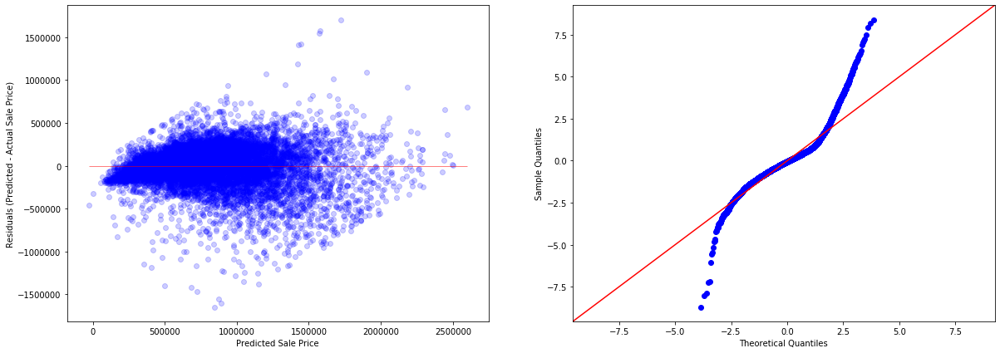

In [119]:
check_lr_assumptions(model_3_stepwise, df_3_final, outcome, predictors)

In [120]:
append_results('model_3_stepwise', formula, model_3_stepwise, df_3_final, outcome, predictors, 
               note=f'use stepwise selection to pick out {len(predictors)} features')

,Model,Formula,R-Squared,Rainbow statistic,Rainbow p-value,Linearity Assumption,Jarque-Bera statistic,Jarque-Bera p-value,Normality Assumption,Lagrange Multiplier p-value,F-statistic p-value,Homoskedasticity Assumption,Multicollinearity,Independence Assumption,Note
0,sm_1,SalePrice ~ SqFtTotLiving,0.386491,0.872905,1.000000e+00,Satisfied,1.305055e+07,0.000000e+00,Violated,NaN,3.931011e-82,Violated,N/A,N/A,"with outliers, no transform"
1,sm_2,SalePrice ~ SqFtTotLiving,0.399934,1.027984,9.517113e-02,Satisfied,8.752700e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers with z-score
2,sm_2_log,log_SalePrice ~ log_SqFtTotLiving,0.291863,1.352501,1.084791e-46,Violated,3.094762e+06,0.000000e+00,Violated,NaN,1.163439e-59,Violated,N/A,N/A,remove SalePrice outliers w/ z-scores then log...
3,sm_2_sqrt,sqrt_SalePrice ~ sqrt_SqFtTotLiving,0.379239,1.053338,6.839964e-03,Violated,1.509920e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt tr...
4,sm_2_sqrt_2,SalePrice ~ sqrt_SqFtTotLiving,0.375599,1.033779,5.747716e-02,Satisfied,8.842146e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt on...
5,sm_2_sqrt_3,sqrt_SalePrice ~ SqFtTotLiving,0.393446,1.050943,9.197660e-03,Violated,1.577432e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt on...
6,sm_3,SalePrice ~ SqFtTotLiving,0.308273,0.991329,6.565131e-01,Satisfied,1.038380e+03,3.300538e-226,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ IQR
7,model_2_sqrt,SalePrice ~ SqFtTotLiving + sqrt_SqFtOpenPorch,0.401072,1.026429,1.079098e-01,Satisfied,8.651622e+03,0.000000e+00,Violated,0.0,0.000000e+00,Violated,,Satisfied,remove outliers w/ z-score & get sqrt of open ...
8,model_2_sqrt_all,sqrt_SalePrice ~ sqrt_SqFtTotLiving + sqrt_SqF...,0.380722,1.051251,8.860869e-03,Violated,1.487554e+03,0.000000e+00,Violated,0.0,0.000000e+00,Violated,,Satisfied,remove saleprice outliers w/ z-score & get sqr...
9,model_2_cat,SalePrice ~ SqFtTotLiving + has_OpenPorch,0.400308,1.027403,9.979305e-02,Satisfied,8.742264e+03,0.000000e+00,Violated,0.0,0.000000e+00,Violated,,Satisfied,remove saleprice outliers w/ z-score & convert...


So, using `stepwise_selection`, I've been able to bring the number of predictors down to 69, while keeping R-Squared above 0.75, which is relatively high (compared to the previous model using all 130 features). 

However, these 2 models both violates all 4 assumptions and will need to be cleaned up further.

In [121]:
model_3_stepwise.params.sort_values(ascending=False)[:30]

DistrictName_YARROWPOINT       1.316813e+06
DistrictName_MEDINA            1.231995e+06
DistrictName_CLYDEHILL         1.144798e+06
DistrictName_BEAUXARTS         9.141379e+05
DistrictName_HUNTSPOINT        8.872589e+05
BldgGrade_12Luxury             6.477984e+05
DistrictName_MERCERISLAND      6.080544e+05
BldgGrade_11Excellent          5.889791e+05
FpAdditional_3                 5.139935e+05
BldgGrade_10VeryGood           4.470574e+05
DistrictName_BELLEVUE          3.945142e+05
DistrictName_KIRKLAND          3.331902e+05
DistrictName_REDMOND           3.106394e+05
DistrictName_SEATTLE           2.878109e+05
BldgGrade_9Better              2.769600e+05
DistrictName_ISSAQUAH          1.770031e+05
Intercept                      1.721985e+05
DistrictName_SAMMAMISH         1.558228e+05
DistrictName_SHORELINE         1.534457e+05
FpSingleStory_4                1.489817e+05
DistrictName_LAKEFORESTPARK    1.418173e+05
BldgGrade_8Good                1.309051e+05
DistrictName_NEWCASTLE         1

In [122]:
# create a function that retrieve features which contain certain keyword in their names
# and their coefficients from a pd Series of params 
def find_features(keyword, params):
    return params[params.index.str.contains(keyword)]

In [123]:
find_features("Heat", model_3_stepwise.params)

HeatSource_Electricity   -42854.637737
HeatSystem_ForcedAir     -23280.988733
HeatSystem_Floor_Wall    -30933.784376
HeatSource_Gas           -14179.792961
dtype: float64

In [124]:
1/np.sqrt(df_3_final.SalePrice)

0        0.001336
1        0.001516
2        0.001242
3        0.001622
4        0.001037
           ...   
18010    0.001129
18011    0.001534
18012    0.001187
18013    0.001552
18014    0.002834
Name: SalePrice, Length: 18015, dtype: float64

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  del sys.path[0]


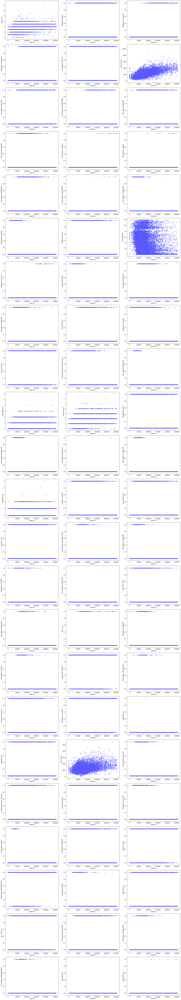

In [125]:
scatterplot_feats_outcome(df_3_final, predictors, 'SalePrice')

In [126]:
find_features("Porch", model_3_stepwise.params)

has_OpenPorch_1    30341.6778
dtype: float64

In [127]:
find_features("Basement", model_3_stepwise.params)

FinBasementGrade_6LowAverage   -71709.269546
DaylightBasement_Y             -39874.326609
FinBasementGrade_5Fair         -69305.803129
FinBasementGrade_7Average      -40557.229901
has_TotBasement_1               23943.679480
FinBasementGrade_8Good         -23395.950488
dtype: float64

In [128]:
find_features("Bedrooms", model_3_stepwise.params)

Bedrooms   -25627.555362
dtype: float64

I still don't understand how the number of Bedrooms could have a negative coefficient????

### Treating some discrete features as categoricals

As mentioned above, I think I'll try to treat some discrete features like `Bedrooms`, `BathHalfCount`, `Bath3qtrCount`, and `BathFullCount` as categoricals instead.

In [129]:
continuous2 = ['SalePrice', 'SqFt1stFloor', 'SqFtTotLiving', 'Yrs_BeforeSold']
df_3_cont2 = df_3[continuous2]

# reset index for df_3_cont for concatenating with df_3_cat later
df_3_cont2.index = range(len(df_3_cont))

In [130]:
# Update the list of categorical features
categoricals2 = ['Stories', 'BldgGrade', 'FinBasementGrade', 'DaylightBasement', 'HeatSystem', 
                 'HeatSource', 'ViewUtilization', 'FpSingleStory', 'FpMultiStory', 'FpFreestanding',
                 'FpAdditional', 'Condition', 'WaterSystem', 'SewerSystem', 'TrafficNoise',
                 'WaterProblems', 'been_Renovated', 'has_HalfFloor', 'has_2ndFloor',
                 'has_TotBasement', 'has_FinBasement', 'has_GarageBasement', 'has_OpenPorch',
                 'has_GarageAttached', 'has_EnclosedPorch', 'has_Deck', 'DistrictName',
                 'Bedrooms', 'BathHalfCount', 'Bath3qtrCount', 'BathFullCount']

In [131]:
# Apply OneHotEncoder() on categorical predictors
ohe = OneHotEncoder(drop='first')
ohe.fit(df_3[categoricals2])
ohe_trans = ohe.transform(df_3[categoricals2])

# Passing 'categoricals2' into .get_feature_names() will include original feature names 
# in our OHE columns later
column_names = ohe.get_feature_names(categoricals2)

df_3_cat2 = pd.DataFrame(ohe_trans.todense(), columns=column_names)

In [132]:
# concatenate 'df_3_cont' and 'df_3_cat' to create df_4
df_4 = pd.concat([df_3_cont2, df_3_cat2], axis=1)

In [133]:
# Remove identified characters in column names to make sure we don't have problem with
# creating R formula later on

df_4.columns = [x.replace(" ", '')
                 .replace('.', '')
                 .replace("-", "_")
                 .replace("/", "_") for x in df_4.columns]

In [134]:
df_4.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18015 entries, 0 to 18014
Columns: 156 entries, SalePrice to BathFullCount_7
dtypes: float64(152), int64(4)
memory usage: 21.4 MB


Now I have 156 columns including the target variable `SalePrice`. 

In [135]:
# Fitting a model including all 155 predictors
outcome = 'SalePrice'
predictors = get_predictors(df_4, outcome)
formula = create_formula(outcome, predictors)
model_4_full = ols(formula=formula, data=df_4).fit()
model_4_full.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.756
Model:                            OLS   Adj. R-squared:                  0.753
Method:                 Least Squares   F-statistic:                     360.8
Date:                Wed, 03 Mar 2021   Prob (F-statistic):               0.00
Time:                        19:07:06   Log-Likelihood:            -2.4492e+05
No. Observations:               18015   AIC:                         4.901e+05
Df Residuals:                   17861   BIC:                         4.913e+05
Df Model:                         153                                         
Covariance Type:            nonrobust                                         
=================================================================================================
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept                       1.41e+06   2.23e+05      6.322      0.000    9.73e+05    1.85e+06
SqFt1stFloor                    -31.4785      7.255     -4.339      0.000     -45.699     -17.258
SqFtTotLiving                   184.5287      4.992     36.968      0.000     174.745     194.313
Yrs_BeforeSold                 1012.4532     98.536     10.275      0.000     819.312    1205.594
Stories_15                     4.827e+05   7.48e+04      6.453      0.000    3.36e+05    6.29e+05
Stories_20                     2.398e+05   1.96e+05      1.222      0.222   -1.45e+05    6.24e+05
Stories_25                     8.214e+05   2.11e+05      3.889      0.000    4.07e+05    1.24e+06
Stories_30                     2.397e+05   1.97e+05      1.219      0.223   -1.46e+05    6.25e+05
Stories_35                     7.702e+05   2.52e+05      3.059      0.002    2.77e+05    1.26e+06
BldgGrade_10VeryGood          -6.485e+05   2.04e+05     -3.175      0.002   -1.05e+06   -2.48e+05
BldgGrade_11Excellent          -5.11e+05   2.05e+05     -2.496      0.013   -9.12e+05    -1.1e+05
BldgGrade_12Luxury            -4.045e+05   2.07e+05     -1.951      0.051   -8.11e+05    1822.166
BldgGrade_13Mansion           -8.641e+05   2.92e+05     -2.964      0.003   -1.44e+06   -2.93e+05
BldgGrade_3Poor               -1.053e+06   2.23e+05     -4.722      0.000   -1.49e+06   -6.16e+05
BldgGrade_4Low                -1.162e+06   2.05e+05     -5.660      0.000   -1.56e+06    -7.6e+05
BldgGrade_5Fair               -1.091e+06   2.04e+05     -5.350      0.000   -1.49e+06   -6.91e+05
BldgGrade_6LowAverage         -1.099e+06   2.04e+05     -5.390      0.000    -1.5e+06   -6.99e+05
BldgGrade_7Average            -1.045e+06   2.04e+05     -5.124      0.000   -1.44e+06   -6.45e+05
BldgGrade_8Good               -9.677e+05   2.04e+05     -4.743      0.000   -1.37e+06   -5.68e+05
BldgGrade_9Better             -8.208e+05   2.04e+05     -4.022      0.000   -1.22e+06   -4.21e+05
FinBasementGrade_10VeryGood    3.624e+04   2.79e+04      1.301      0.193   -1.84e+04    9.08e+04
FinBasementGrade_11Excellent   4.907e+04   3.77e+04      1.301      0.193   -2.49e+04    1.23e+05
FinBasementGrade_12Luxury     -3.467e+05   1.32e+05     -2.619      0.009   -6.06e+05   -8.72e+04
FinBasementGrade_2Substandard   7.31e+04   1.81e+05      0.405      0.686   -2.81e+05    4.27e+05
FinBasementGrade_3Poor         5.314e+04   6.35e+04      0.837      0.403   -7.13e+04    1.78e+05
FinBasementGrade_4Low          1.388e+04   3.88e+04      0.358      0.721   -6.22e+04    8.99e+04
FinBasementGrade_5Fair        -1.071e+04   2.43e+04     -0.441      0.659   -5.83e+04    3.69e+04
FinBasementGrade_6LowAverage  -1.681e+04   2.23e+04     -0.755      0.451   -6.05e+04    2.69e+04
FinBasementGrade_7Average      1.178e+04   2.

					Statistic 			P-value
(Linearity) Rainbow Test 		1.116562924251113 		9.528427196209266e-08
(Normality) Jarque-Bera Test 		37623.865881459504 		0.0

					Lagrange Multiplier p-value 	F-statistic p-value
(Homoskedasticity) Breusch-Pagan test 	0.0 				0.0


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/stats/outliers_influence.py:185: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)



Independence:
             feature          VIF
0       SqFt1stFloor    44.965032
1      SqFtTotLiving    61.729372
2     Yrs_BeforeSold    13.350567
3         Stories_15   217.127112
4         Stories_20  7480.829227
..               ...          ...
150  BathFullCount_3    10.255693
151  BathFullCount_4     2.219635
152  BathFullCount_5     1.298428
153  BathFullCount_6     2.030020
154  BathFullCount_7     1.139051

[155 rows x 2 columns]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


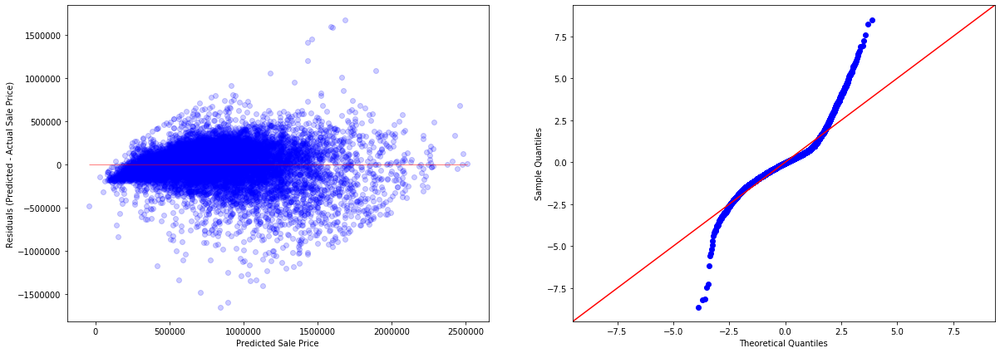

In [136]:
check_lr_assumptions(model_4_full, df_4, outcome, predictors)

In [137]:
append_results('model_4_full', formula, model_4_full, df_4, outcome, predictors, 
               note=f'treat discrete vars as categoricals, fit model on {len(df_4.columns)-1} predictors')

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/stats/outliers_influence.py:185: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


,Model,Formula,R-Squared,Rainbow statistic,Rainbow p-value,Linearity Assumption,Jarque-Bera statistic,Jarque-Bera p-value,Normality Assumption,Lagrange Multiplier p-value,F-statistic p-value,Homoskedasticity Assumption,Multicollinearity,Independence Assumption,Note
0,sm_1,SalePrice ~ SqFtTotLiving,0.386491,0.872905,1.000000e+00,Satisfied,1.305055e+07,0.000000e+00,Violated,NaN,3.931011e-82,Violated,N/A,N/A,"with outliers, no transform"
1,sm_2,SalePrice ~ SqFtTotLiving,0.399934,1.027984,9.517113e-02,Satisfied,8.752700e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers with z-score
2,sm_2_log,log_SalePrice ~ log_SqFtTotLiving,0.291863,1.352501,1.084791e-46,Violated,3.094762e+06,0.000000e+00,Violated,NaN,1.163439e-59,Violated,N/A,N/A,remove SalePrice outliers w/ z-scores then log...
3,sm_2_sqrt,sqrt_SalePrice ~ sqrt_SqFtTotLiving,0.379239,1.053338,6.839964e-03,Violated,1.509920e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt tr...
4,sm_2_sqrt_2,SalePrice ~ sqrt_SqFtTotLiving,0.375599,1.033779,5.747716e-02,Satisfied,8.842146e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt on...
5,sm_2_sqrt_3,sqrt_SalePrice ~ SqFtTotLiving,0.393446,1.050943,9.197660e-03,Violated,1.577432e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt on...
6,sm_3,SalePrice ~ SqFtTotLiving,0.308273,0.991329,6.565131e-01,Satisfied,1.038380e+03,3.300538e-226,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ IQR
7,model_2_sqrt,SalePrice ~ SqFtTotLiving + sqrt_SqFtOpenPorch,0.401072,1.026429,1.079098e-01,Satisfied,8.651622e+03,0.000000e+00,Violated,0.0,0.000000e+00,Violated,,Satisfied,remove outliers w/ z-score & get sqrt of open ...
8,model_2_sqrt_all,sqrt_SalePrice ~ sqrt_SqFtTotLiving + sqrt_SqF...,0.380722,1.051251,8.860869e-03,Violated,1.487554e+03,0.000000e+00,Violated,0.0,0.000000e+00,Violated,,Satisfied,remove saleprice outliers w/ z-score & get sqr...
9,model_2_cat,SalePrice ~ SqFtTotLiving + has_OpenPorch,0.400308,1.027403,9.979305e-02,Satisfied,8.742264e+03,0.000000e+00,Violated,0.0,0.000000e+00,Violated,,Satisfied,remove saleprice outliers w/ z-score & convert...


In [138]:
len(model_results.loc[9].Multicollinearity.split(','))

1

In [139]:
model_results.loc[10].Multicollinearity

'SqFt1stFloor, SqFtTotLiving, Bedrooms, BathFullCount, Yrs_BeforeSold, Stories_15, Stories_20, Stories_25, Stories_30, BldgGrade_10VeryGood, BldgGrade_11Excellent, BldgGrade_12Luxury, BldgGrade_4Low, BldgGrade_5Fair, BldgGrade_6LowAverage, BldgGrade_7Average, BldgGrade_8Good, BldgGrade_9Better, FinBasementGrade_10VeryGood, FinBasementGrade_11Excellent, FinBasementGrade_12Luxury, FinBasementGrade_2Substandard, FinBasementGrade_3Poor, FinBasementGrade_4Low, FinBasementGrade_5Fair, FinBasementGrade_6LowAverage, FinBasementGrade_7Average, FinBasementGrade_8Good, FinBasementGrade_9Better, HeatSystem_ElecBB, HeatSystem_Floor_Wall, HeatSystem_ForcedAir, HeatSystem_Gravity, HeatSystem_HeatPump, HeatSystem_HotWater, HeatSystem_Other, HeatSystem_Radiant, HeatSource_Electricity, HeatSource_Electricity_Solar, HeatSource_Gas, HeatSource_Gas_Solar, HeatSource_Oil, HeatSource_Other, WaterSystem_PRIVATE, WaterSystem_WATERDISTRICT, SewerSystem_PRIVATE, SewerSystem_PUBLIC, has_HalfFloor_1, has_2ndFloor_

And now I'm going to use `stepwise_selection()` on this version of the dataset `df_4` to see what it picks out. 

In [140]:
X4 = df_4.drop('SalePrice', axis=1)
y4 = df_4.SalePrice

In [141]:
predictors = stepwise_selection(X4, y4)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.


Add  BldgGrade_9Better              with p-value 0.0
Add  BldgGrade_11Excellent          with p-value 0.0
Add  SqFt1stFloor                   with p-value 0.0
Add  DistrictName_SEATTLE           with p-value 0.0
Add  BldgGrade_10VeryGood           with p-value 0.0
Add  BldgGrade_8Good                with p-value 0.0
Add  SqFtTotLiving                  with p-value 0.0
Add  DistrictName_BELLEVUE          with p-value 0.0
Add  DistrictName_KIRKLAND          with p-value 8.25587e-244
Add  DistrictName_MERCERISLAND      with p-value 9.04996e-268
Add  DistrictName_REDMOND           with p-value 2.03144e-142
Add  DistrictName_CLYDEHILL         with p-value 1.01742e-112
Add  DistrictName_MEDINA            with p-value 3.33782e-107
Add  DistrictName_FEDERALWAY        with p-value 6.05842e-89
Add  Yrs_BeforeSold                 with p-value 6.21523e-80
Drop SqFt1stFloor                   with p-value 0.317935
Add  BldgGrade_12Luxury             with p-value 1.57173e-94
Add  DistrictName_AUBURN 

In [142]:
len(predictors)

77

In [143]:
outcome = 'SalePrice'
formula = create_formula(outcome, predictors)
model_4_stepwise = ols(formula=formula, data=df_4).fit()
model_4_stepwise.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.752
Model:                            OLS   Adj. R-squared:                  0.751
Method:                 Least Squares   F-statistic:                     706.9
Date:                Wed, 03 Mar 2021   Prob (F-statistic):               0.00
Time:                        19:19:21   Log-Likelihood:            -2.4504e+05
No. Observations:               18015   AIC:                         4.902e+05
Df Residuals:                   17937   BIC:                         4.908e+05
Df Model:                          77                                         
Covariance Type:            nonrobust                                         
================================================================================================
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
Intercept                     1.405e+05   1.49e+04      9.412      0.000    1.11e+05     1.7e+05
BldgGrade_9Better             2.882e+05   8838.896     32.607      0.000    2.71e+05    3.06e+05
BldgGrade_11Excellent         6.038e+05   1.69e+04     35.785      0.000    5.71e+05    6.37e+05
DistrictName_SEATTLE          2.909e+05   5548.449     52.423      0.000     2.8e+05    3.02e+05
BldgGrade_10VeryGood          4.632e+05   1.14e+04     40.707      0.000    4.41e+05    4.85e+05
BldgGrade_8Good                1.37e+05   7146.720     19.163      0.000    1.23e+05    1.51e+05
SqFtTotLiving                  181.0960      4.457     40.627      0.000     172.359     189.833
DistrictName_BELLEVUE         3.931e+05   7914.279     49.671      0.000    3.78e+05    4.09e+05
DistrictName_KIRKLAND         3.341e+05   7991.231     41.814      0.000    3.18e+05     3.5e+05
DistrictName_MERCERISLAND     6.089e+05   1.47e+04     41.479      0.000     5.8e+05    6.38e+05
DistrictName_REDMOND          3.103e+05   1.06e+04     29.147      0.000    2.89e+05    3.31e+05
DistrictName_CLYDEHILL        1.148e+06   4.23e+04     27.164      0.000    1.06e+06    1.23e+06
DistrictName_MEDINA            1.24e+06   4.93e+04     25.164      0.000    1.14e+06    1.34e+06
DistrictName_FEDERALWAY      -1.518e+05   7892.277    -19.235      0.000   -1.67e+05   -1.36e+05
Yrs_BeforeSold                 919.5976     89.666     10.256      0.000     743.843    1095.352
BldgGrade_12Luxury            6.929e+05   3.22e+04     21.496      0.000     6.3e+05    7.56e+05
DistrictName_AUBURN          -1.487e+05   8586.021    -17.323      0.000   -1.66e+05   -1.32e+05
DistrictName_KENT            -1.025e+05   7712.273    -13.294      0.000   -1.18e+05   -8.74e+04
DistrictName_YARROWPOINT      1.319e+06   6.55e+04     20.124      0.000    1.19e+06    1.45e+06
DistrictName_SAMMAMISH        1.543e+05   8599.475     17.945      0.000    1.37e+05    1.71e+05
DistrictName_ISSAQUAH         1.804e+05   1.22e+04     14.807      0.000    1.57e+05    2.04e+05
DistrictName_SHORELINE        1.562e+05   9737.174     16.045      0.000    1.37e+05    1.75e+05
ViewUtilization_Y             1.074e+05   1.07e+04     10.000      0.000    8.64e+04    1.28e+05
has_OpenPorch_1               3.075e+04   3282.693      9.366      0.000    2.43e+04    3.72e+04
been_Renovated_1              6.849e+04   7628.090      8.978      0.000    5.35e+04    8.34e+04
DistrictName_ENUMCLAW        -1.235e+05   1.41e+04     -8.743      0.000   -1.51e+05   -9.58e+04
Condition_VeryGood            5.359e+04   5381.297      9.958      0.000     4.3e+04    6.41e+04
FinBasementGrade_6LowAverage  -3.18e+04   6019.812     -5.282      0.000   -4.36e+04      -2e+04
Condition_Good                3.044e+04   3827.014      7.953      0.000    

					Statistic 			P-value
(Linearity) Rainbow Test 		1.1124159511593121 		2.2950151043980636e-07
(Normality) Jarque-Bera Test 		39886.52221638996 		0.0

					Lagrange Multiplier p-value 	F-statistic p-value
(Homoskedasticity) Breusch-Pagan test 	0.0 				0.0

Independence:
                    feature       VIF
0         BldgGrade_9Better  4.708191
1     BldgGrade_11Excellent  1.698476
2      DistrictName_SEATTLE  4.267294
3      BldgGrade_10VeryGood  2.995637
4           BldgGrade_8Good  6.864893
..                      ...       ...
72          FpSingleStory_2  1.213809
73  DistrictName_SNOQUALMIE  1.095434
74           FpAdditional_3  1.008047
75          FpSingleStory_4  1.025512
76           FpMultiStory_1  2.456278

[77 rows x 2 columns]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


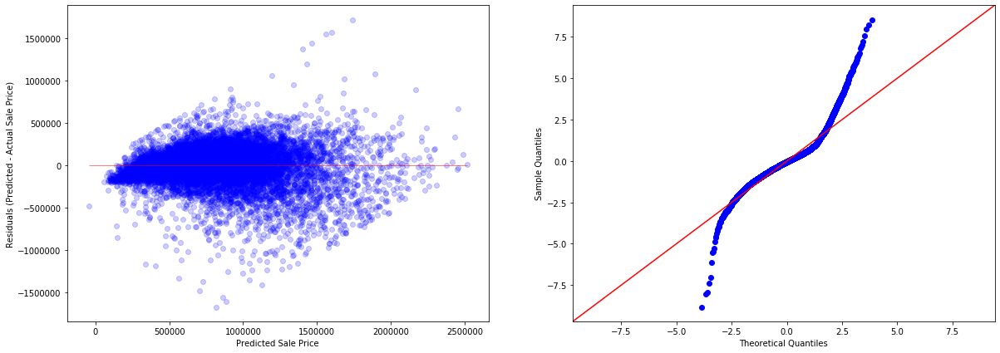

In [144]:
check_lr_assumptions(model_4_stepwise, df_4, outcome, predictors)

In [145]:
append_results('model_4_stepwise', formula, model_4_stepwise, df_4, outcome, predictors, 
               note=f'stepwise selection, {len(predictors)} predictors')

,Model,Formula,R-Squared,Rainbow statistic,Rainbow p-value,Linearity Assumption,Jarque-Bera statistic,Jarque-Bera p-value,Normality Assumption,Lagrange Multiplier p-value,F-statistic p-value,Homoskedasticity Assumption,Multicollinearity,Independence Assumption,Note
0,sm_1,SalePrice ~ SqFtTotLiving,0.386491,0.872905,1.000000e+00,Satisfied,1.305055e+07,0.000000e+00,Violated,NaN,3.931011e-82,Violated,N/A,N/A,"with outliers, no transform"
1,sm_2,SalePrice ~ SqFtTotLiving,0.399934,1.027984,9.517113e-02,Satisfied,8.752700e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers with z-score
2,sm_2_log,log_SalePrice ~ log_SqFtTotLiving,0.291863,1.352501,1.084791e-46,Violated,3.094762e+06,0.000000e+00,Violated,NaN,1.163439e-59,Violated,N/A,N/A,remove SalePrice outliers w/ z-scores then log...
3,sm_2_sqrt,sqrt_SalePrice ~ sqrt_SqFtTotLiving,0.379239,1.053338,6.839964e-03,Violated,1.509920e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt tr...
4,sm_2_sqrt_2,SalePrice ~ sqrt_SqFtTotLiving,0.375599,1.033779,5.747716e-02,Satisfied,8.842146e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt on...
5,sm_2_sqrt_3,sqrt_SalePrice ~ SqFtTotLiving,0.393446,1.050943,9.197660e-03,Violated,1.577432e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt on...
6,sm_3,SalePrice ~ SqFtTotLiving,0.308273,0.991329,6.565131e-01,Satisfied,1.038380e+03,3.300538e-226,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ IQR
7,model_2_sqrt,SalePrice ~ SqFtTotLiving + sqrt_SqFtOpenPorch,0.401072,1.026429,1.079098e-01,Satisfied,8.651622e+03,0.000000e+00,Violated,0.0,0.000000e+00,Violated,,Satisfied,remove outliers w/ z-score & get sqrt of open ...
8,model_2_sqrt_all,sqrt_SalePrice ~ sqrt_SqFtTotLiving + sqrt_SqF...,0.380722,1.051251,8.860869e-03,Violated,1.487554e+03,0.000000e+00,Violated,0.0,0.000000e+00,Violated,,Satisfied,remove saleprice outliers w/ z-score & get sqr...
9,model_2_cat,SalePrice ~ SqFtTotLiving + has_OpenPorch,0.400308,1.027403,9.979305e-02,Satisfied,8.742264e+03,0.000000e+00,Violated,0.0,0.000000e+00,Violated,,Satisfied,remove saleprice outliers w/ z-score & convert...


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  del sys.path[0]


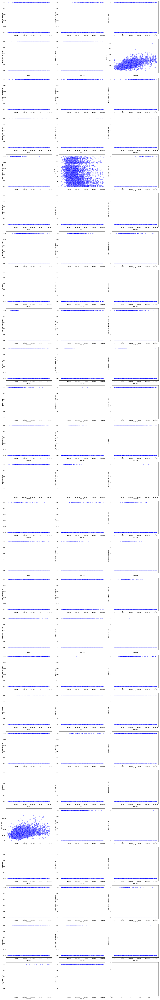

In [146]:
scatterplot_feats_outcome(df_4, predictors, 'SalePrice')

In [147]:
len(model_results.loc[12].Multicollinearity.split(','))

81

R-Squared for `model_4_stepwise` is higher than `model_3_stepwise`. Also, Rainbow p-value seems to go down a little bit from 9.817761e-07 to 2.295015e-07.

Although, on the bright side of things, `model_4_stepwise` has 11 variables with VIF > 5, which is less than what `model_3_stepwise` has (13).

Really need to figure out how to improve these scores and meet at least 1 assumption.

So far, I haven't really paid too much attention to the Residuals plots (aside from whether or not they look homoskedatic) --> probably need to figure out how to diagnose problems using residual plots.

### Variable Transformation

I am going to create a few different transformation functions and put at least the `SalePrice` variable through those to see which one(s) seem to yield better result (by comparing the distribution of the variable before & after transformation in terms of normality and symmetry).

(I just found out that we can do $log(x + 1)$ on variables that contains 0 values) --> this might be helpful for some variables with lots of 0s that I converted to binary above.

In [148]:
# def log_plus_1(cols, dt):
#     output = dt.copy()
#     for c in dt.columns:
#         if c in cols:
#             output[f'log_1_plus_{c}'] = np.log(dt[c] + 1)
#             output.drop(c, axis=1, inplace=True)
#     return output

In [149]:
# def x_3(cols, dt):
#     output = dt.copy()
#     for c in dt.columns:
#         if c in cols:
#             output[f'cubed_{c}'] = dt[c]**3
#             output.drop(c, axis=1, inplace=True)
#     return output

In [150]:
# def x_2(cols, dt):
#     output = dt.copy()
#     for c in dt.columns:
#         if c in cols:
#             output[f'squared_{c}'] = dt[c]**2
#             output.drop(c, axis=1, inplace=True)
#     return output

In [151]:
# def inverse(cols, dt):
#     output = dt.copy()
#     for c in dt.columns:
#         if c in cols:
#             output[f'inversed_{c}'] = 1/dt[c]
#             output.drop(c, axis=1, inplace=True)
#     return output

In [152]:
# def inverse_x_2(cols, dt):
#     output = dt.copy()
#     for c in dt.columns:
#         if c in cols:
#             output[f'inversed_squared_{c}'] = 1/(dt[c]**2)
#             output.drop(c, axis=1, inplace=True)
#     return output

In [153]:
# def inverse_x_3(cols, dt):
#     output = dt.copy()
#     for c in dt.columns:
#         if c in cols:
#             output[f'inversed_cubed_{c}'] = 1/(dt[c]**3)
#             output.drop(c, axis=1, inplace=True)
#     return output

In [154]:
# # Testing the transformation functions on a few numeric variables to see how they'd look
# to_test = ['SalePrice', 'SqFtTotLiving', 'Ratio1stFlr']
# transform_functs = [log_plus_1, log_transform, x_2, 
#                     inverse, inverse_x_2, sq_rt]
# prefixes = ['log_1_plus_', 'log_', 'squared_', 
#             'inversed_', 'inversed_squared_', 'sqrt_']

In [155]:
# fig, axes = plt.subplots(nrows=len(transform_functs), ncols=len(to_test), figsize=(20,len(transform_functs)*5))
# for r, funct in enumerate(transform_functs):
#     df = funct(to_test, df_3)
#     for c, var in enumerate(to_test):
#         ax = axes[r][c]
#         try:
#             sns.distplot(df[f'{prefixes[r]}{var}'], ax=ax, bins='auto')
#         except:
#             pass
# fig.show();

The above was me attempting to find the best transformation for my variables, which did not turn out very well (computer freezing up and making noises) --> in the meantime, I found out about boxcox, and am going to try it on `SalePrice`.

In [156]:
yt, fitted_lambda = stats.boxcox(df_4.SalePrice)

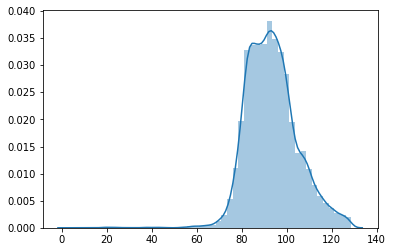

In [157]:
sns.distplot(yt);

In [158]:
# The most optimal power for 'SalePrice' transformation
fitted_lambda

0.2326980840110815

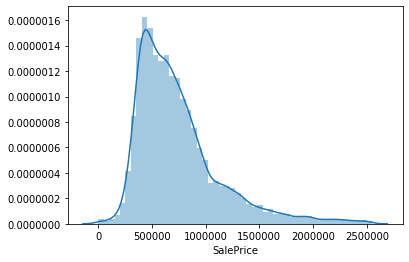

In [159]:
# raw 'SalePrice' plot
sns.distplot(df_4.SalePrice);

Compared to the "raw" `SalePrice`, transformed version does look more symmetrical. I want to see how fitting a model using `yt` (box cox transformed `SalePrice`) would look.

In [160]:
df_5 = df_4.copy()
df_5['bc_SalePrice'] = yt

In [161]:
df_5.drop('SalePrice', axis=1, inplace=True)

In [162]:
X5 = df_5.drop('bc_SalePrice', axis=1)
y5 = yt

In [163]:
predictors = stepwise_selection(X5, y5)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.


Add  BldgGrade_9Better              with p-value 0.0
Add  SqFt1stFloor                   with p-value 0.0
Add  DistrictName_SEATTLE           with p-value 0.0
Add  BldgGrade_10VeryGood           with p-value 0.0
Add  has_2ndFloor_1                 with p-value 0.0
Add  SqFtTotLiving                  with p-value 0.0
Add  DistrictName_BELLEVUE          with p-value 4.56616e-300
Add  DistrictName_KIRKLAND          with p-value 5.83473e-241
Add  DistrictName_MERCERISLAND      with p-value 5.80318e-199
Add  DistrictName_REDMOND           with p-value 7.03147e-165
Add  DistrictName_SAMMAMISH         with p-value 1.50413e-132
Add  DistrictName_FEDERALWAY        with p-value 1.77841e-109
Add  DistrictName_AUBURN            with p-value 1.04617e-113
Add  BldgGrade_8Good                with p-value 1.52599e-104
Add  BldgGrade_11Excellent          with p-value 5.96685e-124
Drop has_2ndFloor_1                 with p-value 0.10838
Add  DistrictName_KENT              with p-value 1.15021e-101
Add  

In [164]:
len(predictors)

74

In [165]:
outcome = 'bc_SalePrice'
formula = create_formula(outcome, predictors)
model_5_stepwise = ols(formula=formula, data=df_5).fit()
model_5_stepwise.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           bc_SalePrice   R-squared:                       0.743
Model:                            OLS   Adj. R-squared:                  0.742
Method:                 Least Squares   F-statistic:                     700.0
Date:                Wed, 03 Mar 2021   Prob (F-statistic):               0.00
Time:                        19:28:37   Log-Likelihood:                -57168.
No. Observations:               18015   AIC:                         1.145e+05
Df Residuals:                   17940   BIC:                         1.151e+05
Df Model:                          74                                         
Covariance Type:            nonrobust                                         
===============================================================================================
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
Intercept                      74.8031      0.433    172.763      0.000      73.954      75.652
BldgGrade_9Better               9.4420      0.258     36.646      0.000       8.937       9.947
DistrictName_SEATTLE            9.4818      0.163     58.035      0.000       9.162       9.802
BldgGrade_10VeryGood           12.4615      0.331     37.649      0.000      11.813      13.110
SqFtTotLiving                   0.0047   9.55e-05     49.318      0.000       0.005       0.005
DistrictName_BELLEVUE          11.2573      0.236     47.690      0.000      10.795      11.720
DistrictName_KIRKLAND          10.0241      0.238     42.100      0.000       9.557      10.491
DistrictName_MERCERISLAND      15.2875      0.436     35.049      0.000      14.433      16.143
DistrictName_REDMOND            9.8012      0.316     30.974      0.000       9.181      10.421
DistrictName_SAMMAMISH          6.0428      0.256     23.627      0.000       5.542       6.544
DistrictName_FEDERALWAY        -5.9701      0.235    -25.396      0.000      -6.431      -5.509
DistrictName_AUBURN            -5.8362      0.255    -22.849      0.000      -6.337      -5.336
BldgGrade_8Good                 5.9863      0.207     28.967      0.000       5.581       6.391
BldgGrade_11Excellent          14.5825      0.494     29.532      0.000      13.615      15.550
DistrictName_KENT              -4.0738      0.230    -17.726      0.000      -4.524      -3.623
DistrictName_MEDINA            27.9484      1.456     19.198      0.000      25.095      30.802
DistrictName_CLYDEHILL         23.8161      1.253     19.014      0.000      21.361      26.271
DistrictName_ISSAQUAH           6.6120      0.361     18.324      0.000       5.905       7.319
DistrictName_SHORELINE          5.5533      0.289     19.185      0.000       4.986       6.121
Yrs_BeforeSold                  0.0226      0.003      8.846      0.000       0.018       0.028
DistrictName_YARROWPOINT       28.6884      1.938     14.802      0.000      24.889      32.487
BldgGrade_12Luxury             14.7934      0.944     15.677      0.000      12.944      16.643
DistrictName_ENUMCLAW          -5.5211      0.419    -13.186      0.000      -6.342      -4.700
DistrictName_COVINGTON         -3.5609      0.369     -9.659      0.000      -4.283      -2.838
has_OpenPorch_1                 0.9243      0.097      9.515      0.000       0.734       1.115
DistrictName_MAPLEVALLEY       -2.3485      0.313     -7.509      0.000      -2.962      -1.735
BldgGrade_7Average              2.8672      0.171     16.803      0.000       2.533       3.202
DistrictName_DESMOINES         -2.5121      0.389     -6.461      0.000      -3.274      -1.750
ViewUtilization_Y               2.2850      0.316      7.232      0.000       1.666       2.904
DistrictNam

					Statistic 			P-value
(Linearity) Rainbow Test 		1.3122549328109954 		4.533549627944659e-38
(Normality) Jarque-Bera Test 		696804.3994039726 		0.0

					Lagrange Multiplier p-value 	F-statistic p-value
(Homoskedasticity) Breusch-Pagan test 	2.2416194684288672e-144 				3.565128069286673e-148

Independence:
                   feature        VIF
0        BldgGrade_9Better   4.580523
1     DistrictName_SEATTLE   4.173788
2     BldgGrade_10VeryGood   2.890694
3            SqFtTotLiving  22.064104
4    DistrictName_BELLEVUE   1.461058
..                     ...        ...
69              Stories_20   3.818568
70  DistrictName_SKYKOMISH   1.004472
71          FpAdditional_2   1.059548
72              Bedrooms_5   1.357121
73        FpFreestanding_1   1.151603

[74 rows x 2 columns]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


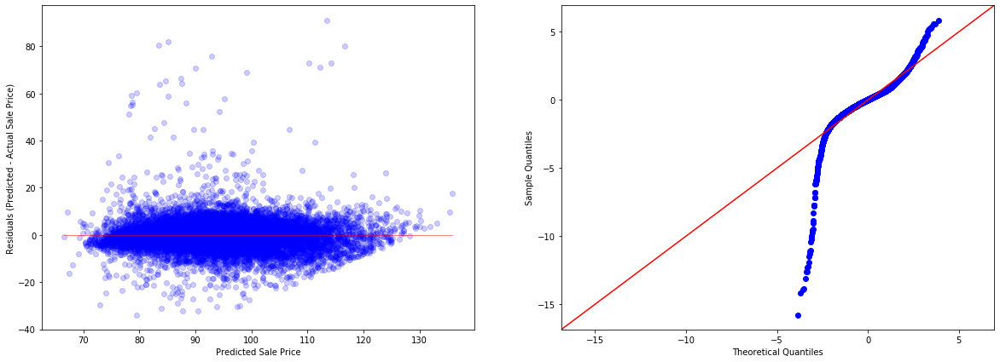

In [166]:
check_lr_assumptions(model_5_stepwise, df_5, outcome, predictors)

In [167]:
append_results('model_5_stepwise', formula, model_5_stepwise, df_5, outcome, predictors, 
               note=f'stepwise selection, boxcox saleprice, {len(predictors)} predictors')

,Model,Formula,R-Squared,Rainbow statistic,Rainbow p-value,Linearity Assumption,Jarque-Bera statistic,Jarque-Bera p-value,Normality Assumption,Lagrange Multiplier p-value,F-statistic p-value,Homoskedasticity Assumption,Multicollinearity,Independence Assumption,Note
0,sm_1,SalePrice ~ SqFtTotLiving,0.386491,0.872905,1.000000e+00,Satisfied,1.305055e+07,0.000000e+00,Violated,NaN,3.931011e-82,Violated,N/A,N/A,"with outliers, no transform"
1,sm_2,SalePrice ~ SqFtTotLiving,0.399934,1.027984,9.517113e-02,Satisfied,8.752700e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers with z-score
2,sm_2_log,log_SalePrice ~ log_SqFtTotLiving,0.291863,1.352501,1.084791e-46,Violated,3.094762e+06,0.000000e+00,Violated,NaN,1.163439e-59,Violated,N/A,N/A,remove SalePrice outliers w/ z-scores then log...
3,sm_2_sqrt,sqrt_SalePrice ~ sqrt_SqFtTotLiving,0.379239,1.053338,6.839964e-03,Violated,1.509920e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt tr...
4,sm_2_sqrt_2,SalePrice ~ sqrt_SqFtTotLiving,0.375599,1.033779,5.747716e-02,Satisfied,8.842146e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt on...
5,sm_2_sqrt_3,sqrt_SalePrice ~ SqFtTotLiving,0.393446,1.050943,9.197660e-03,Violated,1.577432e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt on...
6,sm_3,SalePrice ~ SqFtTotLiving,0.308273,0.991329,6.565131e-01,Satisfied,1.038380e+03,3.300538e-226,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ IQR
7,model_2_sqrt,SalePrice ~ SqFtTotLiving + sqrt_SqFtOpenPorch,0.401072,1.026429,1.079098e-01,Satisfied,8.651622e+03,0.000000e+00,Violated,0.000000e+00,0.000000e+00,Violated,,Satisfied,remove outliers w/ z-score & get sqrt of open ...
8,model_2_sqrt_all,sqrt_SalePrice ~ sqrt_SqFtTotLiving + sqrt_SqF...,0.380722,1.051251,8.860869e-03,Violated,1.487554e+03,0.000000e+00,Violated,0.000000e+00,0.000000e+00,Violated,,Satisfied,remove saleprice outliers w/ z-score & get sqr...
9,model_2_cat,SalePrice ~ SqFtTotLiving + has_OpenPorch,0.400308,1.027403,9.979305e-02,Satisfied,8.742264e+03,0.000000e+00,Violated,0.000000e+00,0.000000e+00,Violated,,Satisfied,remove saleprice outliers w/ z-score & convert...


In [169]:
find_features('Bed', model_5_stepwise.params)

Bedrooms_3    0.413142
Bedrooms_1    2.101433
Bedrooms_6   -2.000741
Bedrooms_5   -0.457690
dtype: float64

In [170]:
find_features('SqFt', model_5_stepwise.params)

SqFtTotLiving    0.004707
dtype: float64

In [171]:
find_features('has', model_5_stepwise.params)

has_OpenPorch_1      0.924327
has_TotBasement_1    1.666387
has_FinBasement_1   -1.487316
dtype: float64

In [172]:
find_features('Renovated', model_5_stepwise.params)

been_Renovated_1    1.501222
dtype: float64

So far I've only removed outliers in the dependent variable `SalePrice`. Removing outliers in the input variables would probably improve model performance, so I am going to attempt to do that on all the continuous variables in the `df_4` dataframe to see how that goes.

In [173]:
continuous2 = ['SalePrice', 'SqFt1stFloor', 'SqFtTotLiving', 'Yrs_BeforeSold']

In [174]:
df_6 = df_4.copy()
for c in continuous2[1:]:
    df_6 = remove_outliers_z(df_6, c)
df_6.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 17634 entries, 0 to 18014
Columns: 156 entries, SalePrice to BathFullCount_7
dtypes: float64(152), int64(4)
memory usage: 21.1 MB


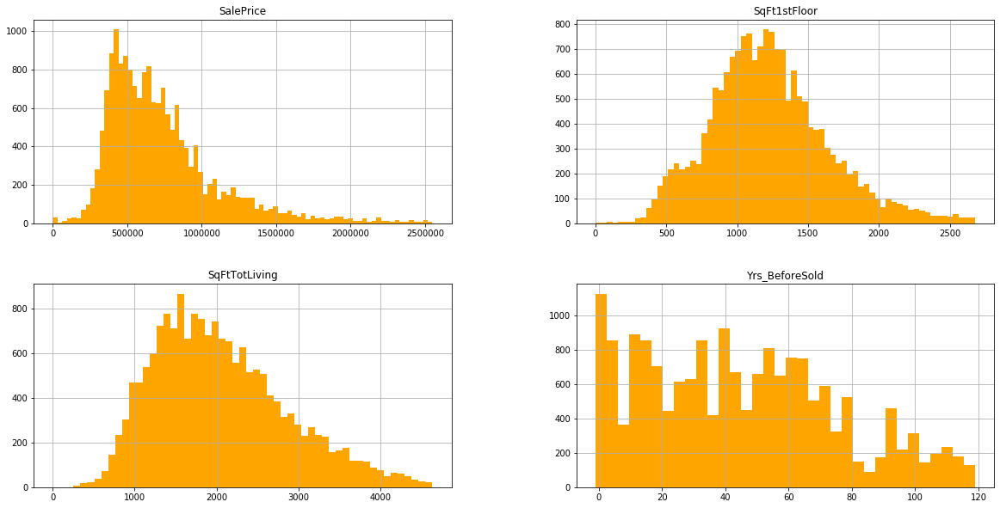

In [175]:
df_6[continuous2].hist(figsize=(20,10), color='orange', bins='auto');

Also, I'm thinking about adding another column called `Ratio1stFlr` which is the ratio of `'SqFt1stFloor'/'SqFtTotLiving'`. Maybe this would help reduce some of the Multicollinearity problems.

In [176]:
df_6['Ratio1stFlr'] = df_6.SqFt1stFloor / df_6.SqFtTotLiving

In [177]:
# Update continuous2 list
continuous2.append('Ratio1stFlr')
continuous2

['SalePrice', 'SqFt1stFloor', 'SqFtTotLiving', 'Yrs_BeforeSold', 'Ratio1stFlr']

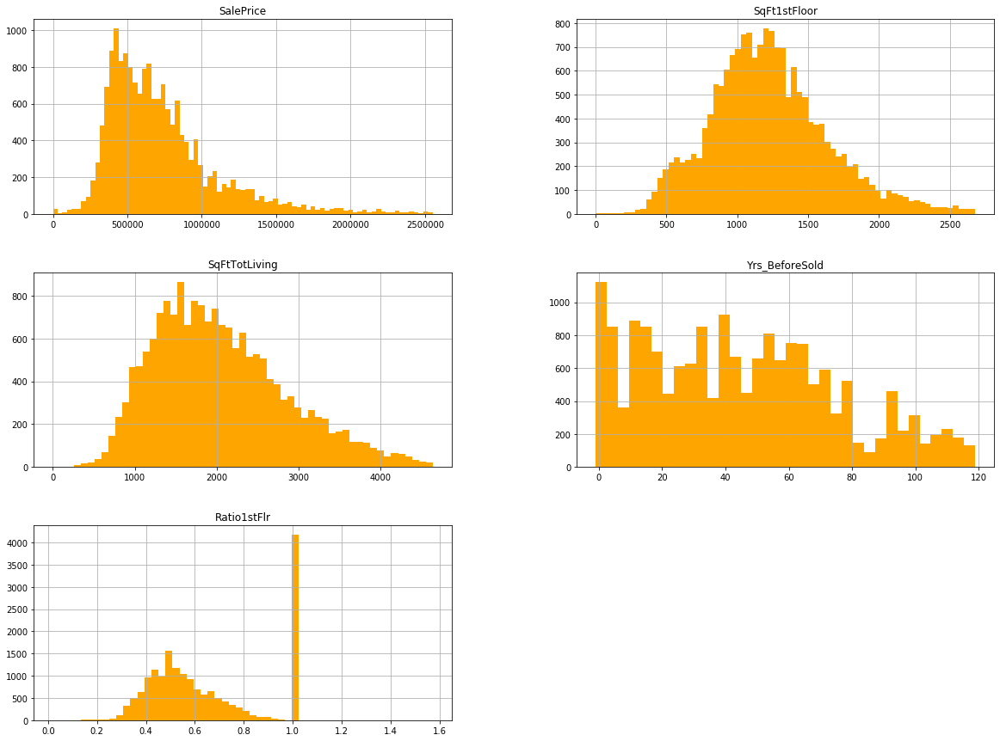

In [178]:
df_6[continuous2].hist(figsize=(20,15), color='orange', bins='auto');

In [179]:
df_6.Ratio1stFlr.value_counts()

1.000000    4174
0.500000     668
0.333333      73
0.666667      52
0.600000      37
            ... 
0.315152       1
0.456204       1
0.548000       1
0.437008       1
0.366906       1
Name: Ratio1stFlr, Length: 7671, dtype: int64

It looks like a good portion of these houses are actually only 1 story. Maybe that's contributing to my multicollinearity (because it's pretty much the same information as the `Stories` columns). Perhaps `SqFt1stFloor` can be removed from the dataframe, along with the `Ratio1stFlr` column.

In [180]:
df_6.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 17634 entries, 0 to 18014
Columns: 157 entries, SalePrice to Ratio1stFlr
dtypes: float64(153), int64(4)
memory usage: 21.3 MB


In [181]:
df_6.drop(['SqFt1stFloor', 'Ratio1stFlr'], axis=1, inplace=True)

In [182]:
X6 = df_6.drop('SalePrice', axis=1)
y6 = df_6.SalePrice

In [183]:
predictors = stepwise_selection(X6, y6)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  BldgGrade_9Better              with p-value 0.0


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  BldgGrade_10VeryGood           with p-value 0.0


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  BldgGrade_11Excellent          with p-value 0.0


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  DistrictName_SEATTLE           with p-value 0.0


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  BldgGrade_8Good                with p-value 0.0


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  SqFtTotLiving                  with p-value 0.0


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  DistrictName_BELLEVUE          with p-value 0.0


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  DistrictName_KIRKLAND          with p-value 1.12047e-245


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  DistrictName_MERCERISLAND      with p-value 1.37988e-260


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  DistrictName_REDMOND           with p-value 3.20506e-150


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  Yrs_BeforeSold                 with p-value 1.2404e-110


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  DistrictName_CLYDEHILL         with p-value 1.29572e-104


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  DistrictName_MEDINA            with p-value 3.62148e-105


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  DistrictName_FEDERALWAY        with p-value 3.24649e-95


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  DistrictName_AUBURN            with p-value 1.47898e-74


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  DistrictName_YARROWPOINT       with p-value 1.81432e-71


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  DistrictName_KENT              with p-value 3.06317e-69


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  DistrictName_SAMMAMISH         with p-value 3.28484e-48


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  DistrictName_ISSAQUAH          with p-value 2.97206e-40


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  DistrictName_SHORELINE         with p-value 1.88104e-35


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  ViewUtilization_Y              with p-value 4.22903e-28


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  FinBasementGrade_6LowAverage   with p-value 3.69653e-24


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  BldgGrade_6LowAverage          with p-value 4.87398e-22


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  BldgGrade_12Luxury             with p-value 3.00566e-20


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  has_OpenPorch_1                with p-value 2.03694e-18


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  DistrictName_ENUMCLAW          with p-value 3.63891e-18


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  DistrictName_BEAUXARTS         with p-value 4.40548e-16


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  DistrictName_COVINGTON         with p-value 2.02015e-15


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  DistrictName_MAPLEVALLEY       with p-value 3.47962e-16


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  been_Renovated_1               with p-value 3.03402e-14


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  Condition_VeryGood             with p-value 5.02646e-16


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  Condition_Good                 with p-value 3.39151e-15


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  Bedrooms_1                     with p-value 1.07534e-15


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  DaylightBasement_Y             with p-value 2.33371e-13


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  DistrictName_LAKEFORESTPARK    with p-value 6.26109e-12


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  Bedrooms_3                     with p-value 1.29715e-11


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  Bath3qtrCount_2                with p-value 3.20157e-11


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  DistrictName_DESMOINES         with p-value 8.70057e-09


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  has_TotBasement_1              with p-value 1.28113e-08


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  TrafficNoise_EXTREME           with p-value 1.67603e-08


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  TrafficNoise_HIGH              with p-value 5.74507e-08


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  BathFullCount_3                with p-value 1.00621e-07


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  DistrictName_KENMORE           with p-value 4.41196e-07


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  DistrictName_NEWCASTLE         with p-value 2.15004e-07


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  DistrictName_BOTHELL           with p-value 2.53892e-07


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  SewerSystem_PRIVATE            with p-value 4.76817e-07


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  DistrictName_WOODINVILLE       with p-value 3.10557e-07


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  Stories_25                     with p-value 5.85675e-07


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  FinBasementGrade_7Average      with p-value 1.89089e-06


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  FinBasementGrade_5Fair         with p-value 1.082e-07


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  Bedrooms_6                     with p-value 9.8105e-06


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  BathFullCount_4                with p-value 2.08102e-05


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  FpAdditional_1                 with p-value 7.42071e-05


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  Bath3qtrCount_1                with p-value 4.32288e-05


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  BathFullCount_1                with p-value 5.31562e-09


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  Bedrooms_2                     with p-value 1.1575e-05


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  BathHalfCount_1                with p-value 3.20075e-06


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  Stories_20                     with p-value 4.9872e-05


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  BathHalfCount_2                with p-value 1.9135e-05


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  HeatSource_Electricity         with p-value 6.06934e-05


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  HeatSystem_HeatPump            with p-value 3.23268e-05


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  FinBasementGrade_8Good         with p-value 0.000399548


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  FpSingleStory_2                with p-value 0.000649147


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  DistrictName_BURIEN            with p-value 0.000657922


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  DistrictName_NORMANDYPARK      with p-value 0.000624805


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  TrafficNoise_MODERATE          with p-value 0.000933626


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  DistrictName_PACIFIC           with p-value 0.00170375


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  BldgGrade_7Average             with p-value 0.00189466
Drop BldgGrade_6LowAverage          with p-value 0.676447


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  WaterSystem_WATERDISTRICT      with p-value 0.00150113


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  Bath3qtrCount_3                with p-value 0.00186553


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  DistrictName_SNOQUALMIE        with p-value 0.00304809


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  HeatSystem_ForcedAir           with p-value 0.00501542
Drop HeatSystem_HeatPump            with p-value 0.103312


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  HeatSystem_Floor_Wall          with p-value 0.000758049


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  Condition_Fair                 with p-value 0.00796049


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

In [184]:
len(predictors)

72

In [185]:
outcome = 'SalePrice'
formula = create_formula(outcome, predictors)
model_6_stepwise = ols(formula=formula, data=df_6).fit()
model_6_stepwise.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.739
Model:                            OLS   Adj. R-squared:                  0.738
Method:                 Least Squares   F-statistic:                     691.5
Date:                Wed, 03 Mar 2021   Prob (F-statistic):               0.00
Time:                        19:37:14   Log-Likelihood:            -2.3939e+05
No. Observations:               17634   AIC:                         4.789e+05
Df Residuals:                   17561   BIC:                         4.795e+05
Df Model:                          72                                         
Covariance Type:            nonrobust                                         
================================================================================================
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
Intercept                     7.464e+04   1.48e+04      5.040      0.000    4.56e+04    1.04e+05
BldgGrade_9Better             2.665e+05   8764.444     30.407      0.000    2.49e+05    2.84e+05
BldgGrade_10VeryGood          4.346e+05   1.15e+04     37.886      0.000    4.12e+05    4.57e+05
BldgGrade_11Excellent         6.125e+05   1.87e+04     32.793      0.000    5.76e+05    6.49e+05
DistrictName_SEATTLE          2.896e+05   5351.494     54.121      0.000    2.79e+05       3e+05
BldgGrade_8Good               1.261e+05   6955.506     18.132      0.000    1.12e+05     1.4e+05
SqFtTotLiving                  176.9743      3.648     48.515      0.000     169.824     184.124
DistrictName_BELLEVUE         3.917e+05   7903.393     49.564      0.000    3.76e+05    4.07e+05
DistrictName_KIRKLAND          3.31e+05   7873.184     42.037      0.000    3.16e+05    3.46e+05
DistrictName_MERCERISLAND     5.976e+05   1.47e+04     40.556      0.000    5.69e+05    6.27e+05
DistrictName_REDMOND          3.152e+05   1.04e+04     30.250      0.000    2.95e+05    3.36e+05
Yrs_BeforeSold                1074.5454     82.835     12.972      0.000     912.180    1236.911
DistrictName_CLYDEHILL        1.187e+06   4.54e+04     26.162      0.000     1.1e+06    1.28e+06
DistrictName_MEDINA           1.229e+06   4.95e+04     24.829      0.000    1.13e+06    1.33e+06
DistrictName_FEDERALWAY      -1.478e+05   7717.553    -19.145      0.000   -1.63e+05   -1.33e+05
DistrictName_AUBURN          -1.417e+05   8453.374    -16.763      0.000   -1.58e+05   -1.25e+05
DistrictName_YARROWPOINT      1.312e+06   6.38e+04     20.568      0.000    1.19e+06    1.44e+06
DistrictName_KENT            -9.658e+04   7552.789    -12.788      0.000   -1.11e+05   -8.18e+04
DistrictName_SAMMAMISH        1.644e+05   8538.870     19.255      0.000    1.48e+05    1.81e+05
DistrictName_ISSAQUAH         1.806e+05    1.2e+04     15.059      0.000    1.57e+05    2.04e+05
DistrictName_SHORELINE        1.524e+05   9507.905     16.029      0.000    1.34e+05    1.71e+05
ViewUtilization_Y             1.004e+05   1.05e+04      9.535      0.000    7.98e+04    1.21e+05
FinBasementGrade_6LowAverage -7.249e+04   7037.108    -10.301      0.000   -8.63e+04   -5.87e+04
BldgGrade_12Luxury            5.942e+05   6.17e+04      9.628      0.000    4.73e+05    7.15e+05
has_OpenPorch_1               2.875e+04   3214.129      8.946      0.000    2.25e+04    3.51e+04
DistrictName_ENUMCLAW        -1.209e+05   1.38e+04     -8.774      0.000   -1.48e+05   -9.39e+04
DistrictName_BEAUXARTS        9.248e+05   1.11e+05      8.354      0.000    7.08e+05    1.14e+06
DistrictName_COVINGTON       -7.832e+04   1.22e+04     -6.440      0.000   -1.02e+05   -5.45e+04
DistrictName_MAPLEVALLEY     -6.503e+04   1.03e+04     -6.323      0.000   -

					Statistic 			P-value
(Linearity) Rainbow Test 		1.0980122484259234 		5.9483025433368674e-06
(Normality) Jarque-Bera Test 		41936.36576446866 		0.0

					Lagrange Multiplier p-value 	F-statistic p-value
(Homoskedasticity) Breusch-Pagan test 	0.0 				0.0

Independence:
                    feature       VIF
0         BldgGrade_9Better  4.734213
1      BldgGrade_10VeryGood  2.753554
2     BldgGrade_11Excellent  1.400917
3      DistrictName_SEATTLE  4.139625
4           BldgGrade_8Good  6.758020
..                      ...       ...
67          Bath3qtrCount_3  1.048573
68  DistrictName_SNOQUALMIE  1.094391
69     HeatSystem_ForcedAir  7.316820
70    HeatSystem_Floor_Wall  1.209638
71           Condition_Fair  1.035272

[72 rows x 2 columns]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


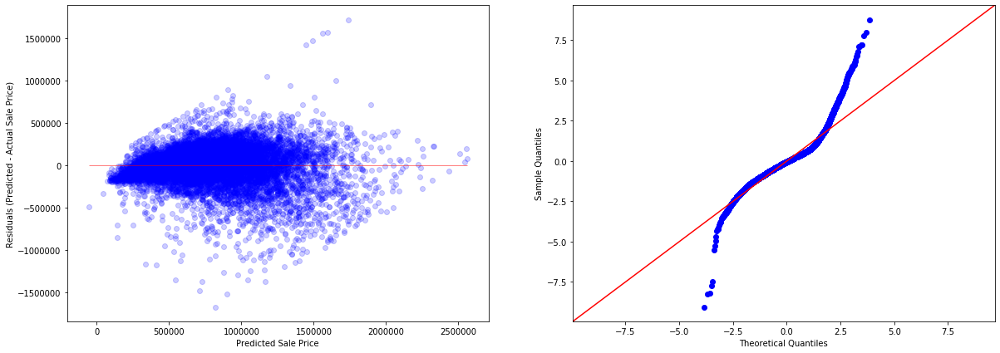

In [186]:
check_lr_assumptions(model_6_stepwise, df_6, outcome, predictors)

In [187]:
append_results('model_6_stepwise', formula, model_6_stepwise, df_6, outcome, predictors, 
               note=f'stepwise selection, rm outliers all continuous, {len(predictors)} predictors')

,Model,Formula,R-Squared,Rainbow statistic,Rainbow p-value,Linearity Assumption,Jarque-Bera statistic,Jarque-Bera p-value,Normality Assumption,Lagrange Multiplier p-value,F-statistic p-value,Homoskedasticity Assumption,Multicollinearity,Independence Assumption,Note
0,sm_1,SalePrice ~ SqFtTotLiving,0.386491,0.872905,1.000000e+00,Satisfied,1.305055e+07,0.000000e+00,Violated,NaN,3.931011e-82,Violated,N/A,N/A,"with outliers, no transform"
1,sm_2,SalePrice ~ SqFtTotLiving,0.399934,1.027984,9.517113e-02,Satisfied,8.752700e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers with z-score
2,sm_2_log,log_SalePrice ~ log_SqFtTotLiving,0.291863,1.352501,1.084791e-46,Violated,3.094762e+06,0.000000e+00,Violated,NaN,1.163439e-59,Violated,N/A,N/A,remove SalePrice outliers w/ z-scores then log...
3,sm_2_sqrt,sqrt_SalePrice ~ sqrt_SqFtTotLiving,0.379239,1.053338,6.839964e-03,Violated,1.509920e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt tr...
4,sm_2_sqrt_2,SalePrice ~ sqrt_SqFtTotLiving,0.375599,1.033779,5.747716e-02,Satisfied,8.842146e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt on...
5,sm_2_sqrt_3,sqrt_SalePrice ~ SqFtTotLiving,0.393446,1.050943,9.197660e-03,Violated,1.577432e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt on...
6,sm_3,SalePrice ~ SqFtTotLiving,0.308273,0.991329,6.565131e-01,Satisfied,1.038380e+03,3.300538e-226,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ IQR
7,model_2_sqrt,SalePrice ~ SqFtTotLiving + sqrt_SqFtOpenPorch,0.401072,1.026429,1.079098e-01,Satisfied,8.651622e+03,0.000000e+00,Violated,0.000000e+00,0.000000e+00,Violated,,Satisfied,remove outliers w/ z-score & get sqrt of open ...
8,model_2_sqrt_all,sqrt_SalePrice ~ sqrt_SqFtTotLiving + sqrt_SqF...,0.380722,1.051251,8.860869e-03,Violated,1.487554e+03,0.000000e+00,Violated,0.000000e+00,0.000000e+00,Violated,,Satisfied,remove saleprice outliers w/ z-score & get sqr...
9,model_2_cat,SalePrice ~ SqFtTotLiving + has_OpenPorch,0.400308,1.027403,9.979305e-02,Satisfied,8.742264e+03,0.000000e+00,Violated,0.000000e+00,0.000000e+00,Violated,,Satisfied,remove saleprice outliers w/ z-score & convert...


`model_6_stepwise` R-Squared is lower than `model_4_stepwise`. It's still violating all assumptions, but Rainbow p-value seems eo be going up a little bit from 2.295015e-07 to 5.948303e-06.

In [188]:
model_results.loc[14].Multicollinearity.split(', ')

['SqFtTotLiving',
 'BldgGrade_8Good',
 'Yrs_BeforeSold',
 'BldgGrade_7Average',
 'WaterSystem_WATERDISTRICT',
 'BathFullCount_1',
 'has_TotBasement_1',
 'has_FinBasement_1',
 'BathFullCount_2']

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  del sys.path[0]


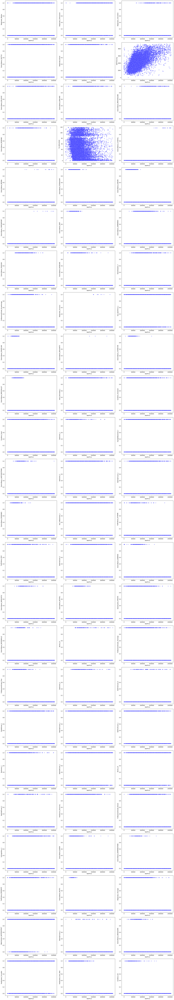

In [189]:
scatterplot_feats_outcome(df_6, predictors, 'SalePrice')

In [190]:
find_features('Stories', model_6_stepwise.params)

Stories_25    68626.328723
Stories_20   -20992.450359
dtype: float64

In [191]:
find_features('Garage', model_6_stepwise.params)

Series([], dtype: float64)

In [192]:
find_features('Bed', model_6_stepwise.params)

Bedrooms_1    146794.223263
Bedrooms_3     29186.475095
Bedrooms_6    -76345.835434
Bedrooms_2     30082.806847
dtype: float64

Would adjusting threshold_out in `.stepwise_selection()` help? But even the highest coefficient p-value in `model_6_stepwise` is only 0.008...

In [193]:
model_results

,Model,Formula,R-Squared,Rainbow statistic,Rainbow p-value,Linearity Assumption,Jarque-Bera statistic,Jarque-Bera p-value,Normality Assumption,Lagrange Multiplier p-value,F-statistic p-value,Homoskedasticity Assumption,Multicollinearity,Independence Assumption,Note
0,sm_1,SalePrice ~ SqFtTotLiving,0.386491,0.872905,1.000000e+00,Satisfied,1.305055e+07,0.000000e+00,Violated,NaN,3.931011e-82,Violated,N/A,N/A,"with outliers, no transform"
1,sm_2,SalePrice ~ SqFtTotLiving,0.399934,1.027984,9.517113e-02,Satisfied,8.752700e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers with z-score
2,sm_2_log,log_SalePrice ~ log_SqFtTotLiving,0.291863,1.352501,1.084791e-46,Violated,3.094762e+06,0.000000e+00,Violated,NaN,1.163439e-59,Violated,N/A,N/A,remove SalePrice outliers w/ z-scores then log...
3,sm_2_sqrt,sqrt_SalePrice ~ sqrt_SqFtTotLiving,0.379239,1.053338,6.839964e-03,Violated,1.509920e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt tr...
4,sm_2_sqrt_2,SalePrice ~ sqrt_SqFtTotLiving,0.375599,1.033779,5.747716e-02,Satisfied,8.842146e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt on...
5,sm_2_sqrt_3,sqrt_SalePrice ~ SqFtTotLiving,0.393446,1.050943,9.197660e-03,Violated,1.577432e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt on...
6,sm_3,SalePrice ~ SqFtTotLiving,0.308273,0.991329,6.565131e-01,Satisfied,1.038380e+03,3.300538e-226,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ IQR
7,model_2_sqrt,SalePrice ~ SqFtTotLiving + sqrt_SqFtOpenPorch,0.401072,1.026429,1.079098e-01,Satisfied,8.651622e+03,0.000000e+00,Violated,0.000000e+00,0.000000e+00,Violated,,Satisfied,remove outliers w/ z-score & get sqrt of open ...
8,model_2_sqrt_all,sqrt_SalePrice ~ sqrt_SqFtTotLiving + sqrt_SqF...,0.380722,1.051251,8.860869e-03,Violated,1.487554e+03,0.000000e+00,Violated,0.000000e+00,0.000000e+00,Violated,,Satisfied,remove saleprice outliers w/ z-score & get sqr...
9,model_2_cat,SalePrice ~ SqFtTotLiving + has_OpenPorch,0.400308,1.027403,9.979305e-02,Satisfied,8.742264e+03,0.000000e+00,Violated,0.000000e+00,0.000000e+00,Violated,,Satisfied,remove saleprice outliers w/ z-score & convert...


From referencing various sources, it seems like when the residuals don't meet heteroskedasticity assumption, that means my models are still missing variables. Aside from polynomial, I can only think of interaction. But I wonder how I can run the interaction combination selection without breaking my computer.

Experimenting with a different approach to feature selection using forward selection based on adjusted R-squared

In [194]:
def forward_selection(X, y, 
                      initial_list=[],  
                      verbose=True):
    """ 
    Perform a forward feature selection 
    based on Adjusted R-Squared from statsmodels.api.OLS
    Arguments:
        X - pandas.DataFrame with candidate features
        y - list-like with the target
        initial_list - list of features to start with (column names of X)
        verbose - whether to print the sequence of inclusions and exclusions
    Returns: list of selected features 
    
    """
    included = list(initial_list)
    excluded = list(set(X.columns) - set(included))
    best_adj_r2 = 0.0
    current_adj_r2 = 0.0
    while (len(excluded) > 0):
        increased = False
        col_adj_r2 = []
        for column in X.columns:
            model = sm.OLS(y, sm.add_constant(pd.DataFrame(X[included+[column]]))).fit()
            col_adj_r2.append((column, model.rsquared_adj))
            
        # sort temp_dct by values 
        col_adj_r2.sort(key=lambda x: x[1], reverse=True)
        best_col, best_adj_r2 = col_adj_r2[0]

        if current_adj_r2 < best_adj_r2:
            increased = True
            current_adj_r2 = best_adj_r2
            included.append(best_col)
            excluded = list(set(X.columns) - set(included))
            if verbose:
                print(f'Add: {best_col:30} Current Best Adjusted R2: {current_adj_r2:.6}')
            print(len(included), len(excluded))
        if not increased:
            break

    return included

In [195]:
predictors = forward_selection(X6, y6)

Add: SqFtTotLiving                  Current Best Adjusted R2: 0.359083
1 153
Add: DistrictName_SEATTLE           Current Best Adjusted R2: 0.467007
2 152
Add: DistrictName_BELLEVUE          Current Best Adjusted R2: 0.509578
3 151
Add: DistrictName_MERCERISLAND      Current Best Adjusted R2: 0.541273
4 150
Add: DistrictName_KIRKLAND          Current Best Adjusted R2: 0.570421
5 149
Add: BldgGrade_10VeryGood           Current Best Adjusted R2: 0.590293
6 148
Add: BldgGrade_9Better              Current Best Adjusted R2: 0.609454
7 147
Add: BldgGrade_11Excellent          Current Best Adjusted R2: 0.62621
8 146
Add: DistrictName_REDMOND           Current Best Adjusted R2: 0.6409
9 145
Add: DistrictName_CLYDEHILL         Current Best Adjusted R2: 0.650761
10 144
Add: DistrictName_MEDINA            Current Best Adjusted R2: 0.660172
11 143
Add: BldgGrade_8Good                Current Best Adjusted R2: 0.667064
12 142
Add: Yrs_BeforeSold                 Current Best Adjusted R2: 0.675654
13 14

Add: FinBasementGrade_4Low          Current Best Adjusted R2: 0.740261
107 47
Add: BathFullCount_2                Current Best Adjusted R2: 0.740269
108 46
Add: HeatSource_Oil_Solar           Current Best Adjusted R2: 0.740275
109 45
Add: HeatSource_Gas_Solar           Current Best Adjusted R2: 0.740279
110 44
Add: Stories_15                     Current Best Adjusted R2: 0.740282
111 43
Add: has_HalfFloor_1                Current Best Adjusted R2: 0.740764
112 42
Add: Stories_35                     Current Best Adjusted R2: 0.740912
113 41
Add: WaterProblems_Y                Current Best Adjusted R2: 0.740912
114 40
Add: HeatSystem_ElecBB              Current Best Adjusted R2: 0.740912
115 39


In [196]:
len(predictors)

115

In [197]:
outcome = 'SalePrice'
formula = create_formula(outcome, predictors)
model_6_forward = ols(formula=formula, data=df_6).fit()
model_6_forward.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.743
Model:                            OLS   Adj. R-squared:                  0.741
Method:                 Least Squares   F-statistic:                     439.5
Date:                Wed, 03 Mar 2021   Prob (F-statistic):               0.00
Time:                        20:04:02   Log-Likelihood:            -2.3927e+05
No. Observations:               17634   AIC:                         4.788e+05
Df Residuals:                   17518   BIC:                         4.797e+05
Df Model:                         115                                         
Covariance Type:            nonrobust                                         
================================================================================================
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
Intercept                     1.339e+06   1.97e+05      6.791      0.000    9.53e+05    1.73e+06
SqFtTotLiving                  180.1157      3.806     47.319      0.000     172.655     187.577
DistrictName_SEATTLE          3.726e+05   2.51e+04     14.825      0.000    3.23e+05    4.22e+05
DistrictName_BELLEVUE         4.788e+05   2.58e+04     18.523      0.000    4.28e+05    5.29e+05
DistrictName_MERCERISLAND     6.879e+05   2.87e+04     23.963      0.000    6.32e+05    7.44e+05
DistrictName_KIRKLAND         4.161e+05   2.58e+04     16.135      0.000    3.66e+05    4.67e+05
BldgGrade_10VeryGood         -6.635e+05   1.91e+05     -3.467      0.001   -1.04e+06   -2.88e+05
BldgGrade_9Better            -8.295e+05   1.91e+05     -4.337      0.000    -1.2e+06   -4.55e+05
BldgGrade_11Excellent        -4.993e+05   1.92e+05     -2.600      0.009   -8.76e+05   -1.23e+05
DistrictName_REDMOND          3.998e+05   2.67e+04     14.988      0.000    3.48e+05    4.52e+05
DistrictName_CLYDEHILL        1.277e+06   5.16e+04     24.740      0.000    1.18e+06    1.38e+06
DistrictName_MEDINA           1.318e+06   5.51e+04     23.920      0.000    1.21e+06    1.43e+06
BldgGrade_8Good              -9.696e+05   1.91e+05     -5.071      0.000   -1.34e+06   -5.95e+05
Yrs_BeforeSold                1034.7874     89.418     11.573      0.000     859.520    1210.055
DistrictName_FEDERALWAY      -6.241e+04   2.58e+04     -2.424      0.015   -1.13e+05   -1.19e+04
DistrictName_AUBURN          -5.531e+04    2.6e+04     -2.131      0.033   -1.06e+05   -4434.267
DistrictName_YARROWPOINT      1.406e+06   6.82e+04     20.629      0.000    1.27e+06    1.54e+06
DistrictName_KENT            -1.063e+04   2.57e+04     -0.414      0.679    -6.1e+04    3.97e+04
DistrictName_SAMMAMISH        2.509e+05   2.61e+04      9.615      0.000       2e+05    3.02e+05
DistrictName_ISSAQUAH         2.658e+05   2.74e+04      9.719      0.000    2.12e+05    3.19e+05
DistrictName_SHORELINE        2.368e+05   2.63e+04      9.004      0.000    1.85e+05    2.88e+05
ViewUtilization_Y             9.964e+04   1.05e+04      9.468      0.000     7.9e+04     1.2e+05
FinBasementGrade_6LowAverage -7.401e+04   7091.560    -10.437      0.000   -8.79e+04   -6.01e+04
BldgGrade_6LowAverage         -1.09e+06   1.91e+05     -5.702      0.000   -1.46e+06   -7.15e+05
BldgGrade_12Luxury           -5.772e+05   2.03e+05     -2.847      0.004   -9.75e+05    -1.8e+05
has_OpenPorch_1               2.952e+04   3233.931      9.127      0.000    2.32e+04    3.59e+04
DistrictName_ENUMCLAW        -3.669e+04    2.8e+04     -1.308      0.191   -9.17e+04    1.83e+04
DistrictName_BEAUXARTS        1.004e+06   1.13e+05      8.889      0.000    7.82e+05    1.23e+06
DistrictName_COVINGTON        6789.1177   2.74e+04      0.248      0.804   -

					Statistic 			P-value
(Linearity) Rainbow Test 		1.0955619107024388 		9.78864076789924e-06
(Normality) Jarque-Bera Test 		39166.20158032726 		0.0

					Lagrange Multiplier p-value 	F-statistic p-value
(Homoskedasticity) Breusch-Pagan test 	0.0 				0.0

Independence:
                       feature         VIF
0                SqFtTotLiving   34.436906
1         DistrictName_SEATTLE   91.617507
2        DistrictName_BELLEVUE   15.192251
3    DistrictName_MERCERISLAND    4.322268
4        DistrictName_KIRKLAND   13.946871
..                         ...         ...
110                 Stories_15  186.209277
111            has_HalfFloor_1  200.812183
112                 Stories_35    1.261397
113            WaterProblems_Y    1.018401
114          HeatSystem_ElecBB    3.416744

[115 rows x 2 columns]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


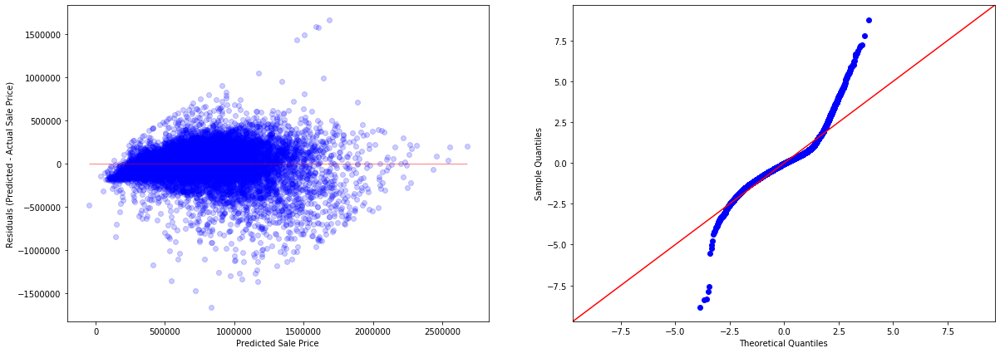

In [198]:
check_lr_assumptions(model_6_forward, df_6, outcome, predictors)

In [199]:
append_results('model_6_forward', formula, model_6_forward, df_6, outcome, predictors, 
               note=f'forward selection, rm outliers all continuous, {len(predictors)} predictors')

,Model,Formula,R-Squared,Rainbow statistic,Rainbow p-value,Linearity Assumption,Jarque-Bera statistic,Jarque-Bera p-value,Normality Assumption,Lagrange Multiplier p-value,F-statistic p-value,Homoskedasticity Assumption,Multicollinearity,Independence Assumption,Note
0,sm_1,SalePrice ~ SqFtTotLiving,0.386491,0.872905,1.000000e+00,Satisfied,1.305055e+07,0.000000e+00,Violated,NaN,3.931011e-82,Violated,N/A,N/A,"with outliers, no transform"
1,sm_2,SalePrice ~ SqFtTotLiving,0.399934,1.027984,9.517113e-02,Satisfied,8.752700e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers with z-score
2,sm_2_log,log_SalePrice ~ log_SqFtTotLiving,0.291863,1.352501,1.084791e-46,Violated,3.094762e+06,0.000000e+00,Violated,NaN,1.163439e-59,Violated,N/A,N/A,remove SalePrice outliers w/ z-scores then log...
3,sm_2_sqrt,sqrt_SalePrice ~ sqrt_SqFtTotLiving,0.379239,1.053338,6.839964e-03,Violated,1.509920e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt tr...
4,sm_2_sqrt_2,SalePrice ~ sqrt_SqFtTotLiving,0.375599,1.033779,5.747716e-02,Satisfied,8.842146e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt on...
5,sm_2_sqrt_3,sqrt_SalePrice ~ SqFtTotLiving,0.393446,1.050943,9.197660e-03,Violated,1.577432e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt on...
6,sm_3,SalePrice ~ SqFtTotLiving,0.308273,0.991329,6.565131e-01,Satisfied,1.038380e+03,3.300538e-226,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ IQR
7,model_2_sqrt,SalePrice ~ SqFtTotLiving + sqrt_SqFtOpenPorch,0.401072,1.026429,1.079098e-01,Satisfied,8.651622e+03,0.000000e+00,Violated,0.000000e+00,0.000000e+00,Violated,,Satisfied,remove outliers w/ z-score & get sqrt of open ...
8,model_2_sqrt_all,sqrt_SalePrice ~ sqrt_SqFtTotLiving + sqrt_SqF...,0.380722,1.051251,8.860869e-03,Violated,1.487554e+03,0.000000e+00,Violated,0.000000e+00,0.000000e+00,Violated,,Satisfied,remove saleprice outliers w/ z-score & get sqr...
9,model_2_cat,SalePrice ~ SqFtTotLiving + has_OpenPorch,0.400308,1.027403,9.979305e-02,Satisfied,8.742264e+03,0.000000e+00,Violated,0.000000e+00,0.000000e+00,Violated,,Satisfied,remove saleprice outliers w/ z-score & convert...


In [214]:
model_results.loc[16].Multicollinearity.split(', ')

['SqFtTotLiving',
 'DistrictName_SEATTLE',
 'DistrictName_BELLEVUE',
 'DistrictName_KIRKLAND',
 'BldgGrade_10VeryGood',
 'BldgGrade_9Better',
 'BldgGrade_11Excellent',
 'DistrictName_REDMOND',
 'BldgGrade_8Good',
 'Yrs_BeforeSold',
 'DistrictName_FEDERALWAY',
 'DistrictName_AUBURN',
 'DistrictName_KENT',
 'DistrictName_SAMMAMISH',
 'DistrictName_ISSAQUAH',
 'DistrictName_SHORELINE',
 'BldgGrade_6LowAverage',
 'DistrictName_COVINGTON',
 'DistrictName_MAPLEVALLEY',
 'Bedrooms_1',
 'Bedrooms_3',
 'DistrictName_DESMOINES',
 'has_TotBasement_1',
 'BathFullCount_3',
 'DistrictName_KENMORE',
 'Stories_25',
 'Bedrooms_6',
 'BathFullCount_1',
 'Bedrooms_2',
 'DistrictName_BURIEN',
 'BldgGrade_7Average',
 'WaterSystem_WATERDISTRICT',
 'HeatSystem_ForcedAir',
 'HeatSource_Gas',
 'Bedrooms_5',
 'Bedrooms_4',
 'BldgGrade_5Fair',
 'DistrictName_KINGCOUNTY',
 'DistrictName_RENTON',
 'BathFullCount_2',
 'Stories_15',
 'has_HalfFloor_1']

In [457]:
def identify_multicollinearity(feature, df, outcome):
    corr = df.corr()[feature].sort_values(ascending=False)
    # identify other features that are highly correlated to this feature, 
    # 0.5 threshold is arbitrary
    # which is also not the same as itself
    # and not target variable
    output = corr[(np.abs(corr) > 0.5)]
    return output

In [219]:
multicol = model_results.loc[16].Multicollinearity.split(', ')
for f in multicol:
    print(f)
    print(identify_multicollinearity(f, df_6, 'SalePrice'))

SqFtTotLiving
Series([], Name: SqFtTotLiving, dtype: float64)
DistrictName_SEATTLE
Series([], Name: DistrictName_SEATTLE, dtype: float64)
DistrictName_BELLEVUE
Series([], Name: DistrictName_BELLEVUE, dtype: float64)
DistrictName_KIRKLAND
Series([], Name: DistrictName_KIRKLAND, dtype: float64)
BldgGrade_10VeryGood
Series([], Name: BldgGrade_10VeryGood, dtype: float64)
BldgGrade_9Better
Series([], Name: BldgGrade_9Better, dtype: float64)
BldgGrade_11Excellent
Series([], Name: BldgGrade_11Excellent, dtype: float64)
DistrictName_REDMOND
Series([], Name: DistrictName_REDMOND, dtype: float64)
BldgGrade_8Good
Series([], Name: BldgGrade_8Good, dtype: float64)
Yrs_BeforeSold
Series([], Name: Yrs_BeforeSold, dtype: float64)
DistrictName_FEDERALWAY
Series([], Name: DistrictName_FEDERALWAY, dtype: float64)
DistrictName_AUBURN
Series([], Name: DistrictName_AUBURN, dtype: float64)
DistrictName_KENT
Series([], Name: DistrictName_KENT, dtype: float64)
DistrictName_SAMMAMISH
Series([], Name: DistrictNa

Now that I've updated the check_lr_assumptions() function to include qqplot, I realized that qqplot for outlier removal using IQR as well as square root transformation on `SalePrice` actually look pretty good.

Therefore, I'm going to combine those 2 into another dataset.

In [400]:
df_7 = remove_outliers_z(df_1, 'SalePrice').copy() 
df_7.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18015 entries, 0 to 821
Data columns (total 60 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   PIN                 18015 non-null  object        
 1   SalePrice           18015 non-null  int64         
 2   ExciseTaxNbr        18015 non-null  object        
 3   DocumentDate        18015 non-null  datetime64[ns]
 4   RecordingNbr        18015 non-null  object        
 5   PropertyType        18015 non-null  object        
 6   PropertyClass       18015 non-null  object        
 7   BldgNbr             18015 non-null  object        
 8   NbrLivingUnits      18015 non-null  int64         
 9   Address             18015 non-null  object        
 10  Stories             18015 non-null  float64       
 11  BldgGrade           18015 non-null  object        
 12  SqFt1stFloor        18015 non-null  int64         
 13  SqFtHalfFloor       18015 non-null  int64       

In [401]:
df_7['Yrs_BeforeSold'] = 2019 - df_7.YrBuilt
df_7['been_Renovated'] = df_7.YrRenovated.apply(convert_to_binary)
df_7['____Garage'] = df_7.SqFtGarageBasement + df_7.SqFtGarageAttached

In [402]:
to_bin_cols = ['____Garage', 'SqFtTotBasement', 'SqFtEnclosedPorch', 'SqFtDeck', 'SqFtOpenPorch']

for c in to_bin_cols:
    df_7[f'has_{c[4:]}'] = df_7[c].apply(convert_to_binary)

In [403]:
continuous3 = ['SalePrice', 'SqFtTotLiving', 'Yrs_BeforeSold']
df_7_cont = df_7[continuous3]

# reset index for df_3_cont for concatenating with df_3_cat later
df_7_cont.index = range(len(df_7_cont))

In [404]:
def divide_region(x):
    north = [x.upper() for x in ['Bothell', 'Cottage Lake', 'Kenmore', 'Lake Forest Park', 
                                 'Shoreline', 'Woodinville']]
    east = [x.upper() for x in ['Bellevue', 'Carnation', 'Duvall', 'Issaquah', 'Kirkland', 
                                'Medina', 'Mercer Island', 'Newcastle', 'North Bend', 
                                'Redmond', 'Sammamish', 'Skykomish', 'King County', 
                                'SNOQUALMIE', 'BEAUX ARTS', 'CLYDE HILL', 'YARROW POINT',
                                'HUNTS POINT']]

    south = [x.upper() for x in ['Auburn', 'Burien', 'Covington', 'Des Moines', 'Enumclaw', 
                                 'Federal Way', 'Kent', 'Maple Valley', 'Normandy Park', 
                                 'Renton', 'Tukwila', 'White Center', 'Boulevard Park', 
                                 'Vashon Island', 'Algona', 'Pacific', 'BLACK DIAMOND',
                                 'MILTON', '']] + ['SeaTac']
    seattle = ['SEATTLE']

    regions = [north, south, east, seattle]
    for region in regions:
        if x in north:
            output = 'North'
        elif x in east:
            output = 'East'
        elif x in south:
            output = 'South'
        elif x in seattle:
            output = 'Seattle'
    return output

In [405]:
df_7['Region'] = df_7.DistrictName.apply(divide_region)
region = df_7['Region']
region.index = range(len(region))

In [406]:
region.value_counts()

East       6459
Seattle    5325
South      5054
North      1177
Name: Region, dtype: int64

In [407]:
# Update the list of categorical features
categoricals3 = ['Stories', 'BldgGrade', 'DaylightBasement', 'HeatSystem', 
                 'HeatSource', 'ViewUtilization', 'FpSingleStory', 'FpMultiStory', 'FpFreestanding',
                 'FpAdditional', 'Condition', 'WaterSystem', 'SewerSystem', 'TrafficNoise',
                 'WaterProblems', 'been_Renovated', 'has_Garage', 'has_TotBasement', 
                 'has_OpenPorch', 'has_EnclosedPorch', 'has_Deck',
                 'Bedrooms', 'BathHalfCount', 'Bath3qtrCount', 'BathFullCount']

In [408]:
# Apply OneHotEncoder() on categorical predictors
ohe = OneHotEncoder(drop='first')
ohe.fit(df_7[categoricals3])
ohe_trans = ohe.transform(df_7[categoricals3])

# Passing 'categoricals3' into .get_feature_names() will include original feature names 
# in our OHE columns later
column_names = ohe.get_feature_names(categoricals3)

df_7_cat = pd.DataFrame(ohe_trans.todense(), columns=column_names)

In [409]:
# concatenate 'df_7_cont' and 'df_7_cat' to create df_7_final
df_7_final = pd.concat([df_7_cont, df_7_cat, region], axis=1)

In [410]:
df_7_final.columns = [x.replace(" ", '')
                       .replace('.', '')
                       .replace("-", "_")
                       .replace("/", "_") for x in df_7_final.columns]

In [411]:
df_7_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18015 entries, 0 to 18014
Columns: 104 entries, SalePrice to Region
dtypes: float64(100), int64(3), object(1)
memory usage: 14.3+ MB


In [440]:
df_7_north = df_7_final[df_7_final.Region == 'North'].drop('Region', axis=1)
df_7_south = df_7_final[df_7_final.Region == 'South'].drop('Region', axis=1)
df_7_east = df_7_final[df_7_final.Region == 'East'].drop('Region', axis=1)
df_7_seattle = df_7_final[df_7_final.Region == 'Seattle'].drop('Region', axis=1)

#### North

In [486]:
X7_north = df_7_north.drop('SalePrice', axis=1)
y7_north = df_7_north.SalePrice

In [487]:
predictors_north = stepwise_selection(X7_north, y7_north)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  SqFtTotLiving                  with p-value 2.54217e-212


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  BldgGrade_10VeryGood           with p-value 2.14495e-09


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  BldgGrade_9Better              with p-value 3.47399e-12


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  BldgGrade_11Excellent          with p-value 1.14046e-10


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  BldgGrade_8Good                with p-value 1.99986e-08


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  been_Renovated_1               with p-value 3.10108e-07


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  Condition_VeryGood             with p-value 1.20807e-07


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  has_EnclosedPorch_1            with p-value 6.64169e-05


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  TrafficNoise_MODERATE          with p-value 7.77832e-05


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  HeatSource_Oil                 with p-value 0.000250998


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  TrafficNoise_HIGH              with p-value 0.00288974


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

In [488]:
len(predictors_north)

11

In [489]:
outcome = 'SalePrice'
formula = create_formula(outcome, predictors_north)
model_7_north_stepwise = ols(formula=formula, data=df_7_north).fit()
model_7_north_stepwise.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.650
Model:                            OLS   Adj. R-squared:                  0.647
Method:                 Least Squares   F-statistic:                     196.8
Date:                Thu, 04 Mar 2021   Prob (F-statistic):          1.76e-256
Time:                        07:28:43   Log-Likelihood:                -15708.
No. Observations:                1177   AIC:                         3.144e+04
Df Residuals:                    1165   BIC:                         3.150e+04
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
Intercept              3.018e+05   1.46e+04     20.733      0.000    2.73e+05     3.3e+05
SqFtTotLiving           153.4632      7.530     20.380      0.000     138.689     168.238
BldgGrade_10VeryGood   3.623e+05   3.37e+04     10.751      0.000    2.96e+05    4.28e+05
BldgGrade_9Better      2.081e+05   1.85e+04     11.248      0.000    1.72e+05    2.44e+05
BldgGrade_11Excellent  5.296e+05   6.12e+04      8.650      0.000     4.1e+05     6.5e+05
BldgGrade_8Good        8.216e+04   1.15e+04      7.158      0.000    5.96e+04    1.05e+05
been_Renovated_1       1.312e+05   2.54e+04      5.165      0.000    8.13e+04    1.81e+05
Condition_VeryGood     7.725e+04   1.35e+04      5.717      0.000    5.07e+04    1.04e+05
has_EnclosedPorch_1    1.387e+05   3.39e+04      4.089      0.000    7.21e+04    2.05e+05
TrafficNoise_MODERATE -6.028e+04   1.36e+04     -4.420      0.000    -8.7e+04   -3.35e+04
HeatSource_Oil         5.216e+04   1.39e+04      3.746      0.000    2.48e+04    7.95e+04
TrafficNoise_HIGH     -6.566e+04    2.2e+04     -2.986      0.003   -1.09e+05   -2.25e+04
==============================================================================
Omnibus:                      467.281   Durbin-Watson:                   1.979
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             7493.777
Skew:                           1.396   Prob(JB):                         0.00
Kurtosis:                      15.042   Cond. No.                     3.21e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.21e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

					Statistic 			P-value
(Linearity) Rainbow Test 		1.5635886367577665 		4.060119012060247e-08
(Normality) Jarque-Bera Test 		7493.777277936144 		0.0

					Lagrange Multiplier p-value 	F-statistic p-value
(Homoskedasticity) Breusch-Pagan test 	7.081573980041613e-30 				1.2696707586949083e-31

Independence:
                  feature       VIF
0           SqFtTotLiving  3.907354
1    BldgGrade_10VeryGood  1.243461
2       BldgGrade_9Better  1.667804
3   BldgGrade_11Excellent  1.074820
4         BldgGrade_8Good  2.210395
5        been_Renovated_1  1.085850
6      Condition_VeryGood  1.162624
7     has_EnclosedPorch_1  1.044445
8   TrafficNoise_MODERATE  1.122916
9          HeatSource_Oil  1.128736
10      TrafficNoise_HIGH  1.046594


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


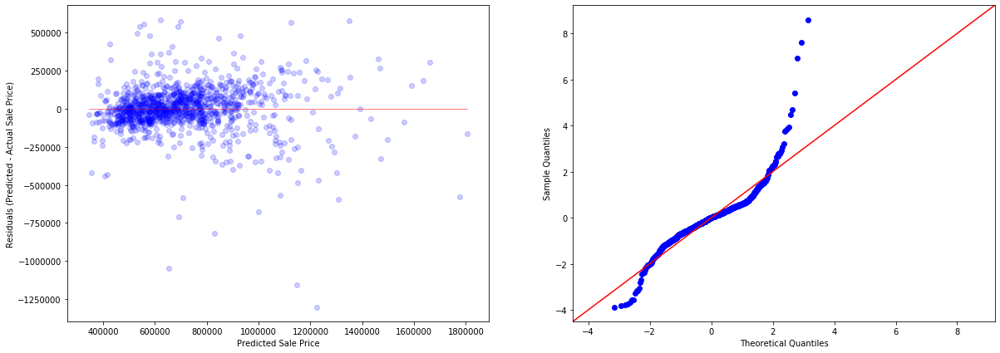

In [491]:
check_lr_assumptions(model_7_north_stepwise, df_7_north, outcome, predictors_north)

In [492]:
append_results('model_7_north_stepwise', formula, model_7_north_stepwise, df_7_north, outcome, predictors_north, 
               note=f'stepwise selection in north region, {len(predictors_north)} predictors')

,Model,Formula,R-Squared,Rainbow statistic,Rainbow p-value,Linearity Assumption,Jarque-Bera statistic,Jarque-Bera p-value,Normality Assumption,Lagrange Multiplier p-value,F-statistic p-value,Homoskedasticity Assumption,Multicollinearity,Independence Assumption,Note
0,sm_1,SalePrice ~ SqFtTotLiving,0.386491,0.872905,1.000000e+00,Satisfied,1.305055e+07,0.000000e+00,Violated,NaN,3.931011e-82,Violated,N/A,N/A,"with outliers, no transform"
1,sm_2,SalePrice ~ SqFtTotLiving,0.399934,1.027984,9.517113e-02,Satisfied,8.752700e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers with z-score
2,sm_2_log,log_SalePrice ~ log_SqFtTotLiving,0.291863,1.352501,1.084791e-46,Violated,3.094762e+06,0.000000e+00,Violated,NaN,1.163439e-59,Violated,N/A,N/A,remove SalePrice outliers w/ z-scores then log...
3,sm_2_sqrt,sqrt_SalePrice ~ sqrt_SqFtTotLiving,0.379239,1.053338,6.839964e-03,Violated,1.509920e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt tr...
4,sm_2_sqrt_2,SalePrice ~ sqrt_SqFtTotLiving,0.375599,1.033779,5.747716e-02,Satisfied,8.842146e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt on...
5,sm_2_sqrt_3,sqrt_SalePrice ~ SqFtTotLiving,0.393446,1.050943,9.197660e-03,Violated,1.577432e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt on...
6,sm_3,SalePrice ~ SqFtTotLiving,0.308273,0.991329,6.565131e-01,Satisfied,1.038380e+03,3.300538e-226,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ IQR
7,model_2_sqrt,SalePrice ~ SqFtTotLiving + sqrt_SqFtOpenPorch,0.401072,1.026429,1.079098e-01,Satisfied,8.651622e+03,0.000000e+00,Violated,0.000000e+00,0.000000e+00,Violated,,Satisfied,remove outliers w/ z-score & get sqrt of open ...
8,model_2_sqrt_all,sqrt_SalePrice ~ sqrt_SqFtTotLiving + sqrt_SqF...,0.380722,1.051251,8.860869e-03,Violated,1.487554e+03,0.000000e+00,Violated,0.000000e+00,0.000000e+00,Violated,,Satisfied,remove saleprice outliers w/ z-score & get sqr...
9,model_2_cat,SalePrice ~ SqFtTotLiving + has_OpenPorch,0.400308,1.027403,9.979305e-02,Satisfied,8.742264e+03,0.000000e+00,Violated,0.000000e+00,0.000000e+00,Violated,,Satisfied,remove saleprice outliers w/ z-score & convert...


In [493]:
find_features('Grade', model_7_north_stepwise.params)

BldgGrade_10VeryGood     362328.130749
BldgGrade_9Better        208055.561190
BldgGrade_11Excellent    529635.931261
BldgGrade_8Good           82155.893172
dtype: float64

In [495]:
find_features('Bath', model_7_north_stepwise.params)

Series([], dtype: float64)

In [476]:
find_features('Renovated', model_7_north_stepwise.params)

been_Renovated_1    131178.994186
dtype: float64

In [477]:
find_features('Heat', model_7_north_stepwise.params)

HeatSource_Oil    52164.369115
dtype: float64

#### South

In [496]:
X7_south = df_7_south.drop('SalePrice', axis=1)
y7_south = df_7_south.SalePrice

In [497]:
predictors_south = stepwise_selection(X7_south, y7_south)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  SqFtTotLiving                  with p-value 0.0


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  BldgGrade_11Excellent          with p-value 3.58286e-40


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  BldgGrade_10VeryGood           with p-value 1.25006e-32


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  BldgGrade_9Better              with p-value 1.80443e-38


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  HeatSystem_HeatPump            with p-value 5.27911e-27


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  been_Renovated_1               with p-value 1.30855e-18


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  BldgGrade_8Good                with p-value 5.79254e-20


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  BldgGrade_12Luxury             with p-value 6.63361e-16


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  HeatSource_Oil                 with p-value 1.18907e-11


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  Bath3qtrCount_4                with p-value 4.43615e-08


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  FpSingleStory_5                with p-value 4.43615e-08


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  Bath3qtrCount_2                with p-value 6.60728e-08


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  Bedrooms_1                     with p-value 2.80203e-07


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  Stories_30                     with p-value 5.25879e-07


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  ViewUtilization_N              with p-value 5.2943e-07


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  BldgGrade_7Average             with p-value 1.59426e-06


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  FpMultiStory_1                 with p-value 7.27569e-05


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  DaylightBasement_N             with p-value 0.000625202


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  HeatSystem_HotWater            with p-value 0.00148079


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  BldgGrade_4Low                 with p-value 0.00159487


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  Condition_VeryGood             with p-value 0.00168391


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  has_OpenPorch_1                with p-value 0.00175294


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  Condition_Good                 with p-value 0.00102533


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  HeatSource_Electricity         with p-value 0.00618262


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  has_Deck_1                     with p-value 0.0039539


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/an

Add  Bedrooms_6                     with p-value 0.00857584


/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  SewerSystem_PUBLIC             with p-value 0.00980455


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  Condition_Fair                 with p-value 0.00834127


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  Condition_Poor                 with p-value 0.00822287


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

In [498]:
len(predictors_south)

29

In [499]:
outcome = 'SalePrice'
formula = create_formula(outcome, predictors_south)
model_7_south_stepwise = ols(formula=formula, data=df_7_south).fit()
model_7_south_stepwise.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.566
Model:                            OLS   Adj. R-squared:                  0.563
Method:                 Least Squares   F-statistic:                     233.8
Date:                Thu, 04 Mar 2021   Prob (F-statistic):               0.00
Time:                        07:30:42   Log-Likelihood:                -66111.
No. Observations:                5054   AIC:                         1.323e+05
Df Residuals:                    5025   BIC:                         1.325e+05
Df Model:                          28                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
Intercept               2.185e+05   8762.546     24.940      0.000    2.01e+05    2.36e+05
SqFtTotLiving             90.6437      3.428     26.443      0.000      83.924      97.364
BldgGrade_11Excellent   5.817e+05   3.11e+04     18.701      0.000    5.21e+05    6.43e+05
BldgGrade_10VeryGood    2.878e+05   1.56e+04     18.423      0.000    2.57e+05    3.18e+05
BldgGrade_9Better       1.581e+05   9529.302     16.591      0.000    1.39e+05    1.77e+05
HeatSystem_HeatPump     7.303e+04   6744.563     10.829      0.000    5.98e+04    8.63e+04
been_Renovated_1        8.734e+04   9407.907      9.284      0.000    6.89e+04    1.06e+05
BldgGrade_8Good         7.492e+04   6928.681     10.813      0.000    6.13e+04    8.85e+04
BldgGrade_12Luxury      7.382e+05    8.6e+04      8.584      0.000     5.7e+05    9.07e+05
HeatSource_Oil          4.247e+04   6800.614      6.244      0.000    2.91e+04    5.58e+04
Bath3qtrCount_4         3.905e+05   6.01e+04      6.503      0.000    2.73e+05    5.08e+05
FpSingleStory_5         3.905e+05   6.01e+04      6.503      0.000    2.73e+05    5.08e+05
Bath3qtrCount_2         4.234e+04   8176.192      5.179      0.000    2.63e+04    5.84e+04
Bedrooms_1              1.399e+05   2.05e+04      6.830      0.000    9.98e+04     1.8e+05
Stories_30              2.492e+05   4.78e+04      5.211      0.000    1.55e+05    3.43e+05
ViewUtilization_N       2.656e+04   4329.448      6.135      0.000    1.81e+04     3.5e+04
BldgGrade_7Average      2.593e+04   5530.226      4.690      0.000    1.51e+04    3.68e+04
FpMultiStory_1         -2.166e+04   4350.640     -4.979      0.000   -3.02e+04   -1.31e+04
DaylightBasement_N     -1.592e+04   4516.386     -3.525      0.000   -2.48e+04   -7066.122
HeatSystem_HotWater     5.434e+04   1.84e+04      2.947      0.003    1.82e+04    9.05e+04
BldgGrade_4Low         -1.629e+05    5.6e+04     -2.911      0.004   -2.73e+05   -5.32e+04
Condition_VeryGood      2.137e+04   5666.323      3.771      0.000    1.03e+04    3.25e+04
has_OpenPorch_1         1.354e+04   3641.918      3.718      0.000    6402.289    2.07e+04
Condition_Good          1.088e+04   3924.768      2.773      0.006    3189.012    1.86e+04
HeatSource_Electricity -1.521e+04   4848.903     -3.136      0.002   -2.47e+04   -5699.666
has_Deck_1              1.059e+04   3713.806      2.852      0.004    3312.876    1.79e+04
Bedrooms_6             -4.567e+04   1.72e+04     -2.648      0.008   -7.95e+04   -1.19e+04
SewerSystem_PUBLIC     -1.457e+04   5266.031     -2.766      0.006   -2.49e+04   -4242.829
Condition_Fair         -6.341e+04   2.37e+04     -2.678      0.007    -1.1e+05    -1.7e+04
Condition_Poor         -1.171e+05   4.43e+04     -2.644      0.008   -2.04e+05   -3.03e+04
==============================================================================
O

					Statistic 			P-value
(Linearity) Rainbow Test 		1.3077734930278266 		9.484263426035678e-12
(Normality) Jarque-Bera Test 		270165.7440786143 		0.0

					Lagrange Multiplier p-value 	F-statistic p-value
(Homoskedasticity) Breusch-Pagan test 	5.050423100067088e-82 				1.5387951041987318e-86


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/stats/outliers_influence.py:185: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)



Independence:
                   feature        VIF
0            SqFtTotLiving  15.120776
1    BldgGrade_11Excellent   1.139616
2     BldgGrade_10VeryGood   1.615937
3        BldgGrade_9Better   2.713341
4      HeatSystem_HeatPump   1.155580
5         been_Renovated_1   1.066215
6          BldgGrade_8Good   4.827045
7       BldgGrade_12Luxury   1.081247
8           HeatSource_Oil   1.134611
9          Bath3qtrCount_4        inf
10         FpSingleStory_5        inf
11         Bath3qtrCount_2   1.148616
12              Bedrooms_1   1.183041
13              Stories_30   1.012327
14       ViewUtilization_N   3.633014
15      BldgGrade_7Average   4.880989
16          FpMultiStory_1   1.630738
17      DaylightBasement_N   3.612238
18     HeatSystem_HotWater   1.049978
19          BldgGrade_4Low   1.155600
20      Condition_VeryGood   1.245515
21         has_OpenPorch_1   2.452108
22          Condition_Good   1.594494
23  HeatSource_Electricity   1.280637
24              has_Deck_1   2.0158

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


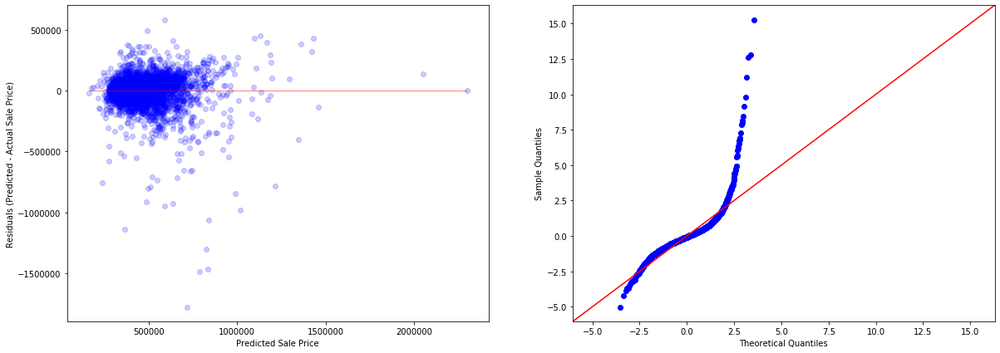

In [500]:
check_lr_assumptions(model_7_south_stepwise, df_7_south, outcome, predictors_south)

In [501]:
append_results('model_7_south_stepwise', formula, model_7_south_stepwise, df_7_south, outcome, predictors_south, 
               note=f'stepwise selection in south region, {len(predictors_south)} predictors')

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/stats/outliers_influence.py:185: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


,Model,Formula,R-Squared,Rainbow statistic,Rainbow p-value,Linearity Assumption,Jarque-Bera statistic,Jarque-Bera p-value,Normality Assumption,Lagrange Multiplier p-value,F-statistic p-value,Homoskedasticity Assumption,Multicollinearity,Independence Assumption,Note
0,sm_1,SalePrice ~ SqFtTotLiving,0.386491,0.872905,1.000000e+00,Satisfied,1.305055e+07,0.000000e+00,Violated,NaN,3.931011e-82,Violated,N/A,N/A,"with outliers, no transform"
1,sm_2,SalePrice ~ SqFtTotLiving,0.399934,1.027984,9.517113e-02,Satisfied,8.752700e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers with z-score
2,sm_2_log,log_SalePrice ~ log_SqFtTotLiving,0.291863,1.352501,1.084791e-46,Violated,3.094762e+06,0.000000e+00,Violated,NaN,1.163439e-59,Violated,N/A,N/A,remove SalePrice outliers w/ z-scores then log...
3,sm_2_sqrt,sqrt_SalePrice ~ sqrt_SqFtTotLiving,0.379239,1.053338,6.839964e-03,Violated,1.509920e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt tr...
4,sm_2_sqrt_2,SalePrice ~ sqrt_SqFtTotLiving,0.375599,1.033779,5.747716e-02,Satisfied,8.842146e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt on...
5,sm_2_sqrt_3,sqrt_SalePrice ~ SqFtTotLiving,0.393446,1.050943,9.197660e-03,Violated,1.577432e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt on...
6,sm_3,SalePrice ~ SqFtTotLiving,0.308273,0.991329,6.565131e-01,Satisfied,1.038380e+03,3.300538e-226,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ IQR
7,model_2_sqrt,SalePrice ~ SqFtTotLiving + sqrt_SqFtOpenPorch,0.401072,1.026429,1.079098e-01,Satisfied,8.651622e+03,0.000000e+00,Violated,0.000000e+00,0.000000e+00,Violated,,Satisfied,remove outliers w/ z-score & get sqrt of open ...
8,model_2_sqrt_all,sqrt_SalePrice ~ sqrt_SqFtTotLiving + sqrt_SqF...,0.380722,1.051251,8.860869e-03,Violated,1.487554e+03,0.000000e+00,Violated,0.000000e+00,0.000000e+00,Violated,,Satisfied,remove saleprice outliers w/ z-score & get sqr...
9,model_2_cat,SalePrice ~ SqFtTotLiving + has_OpenPorch,0.400308,1.027403,9.979305e-02,Satisfied,8.742264e+03,0.000000e+00,Violated,0.000000e+00,0.000000e+00,Violated,,Satisfied,remove saleprice outliers w/ z-score & convert...


#### East

In [502]:
X7_east = df_7_east.drop('SalePrice', axis=1)
y7_east = df_7_east.SalePrice

In [503]:
predictors_east = stepwise_selection(X7_east, y7_east)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  SqFtTotLiving                  with p-value 0.0


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  SewerSystem_PRIVATE            with p-value 2.26998e-99


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  BldgGrade_10VeryGood           with p-value 1.07128e-55


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  BldgGrade_11Excellent          with p-value 2.04895e-43


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  BldgGrade_9Better              with p-value 3.69361e-50


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  BldgGrade_12Luxury             with p-value 2.33005e-33


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  been_Renovated_1               with p-value 7.91781e-32


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  BldgGrade_8Good                with p-value 7.40237e-22


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  Stories_20                     with p-value 1.3393e-27


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  Bath3qtrCount_2                with p-value 4.64228e-11


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  Yrs_BeforeSold                 with p-value 4.9764e-11


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  Bath3qtrCount_1                with p-value 3.04515e-08


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  BldgGrade_6LowAverage          with p-value 1.24032e-06


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  has_Garage_1                   with p-value 3.0073e-09


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  FpMultiStory_4                 with p-value 2.42529e-06


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  Bedrooms_4                     with p-value 1.46862e-06


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  BathFullCount_3                with p-value 4.86505e-05


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  BathFullCount_4                with p-value 9.29215e-05


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  Condition_VeryGood             with p-value 0.000103795


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  Condition_Good                 with p-value 9.45954e-08


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  HeatSystem_HotWater            with p-value 5.41949e-05


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  ViewUtilization_N              with p-value 0.000193305


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  Bedrooms_2                     with p-value 0.000187638


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  HeatSource_Electricity         with p-value 0.000190924


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  HeatSystem_ForcedAir           with p-value 0.000908081


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  has_OpenPorch_1                with p-value 0.00164308


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  BathHalfCount_1                with p-value 0.00179814


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  BathFullCount_1                with p-value 0.00158081


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  Stories_15                     with p-value 0.00267619


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  DaylightBasement_Y             with p-value 0.000702851


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  FpAdditional_2                 with p-value 0.00259015


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  TrafficNoise_HIGH              with p-value 0.00436413


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

In [504]:
len(predictors_east)

32

In [505]:
outcome = 'SalePrice'
formula = create_formula(outcome, predictors_east)
model_7_east_stepwise = ols(formula=formula, data=df_7_east).fit()
model_7_east_stepwise.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.632
Model:                            OLS   Adj. R-squared:                  0.630
Method:                 Least Squares   F-statistic:                     344.7
Date:                Thu, 04 Mar 2021   Prob (F-statistic):               0.00
Time:                        07:35:28   Log-Likelihood:                -89856.
No. Observations:                6459   AIC:                         1.798e+05
Df Residuals:                    6426   BIC:                         1.800e+05
Df Model:                          32                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
Intercept               3.608e+05   2.31e+04     15.641      0.000    3.16e+05    4.06e+05
SqFtTotLiving            172.1735      6.718     25.629      0.000     159.004     185.343
SewerSystem_PRIVATE    -1.812e+05   7975.421    -22.722      0.000   -1.97e+05   -1.66e+05
BldgGrade_10VeryGood    5.161e+05   1.66e+04     31.054      0.000    4.84e+05    5.49e+05
BldgGrade_11Excellent   6.301e+05   2.54e+04     24.831      0.000     5.8e+05     6.8e+05
BldgGrade_9Better       3.127e+05    1.3e+04     23.966      0.000    2.87e+05    3.38e+05
BldgGrade_12Luxury        7.4e+05   4.58e+04     16.158      0.000     6.5e+05     8.3e+05
been_Renovated_1        1.868e+05    1.9e+04      9.839      0.000     1.5e+05    2.24e+05
BldgGrade_8Good         1.143e+05   9621.416     11.879      0.000    9.54e+04    1.33e+05
Stories_20             -6.993e+04   1.03e+04     -6.780      0.000   -9.02e+04   -4.97e+04
Bath3qtrCount_2         1.596e+05    1.6e+04      9.949      0.000    1.28e+05    1.91e+05
Yrs_BeforeSold          1319.0628    257.219      5.128      0.000     814.829    1823.297
Bath3qtrCount_1         7.051e+04   8957.162      7.872      0.000     5.3e+04    8.81e+04
BldgGrade_6LowAverage  -9.524e+04   1.74e+04     -5.471      0.000   -1.29e+05   -6.11e+04
has_Garage_1           -5.569e+04   1.04e+04     -5.374      0.000    -7.6e+04   -3.54e+04
FpMultiStory_4         -1.308e+06   2.73e+05     -4.798      0.000   -1.84e+06   -7.74e+05
Bedrooms_4             -2.979e+04   7292.589     -4.084      0.000   -4.41e+04   -1.55e+04
BathFullCount_3         7.185e+04   1.33e+04      5.410      0.000    4.58e+04    9.79e+04
BathFullCount_4         1.432e+05    3.2e+04      4.471      0.000    8.04e+04    2.06e+05
Condition_VeryGood      7.426e+04   1.26e+04      5.878      0.000    4.95e+04     9.9e+04
Condition_Good          5.283e+04   8668.623      6.094      0.000    3.58e+04    6.98e+04
HeatSystem_HotWater     1.365e+05   4.54e+04      3.006      0.003    4.75e+04    2.26e+05
ViewUtilization_N       -2.73e+04   6849.223     -3.986      0.000   -4.07e+04   -1.39e+04
Bedrooms_2              5.645e+04   1.54e+04      3.674      0.000    2.63e+04    8.66e+04
HeatSource_Electricity -5.367e+04    1.2e+04     -4.489      0.000   -7.71e+04   -3.02e+04
HeatSystem_ForcedAir   -3.534e+04   1.11e+04     -3.170      0.002   -5.72e+04   -1.35e+04
has_OpenPorch_1         2.139e+04   7732.950      2.766      0.006    6226.595    3.65e+04
BathHalfCount_1         3.581e+04   8523.203      4.201      0.000    1.91e+04    5.25e+04
BathFullCount_1        -3.771e+04   1.03e+04     -3.656      0.000   -5.79e+04   -1.75e+04
Stories_15              -6.03e+04    1.7e+04     -3.539      0.000   -9.37e+04   -2.69e+04
DaylightBasement_Y     -3.162e+04   8902.947     -3.552      0.000   -4.91e+04  

					Statistic 			P-value
(Linearity) Rainbow Test 		1.0569045609933208 		0.05842073679468683
(Normality) Jarque-Bera Test 		5632.083069838399 		0.0

					Lagrange Multiplier p-value 	F-statistic p-value
(Homoskedasticity) Breusch-Pagan test 	5.848050168438021e-259 				7.877493105450267e-291

Independence:
                   feature        VIF
0            SqFtTotLiving  22.540381
1      SewerSystem_PRIVATE   1.681770
2     BldgGrade_10VeryGood   2.439807
3    BldgGrade_11Excellent   1.678200
4        BldgGrade_9Better   2.923667
5       BldgGrade_12Luxury   1.209288
6         been_Renovated_1   1.248478
7          BldgGrade_8Good   2.632024
8               Stories_20   4.535242
9          Bath3qtrCount_2   1.830208
10          Yrs_BeforeSold   7.877369
11         Bath3qtrCount_1   2.879134
12   BldgGrade_6LowAverage   1.401264
13            has_Garage_1   6.572442
14          FpMultiStory_4   1.037382
15              Bedrooms_4   2.007500
16         BathFullCount_3   1.498082
17      

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


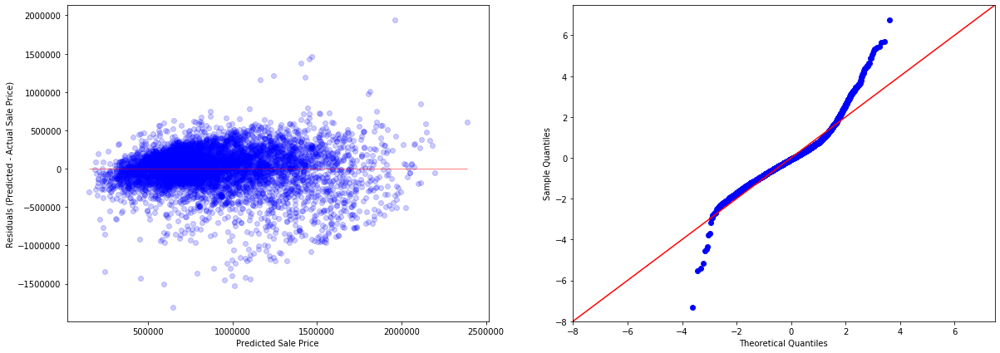

In [506]:
check_lr_assumptions(model_7_east_stepwise, df_7_east, outcome, predictors_east)

In [507]:
append_results('model_7_east_stepwise', formula, model_7_east_stepwise, df_7_east, outcome, predictors_east, 
               note=f'stepwise selection in east region, {len(predictors_east)} predictors')

,Model,Formula,R-Squared,Rainbow statistic,Rainbow p-value,Linearity Assumption,Jarque-Bera statistic,Jarque-Bera p-value,Normality Assumption,Lagrange Multiplier p-value,F-statistic p-value,Homoskedasticity Assumption,Multicollinearity,Independence Assumption,Note
0,sm_1,SalePrice ~ SqFtTotLiving,0.386491,0.872905,1.000000e+00,Satisfied,1.305055e+07,0.000000e+00,Violated,NaN,3.931011e-82,Violated,N/A,N/A,"with outliers, no transform"
1,sm_2,SalePrice ~ SqFtTotLiving,0.399934,1.027984,9.517113e-02,Satisfied,8.752700e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers with z-score
2,sm_2_log,log_SalePrice ~ log_SqFtTotLiving,0.291863,1.352501,1.084791e-46,Violated,3.094762e+06,0.000000e+00,Violated,NaN,1.163439e-59,Violated,N/A,N/A,remove SalePrice outliers w/ z-scores then log...
3,sm_2_sqrt,sqrt_SalePrice ~ sqrt_SqFtTotLiving,0.379239,1.053338,6.839964e-03,Violated,1.509920e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt tr...
4,sm_2_sqrt_2,SalePrice ~ sqrt_SqFtTotLiving,0.375599,1.033779,5.747716e-02,Satisfied,8.842146e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt on...
5,sm_2_sqrt_3,sqrt_SalePrice ~ SqFtTotLiving,0.393446,1.050943,9.197660e-03,Violated,1.577432e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt on...
6,sm_3,SalePrice ~ SqFtTotLiving,0.308273,0.991329,6.565131e-01,Satisfied,1.038380e+03,3.300538e-226,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ IQR
7,model_2_sqrt,SalePrice ~ SqFtTotLiving + sqrt_SqFtOpenPorch,0.401072,1.026429,1.079098e-01,Satisfied,8.651622e+03,0.000000e+00,Violated,0.000000e+00,0.000000e+00,Violated,,Satisfied,remove outliers w/ z-score & get sqrt of open ...
8,model_2_sqrt_all,sqrt_SalePrice ~ sqrt_SqFtTotLiving + sqrt_SqF...,0.380722,1.051251,8.860869e-03,Violated,1.487554e+03,0.000000e+00,Violated,0.000000e+00,0.000000e+00,Violated,,Satisfied,remove saleprice outliers w/ z-score & get sqr...
9,model_2_cat,SalePrice ~ SqFtTotLiving + has_OpenPorch,0.400308,1.027403,9.979305e-02,Satisfied,8.742264e+03,0.000000e+00,Violated,0.000000e+00,0.000000e+00,Violated,,Satisfied,remove saleprice outliers w/ z-score & convert...


#### Seattle

In [508]:
X7_seattle = df_7_seattle.drop('SalePrice', axis=1)
y7_seattle = df_7_seattle.SalePrice

In [509]:
predictors_seattle = stepwise_selection(X7_seattle, y7_seattle)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.


Add  SqFtTotLiving                  with p-value 0.0


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  BldgGrade_9Better              with p-value 1.76454e-74


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  BldgGrade_10VeryGood           with p-value 2.07029e-102


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  Yrs_BeforeSold                 with p-value 1.21748e-44


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  BldgGrade_8Good                with p-value 1.01021e-94


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  BldgGrade_11Excellent          with p-value 3.34613e-58


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  BldgGrade_6LowAverage          with p-value 3.51262e-20


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  FpAdditional_1                 with p-value 6.82491e-10


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  Bedrooms_1                     with p-value 4.56867e-10


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  BldgGrade_12Luxury             with p-value 2.47206e-09


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  Condition_VeryGood             with p-value 1.44607e-06


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  Condition_Good                 with p-value 3.58274e-07


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  DaylightBasement_Y             with p-value 1.69226e-06


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  FpMultiStory_1                 with p-value 1.72795e-06


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  has_OpenPorch_1                with p-value 3.11515e-05


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  TrafficNoise_HIGH              with p-value 4.80935e-05


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  BldgGrade_7Average             with p-value 6.13741e-05
Drop BldgGrade_6LowAverage          with p-value 0.370297


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  BathFullCount_5                with p-value 0.000121604


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  Bedrooms_6                     with p-value 3.60346e-05


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  Bedrooms_9                     with p-value 0.00023478


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  has_Deck_1                     with p-value 0.000355304


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  BathFullCount_3                with p-value 0.000537688


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  Stories_25                     with p-value 0.000633215


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  has_EnclosedPorch_1            with p-value 0.00110109


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  HeatSystem_HeatPump            with p-value 0.00226938


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  HeatSource_Electricity         with p-value 6.96015e-06


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.


Add  BathHalfCount_2                with p-value 0.00218793


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaco

Add  Stories_20                     with p-value 0.00431207


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

Add  TrafficNoise_EXTREME           with p-value 0.00795447


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


In [510]:
len(predictors_seattle)

28

In [511]:
outcome = 'SalePrice'
formula = create_formula(outcome, predictors_seattle)
model_7_seattle_stepwise = ols(formula=formula, data=df_7_seattle).fit()
model_7_seattle_stepwise.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.684
Model:                            OLS   Adj. R-squared:                  0.682
Method:                 Least Squares   F-statistic:                     409.2
Date:                Thu, 04 Mar 2021   Prob (F-statistic):               0.00
Time:                        07:38:23   Log-Likelihood:                -72753.
No. Observations:                5325   AIC:                         1.456e+05
Df Residuals:                    5296   BIC:                         1.458e+05
Df Model:                          28                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
Intercept               9.999e+04   1.36e+04      7.349      0.000    7.33e+04    1.27e+05
SqFtTotLiving            214.8742      5.736     37.458      0.000     203.629     226.120
BldgGrade_9Better       4.964e+05   1.57e+04     31.602      0.000    4.66e+05    5.27e+05
BldgGrade_10VeryGood    7.799e+05   2.39e+04     32.574      0.000    7.33e+05    8.27e+05
Yrs_BeforeSold          2139.4690    113.710     18.815      0.000    1916.551    2362.387
BldgGrade_8Good         2.509e+05   1.21e+04     20.767      0.000    2.27e+05    2.75e+05
BldgGrade_11Excellent    1.01e+06   5.63e+04     17.944      0.000       9e+05    1.12e+06
FpAdditional_1         -6.583e+04   1.12e+04     -5.904      0.000   -8.77e+04    -4.4e+04
Bedrooms_1              1.563e+05   2.15e+04      7.263      0.000    1.14e+05    1.99e+05
BldgGrade_12Luxury      1.324e+06   2.09e+05      6.319      0.000    9.13e+05    1.73e+06
Condition_VeryGood      6.392e+04   1.01e+04      6.301      0.000     4.4e+04    8.38e+04
Condition_Good          3.832e+04   7754.356      4.942      0.000    2.31e+04    5.35e+04
DaylightBasement_Y      -3.79e+04   7052.698     -5.373      0.000   -5.17e+04   -2.41e+04
FpMultiStory_1          4.391e+04   9194.935      4.775      0.000    2.59e+04    6.19e+04
has_OpenPorch_1         2.451e+04   6243.136      3.926      0.000    1.23e+04    3.67e+04
TrafficNoise_HIGH      -4.453e+04   1.05e+04     -4.242      0.000   -6.51e+04   -2.39e+04
BldgGrade_7Average      9.153e+04   9880.732      9.264      0.000    7.22e+04    1.11e+05
BathFullCount_5         9.648e+05    2.1e+05      4.586      0.000    5.52e+05    1.38e+06
Bedrooms_6             -1.153e+05   2.74e+04     -4.202      0.000   -1.69e+05   -6.15e+04
Bedrooms_9             -6.831e+05    2.1e+05     -3.259      0.001   -1.09e+06   -2.72e+05
has_Deck_1              2.177e+04   6187.470      3.519      0.000    9642.945    3.39e+04
BathFullCount_3         4.424e+04   1.24e+04      3.554      0.000    1.98e+04    6.86e+04
Stories_25              9.501e+04   2.45e+04      3.876      0.000     4.7e+04    1.43e+05
has_EnclosedPorch_1    -3.856e+04   1.07e+04     -3.596      0.000   -5.96e+04   -1.75e+04
HeatSystem_HeatPump     5.451e+04    1.1e+04      4.938      0.000    3.29e+04    7.62e+04
HeatSource_Electricity -3.607e+04   8061.058     -4.474      0.000   -5.19e+04   -2.03e+04
BathHalfCount_2          8.54e+04   2.84e+04      3.005      0.003    2.97e+04    1.41e+05
Stories_20              2.258e+04   7711.625      2.928      0.003    7460.346    3.77e+04
TrafficNoise_EXTREME   -8.227e+04    3.1e+04     -2.655      0.008   -1.43e+05   -2.15e+04
==============================================================================
Omnibus:                      981.514   Durbin-Watson:                   1.964
Prob(Omnibus)

					Statistic 			P-value
(Linearity) Rainbow Test 		1.0127383154304785 		0.37236421156525223
(Normality) Jarque-Bera Test 		5489.383545884681 		0.0

					Lagrange Multiplier p-value 	F-statistic p-value
(Homoskedasticity) Breusch-Pagan test 	3.7594122866675685e-210 				1.5855188132858856e-235

Independence:
                   feature        VIF
0            SqFtTotLiving  13.843393
1        BldgGrade_9Better   3.060355
2     BldgGrade_10VeryGood   1.678288
3           Yrs_BeforeSold   5.083568
4          BldgGrade_8Good   4.055821
5    BldgGrade_11Excellent   1.091365
6           FpAdditional_1   2.178722
7               Bedrooms_1   1.051132
8       BldgGrade_12Luxury   1.011238
9       Condition_VeryGood   1.283408
10          Condition_Good   1.516191
11      DaylightBasement_Y   1.616338
12          FpMultiStory_1   2.466224
13         has_OpenPorch_1   1.960357
14       TrafficNoise_HIGH   1.091588
15      BldgGrade_7Average   3.684320
16         BathFullCount_5   1.020981
17    

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


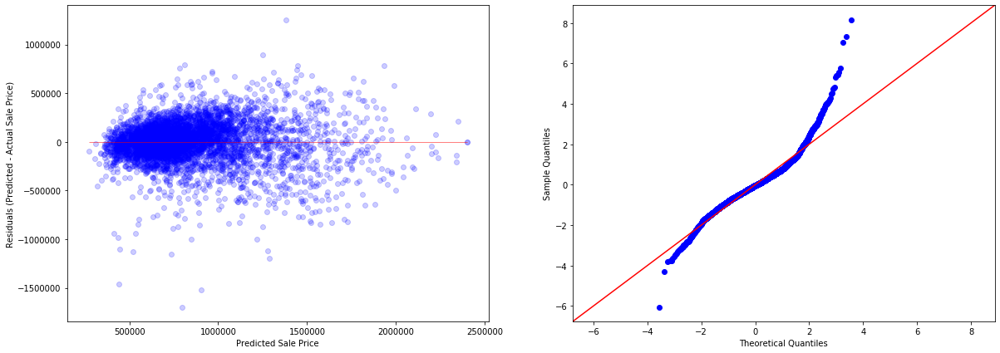

In [512]:
check_lr_assumptions(model_7_seattle_stepwise, df_7_seattle, outcome, predictors_seattle)

In [513]:
append_results('model_7_seattle_stepwise', formula, model_7_seattle_stepwise, df_7_seattle, outcome, predictors_seattle, 
               note=f'stepwise selection in seattle region, {len(predictors_seattle)} predictors')

,Model,Formula,R-Squared,Rainbow statistic,Rainbow p-value,Linearity Assumption,Jarque-Bera statistic,Jarque-Bera p-value,Normality Assumption,Lagrange Multiplier p-value,F-statistic p-value,Homoskedasticity Assumption,Multicollinearity,Independence Assumption,Note
0,sm_1,SalePrice ~ SqFtTotLiving,0.386491,0.872905,1.000000e+00,Satisfied,1.305055e+07,0.000000e+00,Violated,NaN,3.931011e-82,Violated,N/A,N/A,"with outliers, no transform"
1,sm_2,SalePrice ~ SqFtTotLiving,0.399934,1.027984,9.517113e-02,Satisfied,8.752700e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers with z-score
2,sm_2_log,log_SalePrice ~ log_SqFtTotLiving,0.291863,1.352501,1.084791e-46,Violated,3.094762e+06,0.000000e+00,Violated,NaN,1.163439e-59,Violated,N/A,N/A,remove SalePrice outliers w/ z-scores then log...
3,sm_2_sqrt,sqrt_SalePrice ~ sqrt_SqFtTotLiving,0.379239,1.053338,6.839964e-03,Violated,1.509920e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt tr...
4,sm_2_sqrt_2,SalePrice ~ sqrt_SqFtTotLiving,0.375599,1.033779,5.747716e-02,Satisfied,8.842146e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt on...
5,sm_2_sqrt_3,sqrt_SalePrice ~ SqFtTotLiving,0.393446,1.050943,9.197660e-03,Violated,1.577432e+03,0.000000e+00,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ z-score & sqrt on...
6,sm_3,SalePrice ~ SqFtTotLiving,0.308273,0.991329,6.565131e-01,Satisfied,1.038380e+03,3.300538e-226,Violated,NaN,0.000000e+00,Violated,N/A,N/A,remove SalePrice outliers w/ IQR
7,model_2_sqrt,SalePrice ~ SqFtTotLiving + sqrt_SqFtOpenPorch,0.401072,1.026429,1.079098e-01,Satisfied,8.651622e+03,0.000000e+00,Violated,0.000000e+00,0.000000e+00,Violated,,Satisfied,remove outliers w/ z-score & get sqrt of open ...
8,model_2_sqrt_all,sqrt_SalePrice ~ sqrt_SqFtTotLiving + sqrt_SqF...,0.380722,1.051251,8.860869e-03,Violated,1.487554e+03,0.000000e+00,Violated,0.000000e+00,0.000000e+00,Violated,,Satisfied,remove saleprice outliers w/ z-score & get sqr...
9,model_2_cat,SalePrice ~ SqFtTotLiving + has_OpenPorch,0.400308,1.027403,9.979305e-02,Satisfied,8.742264e+03,0.000000e+00,Violated,0.000000e+00,0.000000e+00,Violated,,Satisfied,remove saleprice outliers w/ z-score & convert...


In [516]:
model_7_seattle_stepwise.params.sort_values(ascending=False)

BldgGrade_12Luxury        1.323574e+06
BldgGrade_11Excellent     1.010147e+06
BathFullCount_5           9.647607e+05
BldgGrade_10VeryGood      7.799366e+05
BldgGrade_9Better         4.964302e+05
BldgGrade_8Good           2.509032e+05
Bedrooms_1                1.563462e+05
Intercept                 9.998694e+04
Stories_25                9.501144e+04
BldgGrade_7Average        9.153286e+04
BathHalfCount_2           8.540038e+04
Condition_VeryGood        6.391794e+04
HeatSystem_HeatPump       5.450907e+04
BathFullCount_3           4.423805e+04
FpMultiStory_1            4.390513e+04
Condition_Good            3.832264e+04
has_OpenPorch_1           2.450902e+04
Stories_20                2.257831e+04
has_Deck_1                2.177294e+04
Yrs_BeforeSold            2.139469e+03
SqFtTotLiving             2.148742e+02
HeatSource_Electricity   -3.606570e+04
DaylightBasement_Y       -3.789555e+04
has_EnclosedPorch_1      -3.856235e+04
TrafficNoise_HIGH        -4.452642e+04
FpAdditional_1           

In [518]:
# Save model result dataframe with pickle for future references
fname = os.path.join('..', '..', 'data', 'processed', 'model_results.pkl')
model_results.to_pickle(fname)